# Introduction to Deep Learning
## Assignment 2, Part 3

### Generative Models

<img src="https://lilianweng.github.io/lil-log/assets/images/three-generative-models.png" width="500"> 


In this notebook we are going to cover two generative models for generating novel images:

1. Variational Autoencoders (VAEs)
2. Generative adversarial networks (GANs)

Your main goal will be to retrain these models on a dataset of your choice and do some experiments on the learned latent space.

You should first copy this notebook and enable GPU runtime in 'Runtime -> Change runtime type -> Hardware acceleration -> GPU **OR** TPU'.


In [1]:
from tqdm import tqdm
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive', force_remount=False)
import pickle


Mounted at /content/drive



### Dataset

This dataset is called [Flickr-Faces-HQ Dataset](https://github.com/NVlabs/ffhq-dataset). Here we will use a downsampled version of it (64x64x3) that will speed up all the experiments. [Download](https://surfdrive.surf.nl/files/index.php/s/LXBrnGGvUISlckW).

After downloading you should copy it to your google drive's main directory (or modify the code to load it from elsewhere).

After running the notebook on this default dataset you then need to find a dataset of your own.

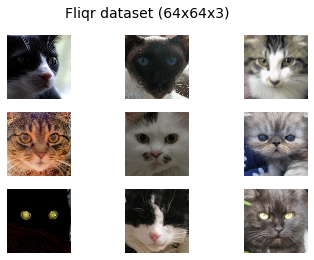

In [2]:
def load_real_samples(scale=False):
    # We load 20,000 samples only to avoid memory issues, you can  change this value
    #X = np.load('/content/drive/MyDrive/cats.npy')[:20000, :, :, :]
    #X = np.load('/content/drive/MyDrive/face_dataset_64x64.npy')[:20000, :, :, :] # face_dataset_64x64.npy
    X = np.load('/content/drive/MyDrive/ManyCats.npy')[:20000, :, :, :] # face_dataset_64x64.npy
    # Scale samples in range [-127, 127]
    if scale:
        X = (X - 127.5) * 2
    return X / 255.

# We will use this function to display the output of our models throughout this notebook
def grid_plot(images, epoch='', name='', n=3, save=False, scale=False):
    if scale:
        images = (images + 1) / 2.0
    for index in range(n * n):
        plt.subplot(n, n, 1 + index)
        plt.axis('off')
        plt.imshow(images[index])
    fig = plt.gcf()
    fig.suptitle(name + '  '+ str(epoch), fontsize=14)
    if save:
        filename = 'results/generated_plot_e%03d_f.png' % (epoch+1)
        plt.savefig(filename)
        plt.close()
    plt.show()


dataset = load_real_samples()
grid_plot(dataset[np.random.randint(0, 1000, 9)], name='Fliqr dataset (64x64x3)', n=3)

## 2.1. Introduction

The generative models that we are going to cover both have the following components:

1. A downsampling architecture (encoder in case of VAE, and discriminator in case of GAN) to either extract features from the data or model its distribution.
2. An upsampling architecture (decoder for VAE, generator for GAN) that will use some kind of latent vector to generate new samples that resemble the data that it was trained on.

Since we are going to be dealing with images, we are going to use convolutional networks for upsampling and downsampling, similar to what you see below.

<img src="https://i2.wp.com/sefiks.com/wp-content/uploads/2018/03/convolutional-autoencoder.png" width="500"> 


#### Code for building these components:

In [3]:
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Conv2DTranspose, Reshape

def build_conv_net(in_shape, out_shape, n_downsampling_layers=4, filters=128, out_activation='sigmoid'):
    """
    Build a basic convolutional network
    """
    model = tf.keras.Sequential()
    default_args=dict(kernel_size=(3,3), strides=(2,2), padding='same', activation='relu')

    model.add(Conv2D(input_shape=in_shape, **default_args, filters=filters))

    for _ in range(n_downsampling_layers):
        model.add(Conv2D(**default_args, filters=filters))

    model.add(Flatten())
    model.add(Dense(out_shape, activation=out_activation) )
    model.summary()
    return model


def build_deconv_net(latent_dim, n_upsampling_layers=4, filters=128, activation_out='sigmoid'):
    """
    Build a deconvolutional network for decoding/upscaling latent vectors

    When building the deconvolutional architecture, usually it is best to use the same layer sizes that 
    were used in the downsampling network and the Conv2DTranspose layers are used instead of Conv2D layers. 
    Using identical layers and hyperparameters ensures that the dimensionality of our output matches the
    shape of our input images. 
    """

    model = tf.keras.Sequential()
    model.add(Dense(4 * 4 * 64, input_dim=latent_dim)) 
    model.add(Reshape((4, 4, 64))) # This matches the output size of the downsampling architecture
    default_args=dict(kernel_size=(3,3), strides=(2,2), padding='same', activation='relu')
    
    for i in range(n_upsampling_layers):
        model.add(Conv2DTranspose(**default_args, filters=filters))

    # This last convolutional layer converts back to 3 channel RGB image
    model.add(Conv2D(filters=3, kernel_size=(3,3), activation=activation_out, padding='same'))
    model.summary()
    return model

### Convolutional Autoencoder example

Using these two basic building blocks we can now build a Convolutional Autoencoder (CAE).

<img src="https://lilianweng.github.io/lil-log/assets/images/autoencoder-architecture.png" width="500"> 



Even though it's not a generative model, CAE is a great way to illustrate how these two components (convolutional and deconvolutional networks) can be used together to reconstruct images.

You can view such model as a compression/dimensionality reduction method as each image gets compressed to a vector of 256 numbers by the encoder and gets decompressed back into an image using the decoder network.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 128)       3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       147584    
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 conv2d_3 (Conv2D)           (None, 4, 4, 128)         147584    
                                                                 
 conv2d_4 (Conv2D)           (None, 2, 2, 128)         147584    
                                                                 
 flatten (Flatten)           (None, 512)               0         
                                                                 
 dense (Dense)               (None, 512)               2

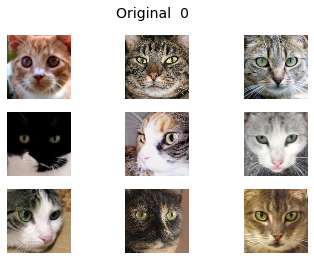

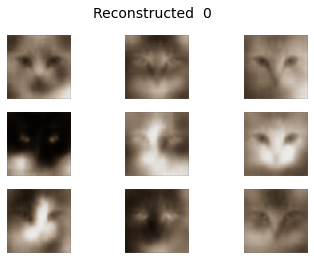


Epoch:  1
1/1 [==============================] - 0s 189ms/step


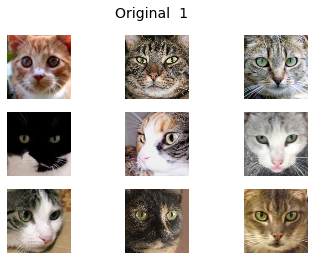

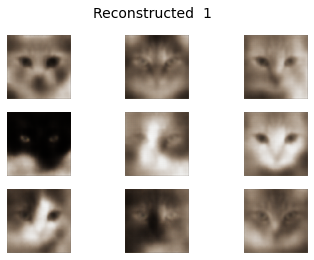


Epoch:  2
1/1 [==============================] - 0s 183ms/step


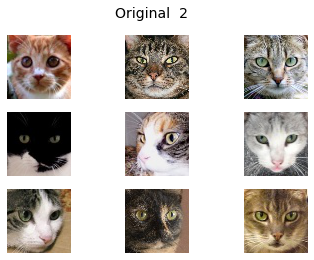

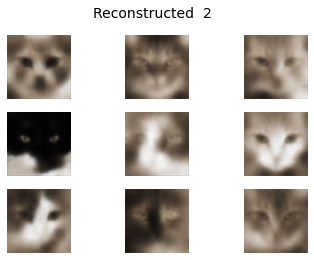


Epoch:  3
1/1 [==============================] - 0s 197ms/step


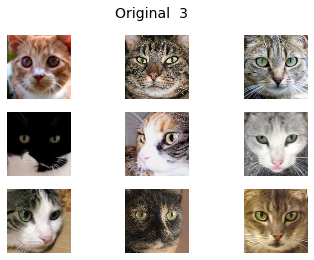

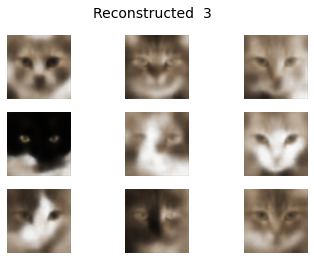


Epoch:  4
1/1 [==============================] - 0s 195ms/step


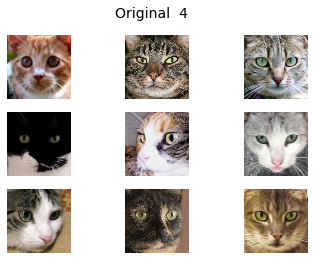

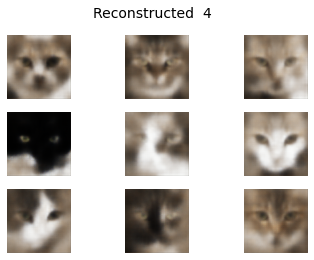


Epoch:  5
303/313 [============================>.] - ETA: 41s - loss: 0.5618

In [ ]:
def build_convolutional_autoencoder(data_shape, latent_dim, filters=128):
    encoder = build_conv_net(in_shape=data_shape, out_shape=latent_dim, filters=filters)
    decoder = build_deconv_net(latent_dim, activation_out='sigmoid', filters=filters)

    # We connect encoder and decoder into a single model
    autoencoder = tf.keras.Sequential([encoder, decoder])
    
    # Binary crossentropy loss - pairwise comparison between input and output pixels
    autoencoder.compile(loss='binary_crossentropy', optimizer='adam')

    return autoencoder


# Defining the model dimensions and building it
image_size = dataset.shape[1:]
latent_dim = 512
num_filters = 128
cae = build_convolutional_autoencoder(image_size, latent_dim, num_filters)

for epoch in range(10):
    print('\nEpoch: ', epoch)

    # Note that (X=y) when training autoencoders!
    # In this case we only care about qualitative performance, we don't split into train/test sets
    cae.fit(x=dataset, y=dataset, epochs=1, batch_size=64)
    
    samples = dataset[:9]
    reconstructed = cae.predict(samples)
    grid_plot(samples, epoch, name='Original', n=3, save=False)
    grid_plot(reconstructed, epoch, name='Reconstructed', n=3, save=False)

*Note: You may experiment with the latent dimensionality and number of filters in your convolutional network to see how it affects the reconstruction quality. Remember that this also affects the size of the model and time it takes to train.*

--- 
---


## 2. 2. Variational Autoencoders (VAEs)

<img src="https://lilianweng.github.io/lil-log/assets/images/vae-gaussian.png" width="500"> 

#### Encoder network
This defines the approximate posterior distribution, which takes as input an observation and outputs a set of parameters for specifying the conditional distribution of the latent representation. In this example, we simply model the distribution as a diagonal Gaussian, and the network outputs the mean and log-variance parameters of a factorized Gaussian. We output log-variance instead of the variance directly for numerical stability.

#### Decoder network
This defines the conditional distribution of the observation $z$, which takes a latent sample $z$ as input and outputs the parameters for a conditional distribution of the observation. We model the latent distribution prior  as a unit Gaussian.

#### Reparameterization trick
To generate a sample  for the decoder during training, we can sample from the latent distribution defined by the parameters outputted by the encoder, given an input observation $z$. However, this sampling operation creates a bottleneck because backpropagation cannot flow through a random node.

To address this, we use a reparameterization trick. In our example, we approximate  using the decoder parameters and another parameter  as follows:

$$z = \mu + \sigma\epsilon$$

where $\mu$ and $\sigma$  represent the mean and standard deviation of a Gaussian distribution respectively. They can be derived from the decoder output. The  can be thought of as a random noise used to maintain stochasticity of $z$. We generate  from a standard normal distribution.

The latent variable  is now generated by a function of $\mu$ and $\sigma$ which would enable the model to backpropagate gradients in the encoder through $\mu$ and $\sigma$ respectively, while maintaining stochasticity through $\epsilon$.

#### Implementation 

You can see how this trick is implemented below by creating a custom layer by sublassing tf.keras.layers.Layer.
It is then connected to the output of the original encoder architecture and an additional [KL](https://en.wikipedia.org/wiki/Kullback–Leibler_divergence) loss term is introduced.


In [ ]:
class Sampling(tf.keras.layers.Layer):
    """
    Custom layer for the variational autoencoder
    It takes two vectors as input - one for means and other for variances of the latent variables described by a multimodal gaussian
    Its output is a latent vector randomly sampled from this distribution
    """
    def call(self, inputs):
        z_mean, z_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_var) * epsilon

def build_vae(data_shape, latent_dim, filters=128):

    # Building the encoder - starts with a simple downsampling convolutional network  
    encoder = build_conv_net(data_shape, latent_dim*2, filters=filters)
    
    # Adding special sampling layer that uses the reparametrization trick 
    z_mean = Dense(latent_dim)(encoder.output)
    z_var = Dense(latent_dim)(encoder.output)
    z = Sampling()([z_mean, z_var])
    
    # Connecting the two encoder parts
    encoder = tf.keras.Model(inputs=encoder.input, outputs=z)

    # Defining the decoder which is a regular upsampling deconvolutional network
    decoder = build_deconv_net(latent_dim, activation_out='sigmoid', filters=filters)
    vae = tf.keras.Model(inputs=encoder.input, outputs=decoder(z))
    
    # Adding the special loss term
    kl_loss = -0.5 * tf.reduce_sum(z_var - tf.square(z_mean) - tf.exp(z_var) + 1)
    vae.add_loss(kl_loss/tf.cast(tf.keras.backend.prod(data_shape), tf.float32))

    vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='binary_crossentropy')

    return encoder, decoder, vae


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 128)       3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       147584    
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 conv2d_3 (Conv2D)           (None, 4, 4, 128)         147584    
                                                                 
 conv2d_4 (Conv2D)           (None, 2, 2, 128)         147584    
                                                                 
 flatten (Flatten)           (None, 512)               0         
                                                                 
 dense (Dense)               (None, 100)               5

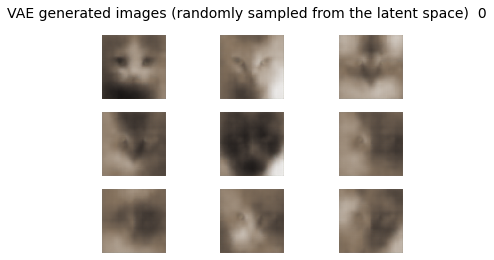

2500/2500 [==============================] - 27s 11ms/step - loss: 0.6009


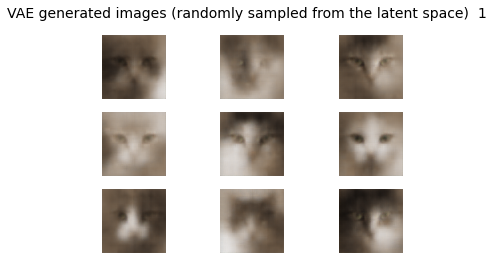

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5990


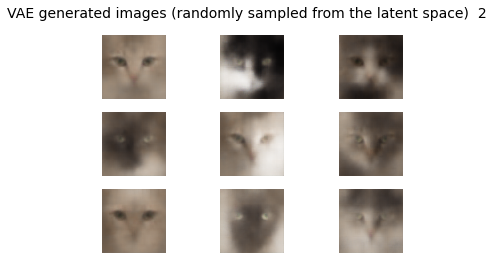

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5974


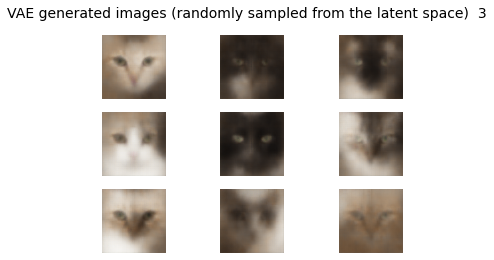

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5957


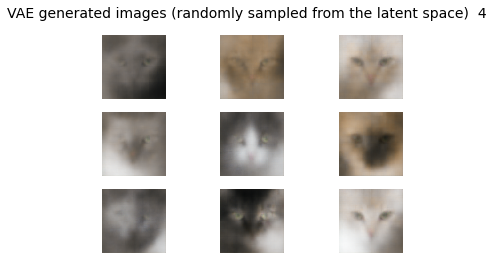

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5945


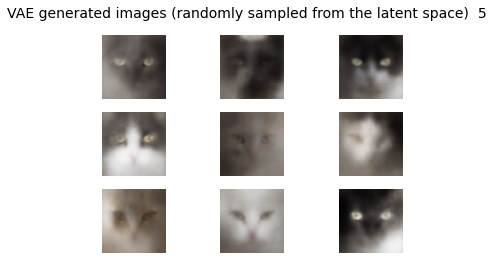

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5939


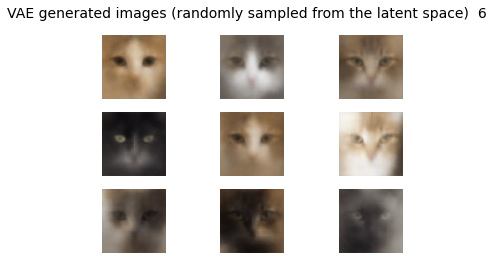

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5934


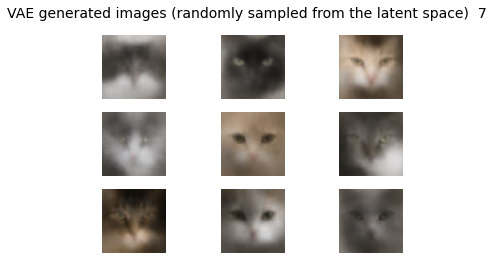

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5929


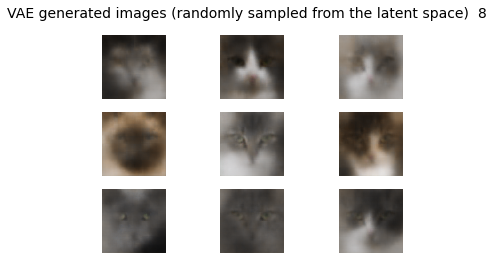

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5926


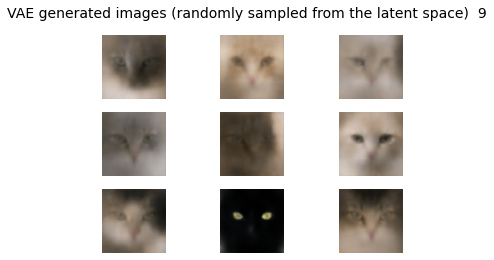

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5924


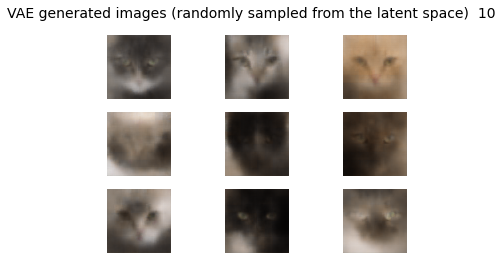

2500/2500 [==============================] - 29s 11ms/step - loss: 0.5921


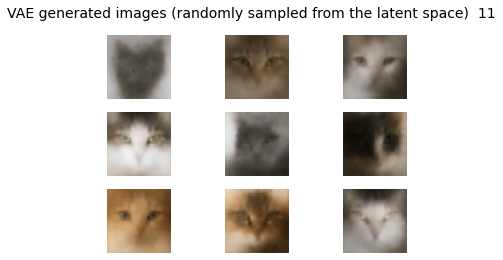

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5920


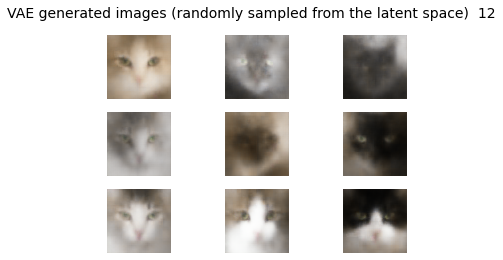

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5918


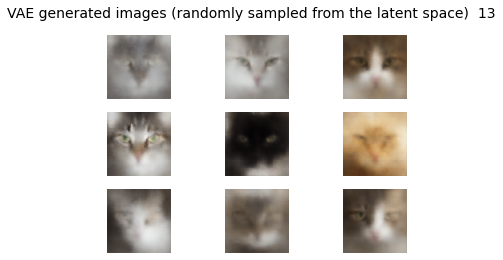

2500/2500 [==============================] - 29s 11ms/step - loss: 0.5917


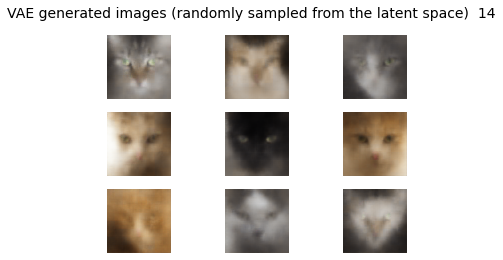

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5915


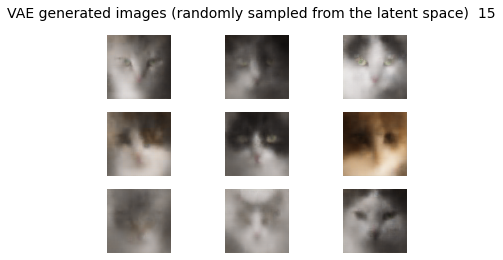

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5914


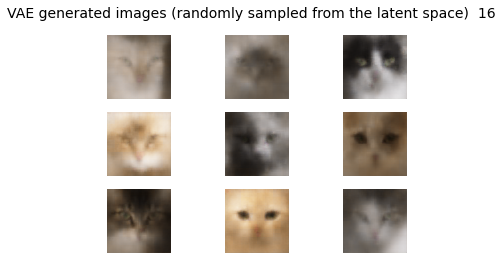

2500/2500 [==============================] - 31s 12ms/step - loss: 0.5913


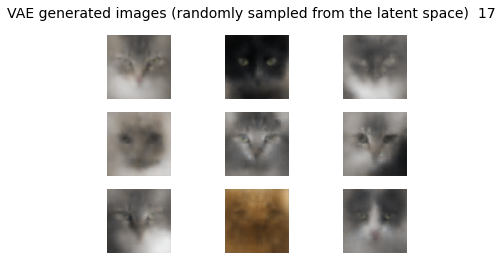

2500/2500 [==============================] - 30s 12ms/step - loss: 0.5911


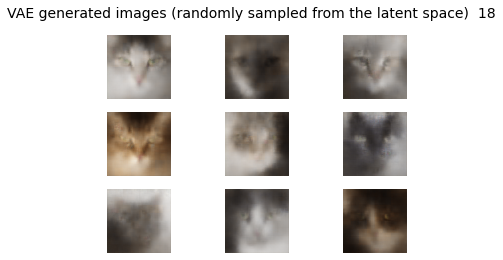

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5910


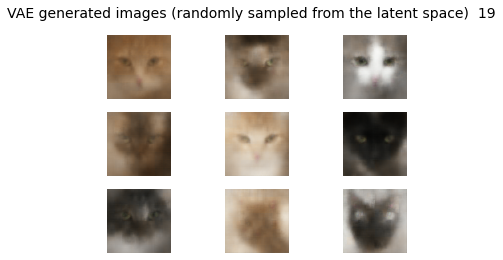

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5908


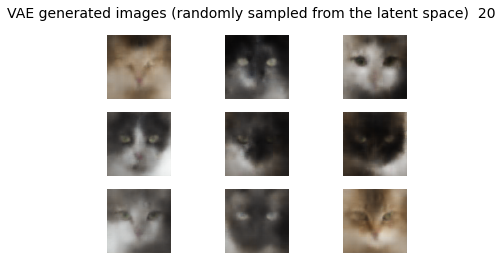

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5907


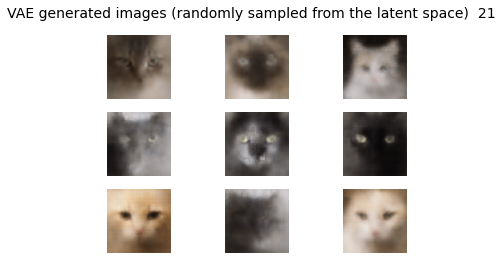

2500/2500 [==============================] - 30s 12ms/step - loss: 0.5906


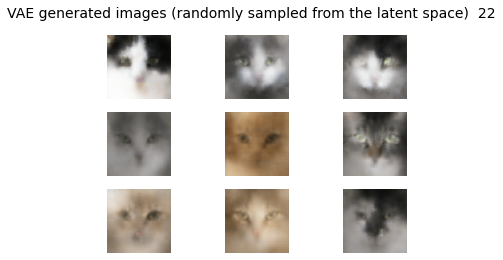

2500/2500 [==============================] - 30s 12ms/step - loss: 0.5905


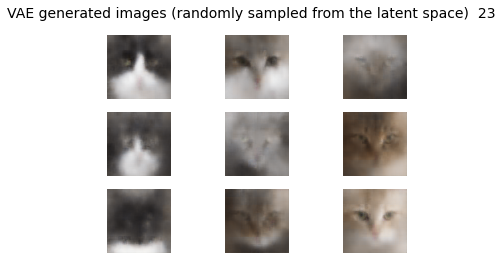

2500/2500 [==============================] - 30s 12ms/step - loss: 0.5904


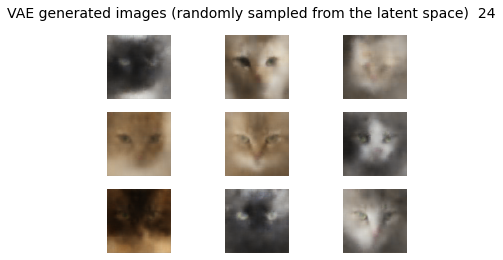

2500/2500 [==============================] - 29s 11ms/step - loss: 0.5903


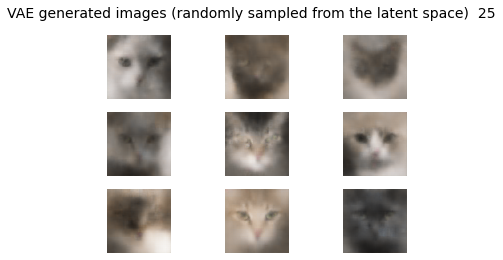

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5903


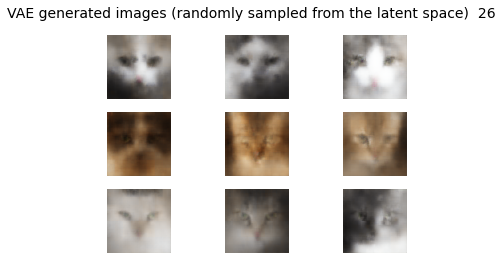

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5902


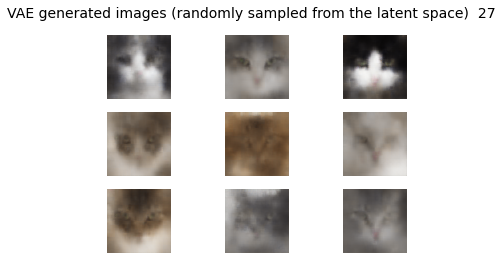

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5901


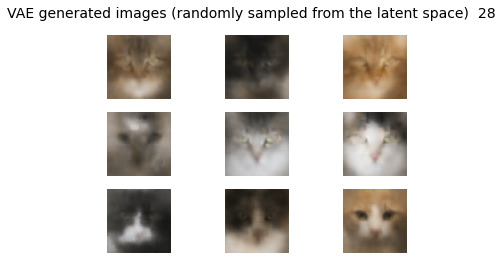

2500/2500 [==============================] - 30s 12ms/step - loss: 0.5900


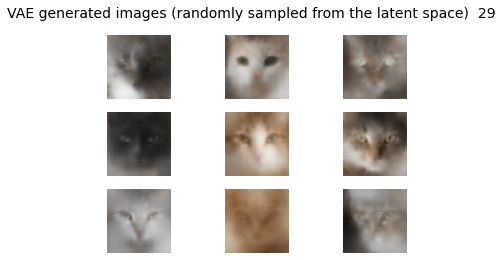

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5899


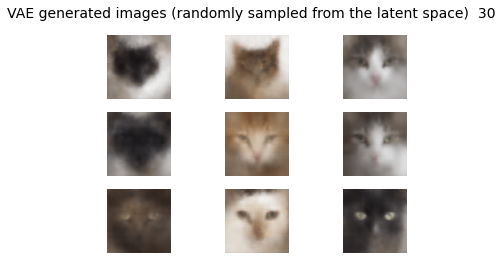

2500/2500 [==============================] - 30s 12ms/step - loss: 0.5898


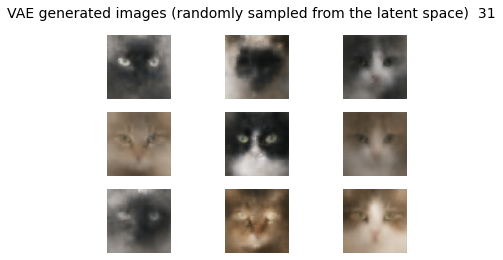

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5898


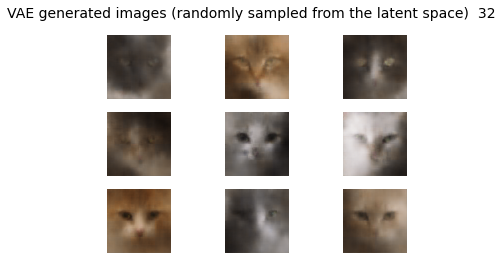

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5897


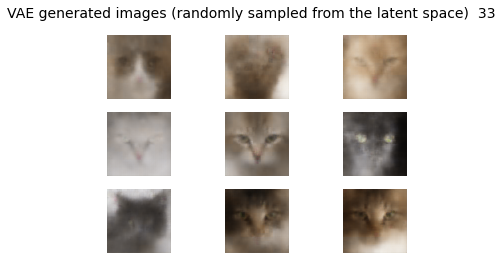

2500/2500 [==============================] - 30s 12ms/step - loss: 0.5896


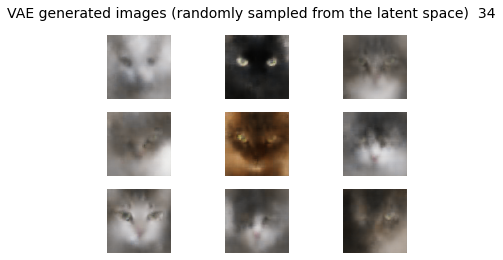

2500/2500 [==============================] - 31s 12ms/step - loss: 0.5896


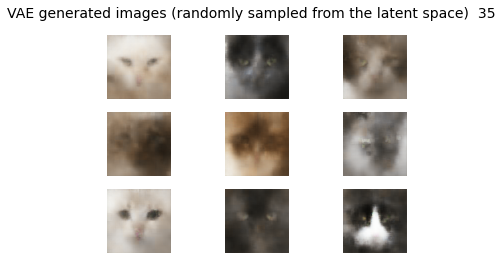

2500/2500 [==============================] - 32s 13ms/step - loss: 0.5895


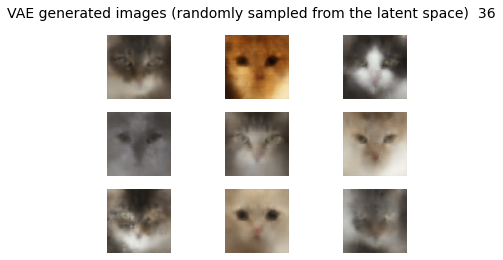

2500/2500 [==============================] - 30s 12ms/step - loss: 0.5895


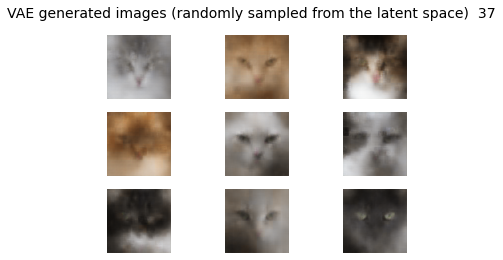

2500/2500 [==============================] - 30s 12ms/step - loss: 0.5894


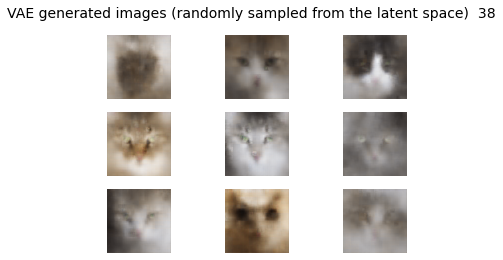

2500/2500 [==============================] - 31s 12ms/step - loss: 0.5894


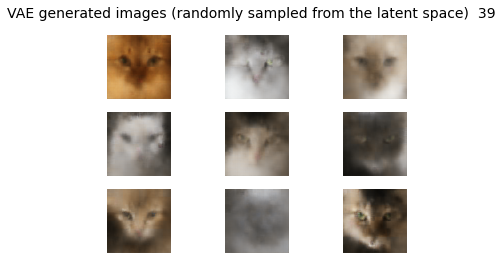

In [ ]:
# Training the VAE model

latent_dim = 50#32
encoder, decoder, vae = build_vae(dataset.shape[1:], latent_dim, filters=128) #128

#encoder = Lencoder
#decoder = Ldecoder
#vae = Lmodel
# Generate random vectors that we will use to sample our latent space
for epoch in range(40):
    latent_vectors = np.random.randn(9, latent_dim)
    vae.fit(x=dataset, y=dataset, epochs=1, batch_size=8)
    
    images = decoder(latent_vectors)
    grid_plot(images, epoch, name='VAE generated images (randomly sampled from the latent space)', n=3, save=False)

*Note: again, you might experiment with the latent dimensionality, batch size and the architecture of your convolutional nets to see how it affects the generative capabilities of this model.*

In [ ]:
#Storing the model
pickle.dump(vae, open("/content/drive/MyDrive/VAE-Katten_model2", 'wb'))
pickle.dump(encoder, open("/content/drive/MyDrive/VAE-Katten_encoder2", 'wb'))
pickle.dump(decoder, open("/content/drive/MyDrive/VAE-Katten_decoder2", 'wb'))

In [ ]:
#Loading the model
Lmodel = pickle.load(open("/content/drive/MyDrive/VAE-Katten_model", 'rb'))
Lencoder = pickle.load(open("/content/drive/MyDrive/VAE-Katten_encoder", 'rb'))
Ldecoder = pickle.load(open("/content/drive/MyDrive/VAE-Katten_decoder", 'rb'))

---

## 2.3 Generative Adversarial Networks (GANs)

### GAN architecture
Generative adversarial networks consist of two models: a generative model and a discriminative model.

<img src="https://media.springernature.com/original/springer-static/image/chp%3A10.1007%2F978-1-4842-3679-6_8/MediaObjects/463582_1_En_8_Fig1_HTML.jpg" width="500"> 

**The discriminator** model is a classifier that determines whether a given image looks like a real image from the dataset or like an artificially created image. This is basically a binary classifier that will take the form of a normal convolutional neural network (CNN).
As an input this network will get samples both from the dataset that it is trained on and on the samples generated by the **generator**.

The **generator** model takes random input values (noise) and transforms them into images through a deconvolutional neural network.

Over the course of many training iterations, the weights and biases in the discriminator and the generator are trained through backpropagation. The discriminator learns to tell "real" images of handwritten digits apart from "fake" images created by the generator. At the same time, the generator uses feedback from the discriminator to learn how to produce convincing images that the discriminator can't distinguish from real images.




In [ ]:
def build_gan(data_shape, latent_dim, filters=128, lr=0.0002, beta_1=0.5):
    optimizer = tf.optimizers.Adam(learning_rate=lr, beta_1=beta_1)

    # Usually thew GAN generator has tanh activation function in the output layer
    generator = build_deconv_net(latent_dim, activation_out='tanh', filters=filters)
    
    # Build and compile the discriminator
    discriminator = build_conv_net(in_shape=data_shape, out_shape=1, filters=filters) # Single output for binary classification
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    
    # End-to-end GAN model for training the generator
    discriminator.trainable = False
    true_fake_prediction = discriminator(generator.output)
    GAN = tf.keras.Model(inputs=generator.input, outputs=true_fake_prediction)
    GAN = tf.keras.models.Sequential([generator, discriminator])
    GAN.compile(loss='binary_crossentropy', optimizer=optimizer)
    
    return discriminator, generator, GAN


### Definining custom functions for training your GANs

---




In [ ]:
def run_generator(generator, n_samples=100):
    """
    Run the generator model and generate n samples of synthetic images using random latent vectors
    """
    latent_dim = generator.layers[0].input_shape[-1]
    generator_input = np.random.randn(n_samples, latent_dim)

    return generator.predict(generator_input)
    

def get_batch(generator, dataset, batch_size=64):
    """
    Gets a single batch of samples (X) and labels (y) for the training the discriminator.
    One half from the real dataset (labeled as 1s), the other created by the generator model (labeled as 0s).
    """
    batch_size //= 2 # Split evenly among fake and real samples

    fake_data = run_generator(generator, n_samples=batch_size)
    real_data = dataset[np.random.randint(0, dataset.shape[0], batch_size)]

    X = np.concatenate([fake_data, real_data], axis=0)
    y = np.concatenate([np.zeros([batch_size, 1]), np.ones([batch_size, 1])], axis=0)

    return X, y


def train_gan(generator, discriminator, gan, dataset, latent_dim, n_epochs=20, batch_size=64):

    batches_per_epoch = int(dataset.shape[0] / batch_size / 2)
    for epoch in range(n_epochs):
        for batch in tqdm(range(batches_per_epoch)):
            
            # 1) Train discriminator both on real and synthesized images
            X, y = get_batch(generator, dataset, batch_size=batch_size)
            discriminator_loss = discriminator.train_on_batch(X, y)

            # 2) Train generator (note that now the label of synthetic images is reversed to 1)
            X_gan = np.random.randn(batch_size, latent_dim)
            y_gan = np.ones([batch_size, 1])
            generator_loss = gan.train_on_batch(X_gan, y_gan)

        noise = np.random.randn(16, latent_dim) #Use this for generating random vectors
        images = generator.predict(noise)
        grid_plot(images, epoch, name='GAN generated images', n=3, save=False, scale=True)


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 1024)              263168    
                                                                 
 reshape_1 (Reshape)         (None, 4, 4, 64)          0         
                                                                 
 conv2d_transpose_4 (Conv2DT  (None, 8, 8, 128)        73856     
 ranspose)                                                       
                                                                 
 conv2d_transpose_5 (Conv2DT  (None, 16, 16, 128)      147584    
 ranspose)                                                       
                                                                 
 conv2d_transpose_6 (Conv2DT  (None, 32, 32, 128)      147584    
 ranspose)                                                       
                                                      

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 397ms/step


  1%|          | 1/156 [00:02<06:46,  2.62s/it]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 2/156 [00:02<02:58,  1.16s/it]

1/1 [==============================] - 0s 12ms/step


  2%|▏         | 3/156 [00:02<01:45,  1.45it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 4/156 [00:03<01:11,  2.13it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 5/156 [00:03<00:53,  2.85it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 6/156 [00:03<00:41,  3.61it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 7/156 [00:03<00:34,  4.32it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 8/156 [00:03<00:29,  5.02it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 9/156 [00:03<00:26,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 10/156 [00:03<00:24,  5.86it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 11/156 [00:03<00:23,  6.18it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 12/156 [00:04<00:22,  6.54it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 13/156 [00:04<00:21,  6.69it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 14/156 [00:04<00:20,  6.93it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 15/156 [00:04<00:20,  6.99it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 16/156 [00:04<00:19,  7.15it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 17/156 [00:04<00:19,  7.02it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 18/156 [00:04<00:19,  7.16it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 19/156 [00:05<00:18,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:05<00:18,  7.24it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 21/156 [00:05<00:18,  7.17it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 22/156 [00:05<00:18,  7.30it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 23/156 [00:05<00:18,  7.08it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 24/156 [00:05<00:18,  7.24it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 25/156 [00:05<00:18,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 26/156 [00:06<00:18,  6.88it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 27/156 [00:06<00:18,  6.97it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 28/156 [00:06<00:18,  7.05it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▊        | 29/156 [00:06<00:18,  7.03it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 30/156 [00:06<00:17,  7.18it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 31/156 [00:06<00:17,  7.20it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 32/156 [00:06<00:17,  7.17it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 33/156 [00:07<00:16,  7.24it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 34/156 [00:07<00:17,  7.14it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 35/156 [00:07<00:17,  7.03it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 36/156 [00:07<00:17,  7.06it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▎       | 37/156 [00:07<00:17,  6.95it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 38/156 [00:07<00:16,  7.10it/s]

1/1 [==============================] - 0s 12ms/step


 25%|██▌       | 39/156 [00:07<00:16,  7.20it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 40/156 [00:08<00:15,  7.34it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▋       | 41/156 [00:08<00:15,  7.28it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 42/156 [00:08<00:15,  7.21it/s]

1/1 [==============================] - 0s 12ms/step


 28%|██▊       | 43/156 [00:08<00:15,  7.32it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 44/156 [00:08<00:15,  7.21it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 45/156 [00:08<00:15,  7.18it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 46/156 [00:08<00:15,  7.29it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 47/156 [00:08<00:14,  7.31it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 48/156 [00:09<00:14,  7.41it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 49/156 [00:09<00:14,  7.16it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 50/156 [00:09<00:14,  7.16it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 51/156 [00:09<00:14,  7.24it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 52/156 [00:09<00:14,  7.16it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 53/156 [00:09<00:14,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 54/156 [00:09<00:14,  7.14it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 55/156 [00:10<00:14,  7.10it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 56/156 [00:10<00:14,  7.08it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 57/156 [00:10<00:13,  7.13it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 58/156 [00:10<00:13,  7.08it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 59/156 [00:10<00:13,  7.01it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 60/156 [00:10<00:13,  7.17it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 61/156 [00:10<00:13,  7.23it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 62/156 [00:11<00:13,  7.23it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 63/156 [00:11<00:12,  7.19it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 64/156 [00:11<00:12,  7.22it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 65/156 [00:11<00:12,  7.12it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 66/156 [00:11<00:12,  7.11it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 67/156 [00:11<00:12,  7.16it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 68/156 [00:11<00:12,  7.06it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 69/156 [00:12<00:12,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 70/156 [00:12<00:12,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 71/156 [00:12<00:12,  6.70it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 72/156 [00:12<00:12,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 73/156 [00:12<00:12,  6.77it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 74/156 [00:12<00:11,  6.83it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 75/156 [00:12<00:11,  6.91it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 76/156 [00:13<00:11,  6.93it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 77/156 [00:13<00:11,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 78/156 [00:13<00:11,  6.98it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 79/156 [00:13<00:10,  7.13it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 80/156 [00:13<00:10,  7.28it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 81/156 [00:13<00:10,  7.30it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 82/156 [00:13<00:09,  7.42it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 83/156 [00:14<00:09,  7.45it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 84/156 [00:14<00:09,  7.50it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 85/156 [00:14<00:09,  7.28it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 86/156 [00:14<00:09,  7.29it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:14<00:09,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 88/156 [00:14<00:09,  7.16it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 89/156 [00:14<00:09,  7.16it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 90/156 [00:15<00:09,  7.21it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 91/156 [00:15<00:09,  7.19it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 92/156 [00:15<00:09,  7.08it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 93/156 [00:15<00:08,  7.22it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 94/156 [00:15<00:08,  7.09it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 95/156 [00:15<00:08,  7.05it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 96/156 [00:15<00:08,  6.93it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 97/156 [00:16<00:08,  7.10it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 98/156 [00:16<00:08,  7.04it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 99/156 [00:16<00:08,  7.01it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 100/156 [00:16<00:08,  6.96it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 101/156 [00:16<00:07,  7.17it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 102/156 [00:16<00:07,  7.10it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 103/156 [00:16<00:07,  7.18it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 104/156 [00:17<00:07,  7.11it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 105/156 [00:17<00:07,  7.09it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 106/156 [00:17<00:07,  6.96it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 107/156 [00:17<00:07,  6.92it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 108/156 [00:17<00:06,  7.06it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 109/156 [00:17<00:06,  7.03it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 110/156 [00:17<00:06,  7.00it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 111/156 [00:18<00:06,  7.14it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 112/156 [00:18<00:06,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 113/156 [00:18<00:06,  7.10it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 114/156 [00:18<00:05,  7.12it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 115/156 [00:18<00:05,  7.11it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 116/156 [00:18<00:05,  7.01it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 117/156 [00:18<00:05,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 118/156 [00:19<00:05,  6.80it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 119/156 [00:19<00:05,  6.86it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 120/156 [00:19<00:05,  6.85it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 121/156 [00:19<00:05,  6.86it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 122/156 [00:19<00:04,  7.00it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 123/156 [00:19<00:04,  7.01it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 124/156 [00:19<00:04,  6.98it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 125/156 [00:20<00:04,  7.05it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 126/156 [00:20<00:04,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 127/156 [00:20<00:04,  7.08it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 128/156 [00:20<00:04,  6.79it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:20<00:03,  6.99it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 130/156 [00:20<00:03,  6.94it/s]

1/1 [==============================] - 0s 13ms/step


 84%|████████▍ | 131/156 [00:20<00:03,  6.92it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 132/156 [00:21<00:03,  6.91it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 133/156 [00:21<00:03,  7.02it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 134/156 [00:21<00:03,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 135/156 [00:21<00:02,  7.11it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 136/156 [00:21<00:02,  7.02it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 137/156 [00:21<00:02,  7.20it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 138/156 [00:21<00:02,  7.22it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 139/156 [00:22<00:02,  7.11it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 140/156 [00:22<00:02,  7.15it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 141/156 [00:22<00:02,  7.10it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 142/156 [00:22<00:01,  7.03it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 143/156 [00:22<00:01,  7.07it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 144/156 [00:22<00:01,  7.08it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 145/156 [00:22<00:01,  7.20it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 146/156 [00:22<00:01,  7.21it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 147/156 [00:23<00:01,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:23<00:01,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 149/156 [00:23<00:01,  6.99it/s]

1/1 [==============================] - 0s 13ms/step


 96%|█████████▌| 150/156 [00:23<00:00,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 151/156 [00:23<00:00,  6.95it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 152/156 [00:23<00:00,  6.95it/s]

1/1 [==============================] - 0s 13ms/step


 98%|█████████▊| 153/156 [00:23<00:00,  7.06it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 154/156 [00:24<00:00,  7.12it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 155/156 [00:24<00:00,  7.08it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 156/156 [00:24<00:00,  6.39it/s]


1/1 [==============================] - 0s 241ms/step


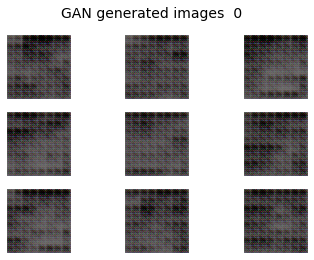

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 1/156 [00:00<00:24,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 2/156 [00:00<00:22,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 3/156 [00:00<00:22,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 4/156 [00:00<00:23,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 5/156 [00:00<00:22,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 6/156 [00:00<00:22,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 7/156 [00:01<00:22,  6.77it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 8/156 [00:01<00:21,  6.85it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 9/156 [00:01<00:21,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 10/156 [00:01<00:21,  6.77it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 11/156 [00:01<00:21,  6.73it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 12/156 [00:01<00:21,  6.79it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 13/156 [00:01<00:20,  6.89it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 14/156 [00:02<00:20,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 15/156 [00:02<00:20,  6.88it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 16/156 [00:02<00:20,  6.93it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 17/156 [00:02<00:20,  6.94it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 18/156 [00:02<00:20,  6.83it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 19/156 [00:02<00:20,  6.84it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 20/156 [00:02<00:20,  6.75it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 21/156 [00:03<00:19,  6.84it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 22/156 [00:03<00:19,  6.83it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 23/156 [00:03<00:19,  6.88it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 24/156 [00:03<00:19,  6.83it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 25/156 [00:03<00:19,  6.87it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 26/156 [00:03<00:18,  6.95it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 27/156 [00:03<00:18,  7.05it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 28/156 [00:04<00:18,  6.98it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 29/156 [00:04<00:18,  7.04it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 30/156 [00:04<00:18,  6.88it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 31/156 [00:04<00:18,  6.87it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 32/156 [00:04<00:18,  6.76it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 33/156 [00:04<00:18,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 34/156 [00:05<00:18,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 35/156 [00:05<00:18,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:05<00:18,  6.58it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 37/156 [00:05<00:17,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 38/156 [00:05<00:17,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 39/156 [00:05<00:17,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 40/156 [00:05<00:17,  6.70it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 41/156 [00:06<00:16,  6.77it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 42/156 [00:06<00:17,  6.69it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 43/156 [00:06<00:16,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 44/156 [00:06<00:16,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 45/156 [00:06<00:16,  6.86it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 46/156 [00:06<00:15,  6.88it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 47/156 [00:06<00:15,  6.96it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 48/156 [00:07<00:15,  6.93it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 49/156 [00:07<00:15,  7.01it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 50/156 [00:07<00:15,  6.90it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 51/156 [00:07<00:15,  6.89it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 52/156 [00:07<00:15,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 53/156 [00:07<00:15,  6.85it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 54/156 [00:07<00:15,  6.71it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:08<00:14,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 56/156 [00:08<00:14,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 57/156 [00:08<00:14,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 58/156 [00:08<00:14,  6.76it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 59/156 [00:08<00:14,  6.80it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 60/156 [00:08<00:14,  6.83it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 61/156 [00:08<00:13,  6.94it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 62/156 [00:09<00:13,  6.90it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 63/156 [00:09<00:13,  6.79it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 64/156 [00:09<00:13,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 65/156 [00:09<00:13,  6.66it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 66/156 [00:09<00:13,  6.73it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 67/156 [00:09<00:13,  6.74it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 68/156 [00:09<00:12,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 69/156 [00:10<00:12,  6.84it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 70/156 [00:10<00:12,  6.88it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 71/156 [00:10<00:12,  6.84it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 72/156 [00:10<00:12,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 73/156 [00:10<00:12,  6.87it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 74/156 [00:10<00:11,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 75/156 [00:11<00:12,  6.72it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 76/156 [00:11<00:11,  6.78it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 77/156 [00:11<00:11,  6.87it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 78/156 [00:11<00:11,  6.83it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 79/156 [00:11<00:11,  6.95it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 80/156 [00:11<00:10,  6.96it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 81/156 [00:11<00:11,  6.78it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 82/156 [00:12<00:10,  6.83it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:12<00:10,  6.81it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 84/156 [00:12<00:10,  6.94it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:12<00:10,  6.80it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 86/156 [00:12<00:10,  6.87it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:12<00:10,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 88/156 [00:12<00:10,  6.75it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 89/156 [00:13<00:10,  6.70it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 90/156 [00:13<00:09,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 91/156 [00:13<00:09,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 92/156 [00:13<00:09,  6.92it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 93/156 [00:13<00:09,  6.93it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 94/156 [00:13<00:08,  7.04it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 95/156 [00:13<00:08,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 96/156 [00:14<00:08,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 97/156 [00:14<00:08,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 98/156 [00:14<00:08,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 99/156 [00:14<00:08,  6.75it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 100/156 [00:14<00:08,  6.76it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 101/156 [00:14<00:08,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 102/156 [00:14<00:07,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 103/156 [00:15<00:07,  6.86it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 104/156 [00:15<00:07,  6.97it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 105/156 [00:15<00:07,  6.91it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 106/156 [00:15<00:07,  6.99it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 107/156 [00:15<00:07,  6.98it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 108/156 [00:15<00:06,  6.89it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 109/156 [00:15<00:06,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 110/156 [00:16<00:06,  6.69it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 111/156 [00:16<00:06,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 112/156 [00:16<00:06,  6.92it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 113/156 [00:16<00:06,  7.01it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 114/156 [00:16<00:06,  7.00it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 115/156 [00:16<00:05,  7.03it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 116/156 [00:16<00:05,  6.98it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 117/156 [00:17<00:05,  7.02it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 118/156 [00:17<00:05,  7.02it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 119/156 [00:17<00:05,  6.94it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 120/156 [00:17<00:05,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 121/156 [00:17<00:05,  6.73it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 122/156 [00:17<00:05,  6.71it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 123/156 [00:18<00:05,  6.56it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 124/156 [00:18<00:04,  6.68it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 125/156 [00:18<00:04,  6.71it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 126/156 [00:18<00:04,  6.58it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:18<00:04,  6.71it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 128/156 [00:18<00:04,  6.82it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 129/156 [00:18<00:03,  6.85it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 130/156 [00:19<00:03,  6.73it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 131/156 [00:19<00:03,  6.76it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 132/156 [00:19<00:03,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 133/156 [00:19<00:03,  6.81it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 134/156 [00:19<00:03,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 135/156 [00:19<00:03,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 136/156 [00:19<00:03,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 137/156 [00:20<00:02,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 138/156 [00:20<00:02,  6.68it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 139/156 [00:20<00:02,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 140/156 [00:20<00:02,  6.77it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 141/156 [00:20<00:02,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:20<00:02,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 143/156 [00:21<00:01,  6.79it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 144/156 [00:21<00:01,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 145/156 [00:21<00:01,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 146/156 [00:21<00:01,  6.90it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 147/156 [00:21<00:01,  6.90it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 148/156 [00:21<00:01,  6.86it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 149/156 [00:21<00:01,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 150/156 [00:22<00:00,  6.95it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 151/156 [00:22<00:00,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 152/156 [00:22<00:00,  6.72it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 153/156 [00:22<00:00,  6.76it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 154/156 [00:22<00:00,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 155/156 [00:22<00:00,  6.70it/s]

1/1 [==============================] - 0s 13ms/step


100%|██████████| 156/156 [00:22<00:00,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


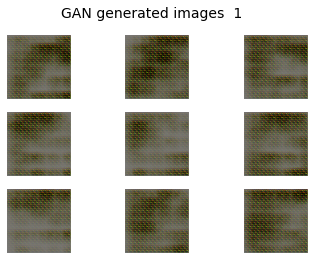

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 1/156 [00:00<00:24,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 2/156 [00:00<00:23,  6.56it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 3/156 [00:00<00:22,  6.82it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 4/156 [00:00<00:22,  6.79it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 5/156 [00:00<00:22,  6.85it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/156 [00:00<00:22,  6.76it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 7/156 [00:01<00:21,  6.81it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 8/156 [00:01<00:21,  6.82it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 9/156 [00:01<00:21,  6.89it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 10/156 [00:01<00:21,  6.83it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 11/156 [00:01<00:21,  6.83it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 12/156 [00:01<00:21,  6.82it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 13/156 [00:01<00:20,  6.84it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 14/156 [00:02<00:20,  6.84it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 15/156 [00:02<00:20,  6.80it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 16/156 [00:02<00:20,  6.75it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 17/156 [00:02<00:20,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 18/156 [00:02<00:20,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 19/156 [00:02<00:19,  6.88it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 20/156 [00:02<00:19,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 21/156 [00:03<00:19,  6.86it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 22/156 [00:03<00:19,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 23/156 [00:03<00:19,  6.84it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 24/156 [00:03<00:19,  6.89it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 25/156 [00:03<00:18,  6.89it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 26/156 [00:03<00:18,  6.85it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 27/156 [00:03<00:18,  6.89it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 28/156 [00:04<00:18,  6.84it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 29/156 [00:04<00:18,  6.71it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 30/156 [00:04<00:18,  6.75it/s]

1/1 [==============================] - 0s 13ms/step


 20%|█▉        | 31/156 [00:04<00:18,  6.84it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 32/156 [00:04<00:18,  6.73it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 33/156 [00:04<00:18,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 34/156 [00:05<00:18,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 35/156 [00:05<00:17,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 36/156 [00:05<00:19,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 37/156 [00:05<00:18,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 38/156 [00:05<00:18,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 39/156 [00:05<00:17,  6.68it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 40/156 [00:05<00:17,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 41/156 [00:06<00:17,  6.57it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 42/156 [00:06<00:17,  6.63it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 43/156 [00:06<00:16,  6.71it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 44/156 [00:06<00:17,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 45/156 [00:06<00:16,  6.60it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 46/156 [00:06<00:16,  6.63it/s]

1/1 [==============================] - 0s 13ms/step


 30%|███       | 47/156 [00:06<00:16,  6.73it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 48/156 [00:07<00:16,  6.60it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 49/156 [00:07<00:16,  6.65it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 50/156 [00:07<00:15,  6.68it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 51/156 [00:07<00:15,  6.84it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 52/156 [00:07<00:15,  6.82it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 53/156 [00:07<00:15,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 54/156 [00:08<00:14,  6.81it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 55/156 [00:08<00:14,  6.84it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 56/156 [00:08<00:14,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 57/156 [00:08<00:14,  6.72it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 58/156 [00:08<00:14,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 59/156 [00:08<00:14,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 60/156 [00:08<00:14,  6.81it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 61/156 [00:09<00:13,  6.95it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 62/156 [00:09<00:13,  6.83it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 63/156 [00:09<00:13,  6.84it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 64/156 [00:09<00:13,  6.85it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 65/156 [00:09<00:13,  6.80it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 66/156 [00:09<00:13,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 67/156 [00:09<00:13,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 68/156 [00:10<00:13,  6.72it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 69/156 [00:10<00:12,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 70/156 [00:10<00:12,  6.73it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 71/156 [00:10<00:12,  6.73it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 72/156 [00:10<00:12,  6.74it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 73/156 [00:10<00:12,  6.80it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 74/156 [00:10<00:11,  6.87it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 75/156 [00:11<00:11,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:11<00:11,  6.73it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 77/156 [00:11<00:11,  6.88it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 78/156 [00:11<00:11,  6.94it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 79/156 [00:11<00:11,  6.84it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 80/156 [00:11<00:11,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 81/156 [00:11<00:11,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 82/156 [00:12<00:11,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:12<00:10,  6.67it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 84/156 [00:12<00:10,  6.71it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 85/156 [00:12<00:10,  6.80it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 86/156 [00:12<00:10,  6.82it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:12<00:10,  6.80it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 88/156 [00:13<00:09,  6.88it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 89/156 [00:13<00:09,  6.75it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 90/156 [00:13<00:09,  6.73it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 91/156 [00:13<00:09,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 92/156 [00:13<00:09,  6.70it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 93/156 [00:13<00:09,  6.75it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 94/156 [00:13<00:09,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 95/156 [00:14<00:09,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:14<00:09,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 97/156 [00:14<00:08,  6.72it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 98/156 [00:14<00:08,  6.56it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 99/156 [00:14<00:08,  6.78it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 100/156 [00:14<00:08,  6.84it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 101/156 [00:14<00:07,  6.88it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 102/156 [00:15<00:07,  6.92it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 103/156 [00:15<00:07,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 104/156 [00:15<00:07,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 105/156 [00:15<00:07,  6.80it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 106/156 [00:15<00:07,  6.83it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 107/156 [00:15<00:07,  6.73it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 108/156 [00:15<00:07,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 109/156 [00:16<00:07,  6.64it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 110/156 [00:16<00:06,  6.63it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 111/156 [00:16<00:06,  6.68it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 112/156 [00:16<00:06,  6.70it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 113/156 [00:16<00:06,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 114/156 [00:16<00:06,  6.85it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 115/156 [00:17<00:06,  6.83it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 116/156 [00:17<00:05,  6.73it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 117/156 [00:17<00:05,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 118/156 [00:17<00:05,  6.73it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 119/156 [00:17<00:05,  6.67it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 120/156 [00:17<00:05,  6.65it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 121/156 [00:17<00:05,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 122/156 [00:18<00:05,  6.71it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 123/156 [00:18<00:05,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 124/156 [00:18<00:04,  6.59it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 125/156 [00:18<00:04,  6.68it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████  | 126/156 [00:18<00:04,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 127/156 [00:18<00:04,  6.63it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 128/156 [00:18<00:04,  6.67it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:19<00:03,  6.75it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 130/156 [00:19<00:03,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 131/156 [00:19<00:03,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 132/156 [00:19<00:03,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 133/156 [00:19<00:03,  6.65it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 134/156 [00:19<00:03,  6.60it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 135/156 [00:20<00:03,  6.63it/s]

1/1 [==============================] - 0s 13ms/step


 87%|████████▋ | 136/156 [00:20<00:02,  6.69it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 137/156 [00:20<00:02,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 138/156 [00:20<00:02,  6.66it/s]

1/1 [==============================] - 0s 13ms/step


 89%|████████▉ | 139/156 [00:20<00:02,  6.55it/s]

1/1 [==============================] - 0s 13ms/step


 90%|████████▉ | 140/156 [00:20<00:02,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 141/156 [00:20<00:02,  6.56it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 142/156 [00:21<00:02,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 143/156 [00:21<00:01,  6.74it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 144/156 [00:21<00:01,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 145/156 [00:21<00:01,  6.80it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 146/156 [00:21<00:01,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 147/156 [00:21<00:01,  6.79it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 148/156 [00:21<00:01,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 149/156 [00:22<00:01,  6.79it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 150/156 [00:22<00:00,  6.79it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 151/156 [00:22<00:00,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:22<00:00,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 153/156 [00:22<00:00,  6.88it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 154/156 [00:22<00:00,  6.86it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 155/156 [00:22<00:00,  6.83it/s]

1/1 [==============================] - 0s 13ms/step


100%|██████████| 156/156 [00:23<00:00,  6.74it/s]

1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 14ms/step


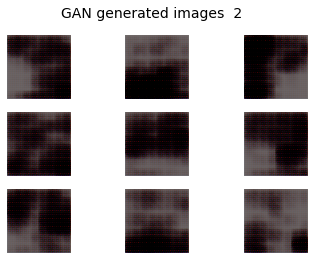

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 1/156 [00:00<00:24,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 2/156 [00:00<00:23,  6.55it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 3/156 [00:00<00:22,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 4/156 [00:00<00:22,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 5/156 [00:00<00:23,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 6/156 [00:00<00:22,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 7/156 [00:01<00:22,  6.67it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 8/156 [00:01<00:21,  6.74it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 9/156 [00:01<00:21,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 10/156 [00:01<00:22,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 11/156 [00:01<00:22,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 12/156 [00:01<00:22,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 13/156 [00:01<00:21,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:22,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 15/156 [00:02<00:21,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 16/156 [00:02<00:21,  6.57it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 17/156 [00:02<00:20,  6.64it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 18/156 [00:02<00:21,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 19/156 [00:02<00:20,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 20/156 [00:03<00:20,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 21/156 [00:03<00:20,  6.61it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 22/156 [00:03<00:20,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 23/156 [00:03<00:20,  6.64it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 24/156 [00:03<00:19,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:03<00:19,  6.66it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 26/156 [00:03<00:19,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 27/156 [00:04<00:19,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 28/156 [00:04<00:19,  6.55it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 29/156 [00:04<00:19,  6.67it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 30/156 [00:04<00:19,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 31/156 [00:04<00:19,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 32/156 [00:04<00:19,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 33/156 [00:05<00:18,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 34/156 [00:05<00:18,  6.50it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 35/156 [00:05<00:18,  6.60it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 36/156 [00:05<00:18,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 37/156 [00:05<00:18,  6.57it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 38/156 [00:05<00:18,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 39/156 [00:05<00:17,  6.62it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 40/156 [00:06<00:17,  6.64it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 41/156 [00:06<00:16,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 42/156 [00:06<00:17,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 43/156 [00:06<00:17,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 44/156 [00:06<00:16,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 45/156 [00:06<00:17,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 46/156 [00:07<00:16,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 47/156 [00:07<00:16,  6.59it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 48/156 [00:07<00:16,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 49/156 [00:07<00:16,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 50/156 [00:07<00:16,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 51/156 [00:07<00:16,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 52/156 [00:07<00:16,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 53/156 [00:08<00:15,  6.47it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 54/156 [00:08<00:15,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 55/156 [00:08<00:15,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 56/156 [00:08<00:15,  6.63it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 57/156 [00:08<00:14,  6.72it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 58/156 [00:08<00:14,  6.66it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 59/156 [00:08<00:14,  6.67it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 60/156 [00:09<00:14,  6.65it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 61/156 [00:09<00:14,  6.70it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 62/156 [00:09<00:14,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 63/156 [00:09<00:14,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 64/156 [00:09<00:14,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 65/156 [00:09<00:14,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 66/156 [00:10<00:13,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 67/156 [00:10<00:13,  6.59it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 68/156 [00:10<00:13,  6.60it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 69/156 [00:10<00:13,  6.62it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 70/156 [00:10<00:12,  6.67it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 71/156 [00:10<00:12,  6.69it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 72/156 [00:10<00:12,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 73/156 [00:11<00:12,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 74/156 [00:11<00:12,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 75/156 [00:11<00:13,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 76/156 [00:11<00:12,  6.19it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 77/156 [00:11<00:12,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 78/156 [00:11<00:12,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 79/156 [00:12<00:11,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 80/156 [00:12<00:11,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 81/156 [00:12<00:11,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 82/156 [00:12<00:11,  6.63it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:12<00:11,  6.60it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 84/156 [00:12<00:10,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 85/156 [00:12<00:10,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 86/156 [00:13<00:10,  6.64it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 87/156 [00:13<00:10,  6.60it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 88/156 [00:13<00:10,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 89/156 [00:13<00:10,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 90/156 [00:13<00:09,  6.66it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 91/156 [00:13<00:09,  6.64it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 92/156 [00:14<00:09,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 93/156 [00:14<00:09,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 94/156 [00:14<00:09,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 95/156 [00:14<00:09,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 96/156 [00:14<00:09,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 97/156 [00:14<00:09,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 98/156 [00:14<00:08,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 99/156 [00:15<00:08,  6.55it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 100/156 [00:15<00:08,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 101/156 [00:15<00:08,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 102/156 [00:15<00:08,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 103/156 [00:15<00:08,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 104/156 [00:15<00:08,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 105/156 [00:16<00:07,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 106/156 [00:16<00:07,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 107/156 [00:16<00:07,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 108/156 [00:16<00:07,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 109/156 [00:16<00:07,  6.51it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 110/156 [00:16<00:07,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 111/156 [00:16<00:06,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 112/156 [00:17<00:06,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 113/156 [00:17<00:06,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 114/156 [00:17<00:06,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 115/156 [00:17<00:06,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 116/156 [00:17<00:06,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 117/156 [00:17<00:05,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 118/156 [00:18<00:05,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 119/156 [00:18<00:05,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 120/156 [00:18<00:05,  6.59it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 121/156 [00:18<00:05,  6.67it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 122/156 [00:18<00:05,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 123/156 [00:18<00:04,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 124/156 [00:18<00:04,  6.67it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 125/156 [00:19<00:04,  6.55it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 126/156 [00:19<00:04,  6.55it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:19<00:04,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 128/156 [00:19<00:04,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:19<00:04,  6.50it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 130/156 [00:19<00:04,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 131/156 [00:20<00:03,  6.56it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 132/156 [00:20<00:03,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 133/156 [00:20<00:03,  6.58it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 134/156 [00:20<00:03,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 135/156 [00:20<00:03,  6.61it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 136/156 [00:20<00:03,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 137/156 [00:20<00:02,  6.62it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 138/156 [00:21<00:02,  6.64it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 139/156 [00:21<00:02,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 140/156 [00:21<00:02,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 141/156 [00:21<00:02,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 142/156 [00:21<00:02,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 143/156 [00:21<00:01,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 144/156 [00:22<00:01,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 145/156 [00:22<00:01,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 146/156 [00:22<00:01,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 147/156 [00:22<00:01,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 148/156 [00:22<00:01,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 149/156 [00:22<00:01,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 150/156 [00:22<00:00,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 151/156 [00:23<00:00,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 152/156 [00:23<00:00,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 153/156 [00:23<00:00,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 154/156 [00:23<00:00,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 155/156 [00:23<00:00,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


100%|██████████| 156/156 [00:23<00:00,  6.54it/s]


1/1 [==============================] - 0s 20ms/step


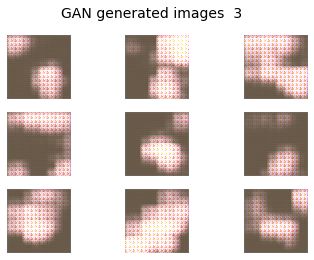

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/156 [00:00<00:23,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 2/156 [00:00<00:23,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 3/156 [00:00<00:23,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 4/156 [00:00<00:23,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:23,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:00<00:23,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 7/156 [00:01<00:23,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 8/156 [00:01<00:22,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 9/156 [00:01<00:22,  6.55it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 10/156 [00:01<00:22,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 11/156 [00:01<00:22,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 12/156 [00:01<00:22,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 13/156 [00:02<00:22,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 14/156 [00:02<00:22,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 15/156 [00:02<00:21,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 16/156 [00:02<00:21,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 17/156 [00:02<00:21,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 18/156 [00:02<00:21,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 19/156 [00:02<00:21,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 20/156 [00:03<00:20,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 21/156 [00:03<00:20,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 22/156 [00:03<00:20,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 23/156 [00:03<00:20,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 24/156 [00:03<00:20,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 25/156 [00:03<00:20,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 26/156 [00:04<00:19,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 27/156 [00:04<00:19,  6.55it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 28/156 [00:04<00:19,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 29/156 [00:04<00:19,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 30/156 [00:04<00:18,  6.65it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 31/156 [00:04<00:18,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 32/156 [00:04<00:19,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 33/156 [00:05<00:19,  6.47it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 34/156 [00:05<00:18,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 35/156 [00:05<00:18,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 36/156 [00:05<00:18,  6.56it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 37/156 [00:05<00:18,  6.61it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 38/156 [00:05<00:18,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 39/156 [00:05<00:17,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 40/156 [00:06<00:18,  6.35it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 41/156 [00:06<00:17,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 42/156 [00:06<00:17,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 43/156 [00:06<00:17,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 44/156 [00:06<00:17,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 45/156 [00:06<00:17,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 46/156 [00:07<00:17,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 47/156 [00:07<00:16,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 48/156 [00:07<00:16,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 49/156 [00:07<00:16,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 50/156 [00:07<00:16,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 51/156 [00:07<00:16,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 52/156 [00:08<00:15,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 53/156 [00:08<00:15,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 54/156 [00:08<00:15,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:08<00:15,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 56/156 [00:08<00:15,  6.58it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 57/156 [00:08<00:14,  6.63it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 58/156 [00:08<00:14,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 59/156 [00:09<00:14,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 60/156 [00:09<00:14,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 61/156 [00:09<00:14,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 62/156 [00:09<00:14,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 63/156 [00:09<00:14,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 64/156 [00:09<00:14,  6.54it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 65/156 [00:10<00:14,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 66/156 [00:10<00:13,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 67/156 [00:10<00:13,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 68/156 [00:10<00:13,  6.59it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 69/156 [00:10<00:13,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 70/156 [00:10<00:13,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 71/156 [00:10<00:13,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 72/156 [00:11<00:13,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 73/156 [00:11<00:13,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 74/156 [00:11<00:13,  6.30it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 75/156 [00:11<00:12,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 76/156 [00:11<00:12,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 77/156 [00:11<00:12,  6.55it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 78/156 [00:12<00:12,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 79/156 [00:12<00:12,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 80/156 [00:12<00:12,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 81/156 [00:12<00:11,  6.35it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 82/156 [00:12<00:11,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 83/156 [00:12<00:11,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 84/156 [00:12<00:11,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 85/156 [00:13<00:10,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 86/156 [00:13<00:10,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 87/156 [00:13<00:10,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 88/156 [00:13<00:10,  6.47it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 89/156 [00:13<00:10,  6.54it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 90/156 [00:13<00:10,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 91/156 [00:14<00:10,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 92/156 [00:14<00:09,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 93/156 [00:14<00:09,  6.45it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 94/156 [00:14<00:09,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 95/156 [00:14<00:09,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 96/156 [00:14<00:09,  6.42it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 97/156 [00:14<00:09,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 98/156 [00:15<00:09,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 99/156 [00:15<00:08,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 100/156 [00:15<00:08,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 101/156 [00:15<00:08,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 102/156 [00:15<00:08,  6.55it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 103/156 [00:15<00:08,  6.51it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 104/156 [00:16<00:07,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 105/156 [00:16<00:07,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 106/156 [00:16<00:07,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 107/156 [00:16<00:07,  6.67it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 108/156 [00:16<00:07,  6.58it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 109/156 [00:16<00:07,  6.45it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 110/156 [00:16<00:07,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 111/156 [00:17<00:06,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 112/156 [00:17<00:06,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 113/156 [00:17<00:06,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 114/156 [00:17<00:06,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 115/156 [00:17<00:06,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 116/156 [00:17<00:06,  6.55it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 117/156 [00:18<00:05,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 118/156 [00:18<00:05,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 119/156 [00:18<00:05,  6.39it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 120/156 [00:18<00:05,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 121/156 [00:18<00:05,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 122/156 [00:18<00:05,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 123/156 [00:18<00:05,  6.55it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 124/156 [00:19<00:04,  6.57it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 125/156 [00:19<00:04,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 126/156 [00:19<00:04,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 127/156 [00:19<00:04,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 128/156 [00:19<00:04,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 129/156 [00:19<00:04,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 130/156 [00:20<00:04,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 131/156 [00:20<00:03,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 132/156 [00:20<00:03,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 133/156 [00:20<00:03,  6.40it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 134/156 [00:20<00:03,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 135/156 [00:20<00:03,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 136/156 [00:20<00:03,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 137/156 [00:21<00:02,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 138/156 [00:21<00:02,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 139/156 [00:21<00:02,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 140/156 [00:21<00:02,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 141/156 [00:21<00:02,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 142/156 [00:21<00:02,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 143/156 [00:22<00:01,  6.57it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 144/156 [00:22<00:01,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 145/156 [00:22<00:01,  6.59it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 146/156 [00:22<00:01,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 147/156 [00:22<00:01,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 148/156 [00:22<00:01,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 149/156 [00:22<00:01,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 150/156 [00:23<00:00,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 151/156 [00:23<00:00,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 152/156 [00:23<00:00,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 153/156 [00:23<00:00,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 154/156 [00:23<00:00,  6.56it/s]

1/1 [==============================] - 0s 13ms/step


 99%|█████████▉| 155/156 [00:23<00:00,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 156/156 [00:24<00:00,  6.48it/s]


1/1 [==============================] - 0s 26ms/step


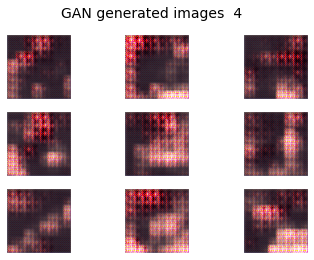

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 1/156 [00:00<00:24,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 2/156 [00:00<00:24,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 3/156 [00:00<00:23,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 4/156 [00:00<00:23,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 5/156 [00:00<00:23,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 6/156 [00:00<00:23,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 7/156 [00:01<00:23,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 8/156 [00:01<00:23,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 9/156 [00:01<00:23,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 10/156 [00:01<00:23,  6.25it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 11/156 [00:01<00:22,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 12/156 [00:01<00:22,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 13/156 [00:02<00:22,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 14/156 [00:02<00:22,  6.39it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 15/156 [00:02<00:21,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 16/156 [00:02<00:21,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 17/156 [00:02<00:21,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 18/156 [00:02<00:21,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 19/156 [00:02<00:21,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 20/156 [00:03<00:21,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 21/156 [00:03<00:21,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 22/156 [00:03<00:21,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 23/156 [00:03<00:21,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 24/156 [00:03<00:20,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 25/156 [00:03<00:20,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 26/156 [00:04<00:20,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 27/156 [00:04<00:20,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 28/156 [00:04<00:19,  6.45it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 29/156 [00:04<00:19,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 30/156 [00:04<00:19,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 31/156 [00:04<00:19,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 32/156 [00:05<00:19,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 33/156 [00:05<00:19,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:05<00:19,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.28it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 36/156 [00:05<00:18,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 37/156 [00:05<00:18,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 38/156 [00:05<00:18,  6.45it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 39/156 [00:06<00:18,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 40/156 [00:06<00:17,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 41/156 [00:06<00:17,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 42/156 [00:06<00:17,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 43/156 [00:06<00:17,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 44/156 [00:06<00:18,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 45/156 [00:07<00:17,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 46/156 [00:07<00:17,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:07<00:17,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 48/156 [00:07<00:16,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 49/156 [00:07<00:16,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 50/156 [00:07<00:16,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 51/156 [00:07<00:16,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 52/156 [00:08<00:16,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 53/156 [00:08<00:15,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 55/156 [00:08<00:15,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 56/156 [00:08<00:15,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 57/156 [00:08<00:15,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 58/156 [00:09<00:15,  6.32it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 59/156 [00:09<00:15,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 60/156 [00:09<00:15,  6.36it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 61/156 [00:09<00:14,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 62/156 [00:09<00:14,  6.39it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 63/156 [00:09<00:14,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 64/156 [00:10<00:14,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 65/156 [00:10<00:14,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 66/156 [00:10<00:14,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 67/156 [00:10<00:13,  6.45it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 68/156 [00:10<00:13,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 69/156 [00:10<00:13,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 70/156 [00:10<00:13,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 71/156 [00:11<00:12,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 72/156 [00:11<00:12,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 73/156 [00:11<00:12,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 74/156 [00:11<00:12,  6.37it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 75/156 [00:11<00:12,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 76/156 [00:11<00:12,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 77/156 [00:12<00:12,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 78/156 [00:12<00:12,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 79/156 [00:12<00:11,  6.47it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 80/156 [00:12<00:11,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 81/156 [00:12<00:11,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 82/156 [00:12<00:11,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 83/156 [00:12<00:11,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 85/156 [00:13<00:11,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 86/156 [00:13<00:11,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 87/156 [00:13<00:11,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 88/156 [00:13<00:10,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 89/156 [00:13<00:10,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 90/156 [00:14<00:10,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 91/156 [00:14<00:10,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 92/156 [00:14<00:10,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 93/156 [00:14<00:10,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 94/156 [00:14<00:09,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 95/156 [00:14<00:09,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 96/156 [00:15<00:09,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 97/156 [00:15<00:09,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 98/156 [00:15<00:09,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 99/156 [00:15<00:09,  6.30it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 100/156 [00:15<00:08,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 101/156 [00:15<00:08,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 102/156 [00:15<00:08,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 103/156 [00:16<00:08,  6.47it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 104/156 [00:16<00:08,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 105/156 [00:16<00:07,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 106/156 [00:16<00:07,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 107/156 [00:16<00:07,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 108/156 [00:16<00:07,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 109/156 [00:17<00:07,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 110/156 [00:17<00:07,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 111/156 [00:17<00:07,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 112/156 [00:17<00:06,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 113/156 [00:17<00:06,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 114/156 [00:17<00:06,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 115/156 [00:18<00:06,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 116/156 [00:18<00:06,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 117/156 [00:18<00:06,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:18<00:05,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 119/156 [00:18<00:05,  6.42it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 120/156 [00:18<00:05,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 121/156 [00:18<00:05,  6.45it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 122/156 [00:19<00:05,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 123/156 [00:19<00:05,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 124/156 [00:19<00:05,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 125/156 [00:19<00:04,  6.36it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 126/156 [00:19<00:04,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 127/156 [00:19<00:04,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 128/156 [00:20<00:04,  6.45it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:20<00:04,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 130/156 [00:20<00:04,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 131/156 [00:20<00:03,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:20<00:03,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 133/156 [00:20<00:03,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 134/156 [00:20<00:03,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 135/156 [00:21<00:03,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 136/156 [00:21<00:03,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 137/156 [00:21<00:02,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 138/156 [00:21<00:02,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 139/156 [00:21<00:02,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 140/156 [00:21<00:02,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 141/156 [00:22<00:02,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 142/156 [00:22<00:02,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 143/156 [00:22<00:02,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 144/156 [00:22<00:01,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 145/156 [00:22<00:01,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 146/156 [00:22<00:01,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 147/156 [00:23<00:01,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 148/156 [00:23<00:01,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 149/156 [00:23<00:01,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 150/156 [00:23<00:00,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 151/156 [00:23<00:00,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 152/156 [00:23<00:00,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 153/156 [00:23<00:00,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 154/156 [00:24<00:00,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 155/156 [00:24<00:00,  6.35it/s]

1/1 [==============================] - 0s 13ms/step


100%|██████████| 156/156 [00:24<00:00,  6.38it/s]


1/1 [==============================] - 0s 23ms/step


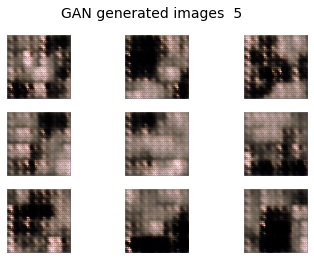

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/156 [00:00<00:25,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 2/156 [00:00<00:24,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 3/156 [00:00<00:24,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 4/156 [00:00<00:24,  6.31it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 5/156 [00:00<00:23,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 6/156 [00:00<00:24,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 7/156 [00:01<00:23,  6.35it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 8/156 [00:01<00:23,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 9/156 [00:01<00:23,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 10/156 [00:01<00:23,  6.28it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 11/156 [00:01<00:23,  6.24it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 12/156 [00:01<00:22,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 13/156 [00:02<00:22,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:22,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 15/156 [00:02<00:21,  6.43it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 16/156 [00:02<00:21,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 17/156 [00:02<00:21,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 18/156 [00:02<00:21,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 19/156 [00:03<00:21,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 20/156 [00:03<00:21,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 21/156 [00:03<00:21,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 22/156 [00:03<00:21,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 23/156 [00:03<00:20,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 24/156 [00:03<00:20,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 25/156 [00:03<00:21,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 26/156 [00:04<00:20,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 27/156 [00:04<00:20,  6.29it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 28/156 [00:04<00:20,  6.34it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▊        | 29/156 [00:04<00:19,  6.39it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 30/156 [00:04<00:19,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 31/156 [00:04<00:19,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 32/156 [00:05<00:20,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 33/156 [00:05<00:20,  5.99it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 34/156 [00:05<00:20,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 36/156 [00:05<00:19,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 37/156 [00:05<00:19,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 38/156 [00:06<00:18,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 39/156 [00:06<00:18,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 40/156 [00:06<00:18,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 42/156 [00:06<00:18,  6.25it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██▊       | 43/156 [00:06<00:17,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 44/156 [00:07<00:18,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 45/156 [00:07<00:17,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 46/156 [00:07<00:17,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 47/156 [00:07<00:17,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 48/156 [00:07<00:17,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 49/156 [00:07<00:16,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 50/156 [00:07<00:16,  6.39it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 51/156 [00:08<00:16,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 52/156 [00:08<00:16,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 53/156 [00:08<00:16,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 55/156 [00:08<00:22,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 56/156 [00:09<00:20,  4.82it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 57/156 [00:09<00:19,  5.20it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 58/156 [00:09<00:17,  5.52it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 59/156 [00:09<00:17,  5.70it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 60/156 [00:09<00:16,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 61/156 [00:09<00:15,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 62/156 [00:10<00:15,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 63/156 [00:10<00:15,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 64/156 [00:10<00:14,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:10<00:14,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 66/156 [00:10<00:14,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 67/156 [00:10<00:14,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 68/156 [00:11<00:14,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 69/156 [00:11<00:14,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 70/156 [00:11<00:13,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 71/156 [00:11<00:13,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 72/156 [00:11<00:13,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 73/156 [00:11<00:13,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 74/156 [00:11<00:12,  6.36it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 75/156 [00:12<00:12,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 76/156 [00:12<00:13,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 77/156 [00:12<00:12,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 78/156 [00:12<00:12,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 79/156 [00:12<00:12,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 80/156 [00:12<00:12,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 82/156 [00:13<00:11,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:13<00:11,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 85/156 [00:13<00:11,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 86/156 [00:13<00:11,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 87/156 [00:14<00:10,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 88/156 [00:14<00:10,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 89/156 [00:14<00:10,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 90/156 [00:14<00:10,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 91/156 [00:14<00:10,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 92/156 [00:14<00:10,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 93/156 [00:15<00:09,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 94/156 [00:15<00:09,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 95/156 [00:15<00:10,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 96/156 [00:15<00:09,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 97/156 [00:15<00:09,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 98/156 [00:15<00:09,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 99/156 [00:15<00:08,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 100/156 [00:16<00:08,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:16<00:08,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 102/156 [00:16<00:08,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 103/156 [00:16<00:08,  6.30it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 104/156 [00:16<00:08,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 105/156 [00:16<00:08,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 106/156 [00:17<00:07,  6.38it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 107/156 [00:17<00:07,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 108/156 [00:17<00:07,  6.36it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 109/156 [00:17<00:07,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 110/156 [00:17<00:07,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 111/156 [00:17<00:07,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 112/156 [00:18<00:06,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 113/156 [00:18<00:06,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 114/156 [00:18<00:06,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 115/156 [00:18<00:06,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 116/156 [00:18<00:06,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 117/156 [00:18<00:06,  5.91it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 118/156 [00:19<00:06,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 119/156 [00:19<00:06,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 120/156 [00:19<00:05,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 121/156 [00:19<00:05,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 122/156 [00:19<00:05,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 123/156 [00:19<00:05,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 124/156 [00:20<00:05,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 125/156 [00:20<00:05,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 126/156 [00:20<00:04,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:20<00:04,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 128/156 [00:20<00:04,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:20<00:04,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 130/156 [00:20<00:04,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 131/156 [00:21<00:04,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 132/156 [00:21<00:03,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 133/156 [00:21<00:03,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 134/156 [00:21<00:03,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 135/156 [00:21<00:03,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 136/156 [00:21<00:03,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 137/156 [00:22<00:03,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 138/156 [00:22<00:02,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 139/156 [00:22<00:02,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 140/156 [00:22<00:02,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 141/156 [00:22<00:02,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 142/156 [00:22<00:02,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 143/156 [00:23<00:02,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 144/156 [00:23<00:01,  6.40it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 145/156 [00:23<00:01,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 146/156 [00:23<00:01,  6.34it/s]

1/1 [==============================] - 0s 13ms/step


 94%|█████████▍| 147/156 [00:23<00:01,  6.29it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 148/156 [00:23<00:01,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 149/156 [00:23<00:01,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 150/156 [00:24<00:00,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 151/156 [00:24<00:00,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 152/156 [00:24<00:00,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 153/156 [00:24<00:00,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 154/156 [00:24<00:00,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 155/156 [00:24<00:00,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


100%|██████████| 156/156 [00:25<00:00,  6.22it/s]


1/1 [==============================] - 0s 26ms/step


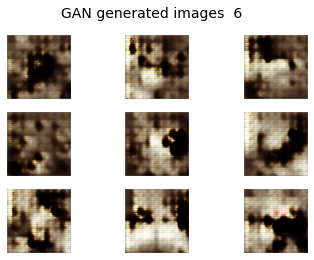

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1/156 [00:00<00:24,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 2/156 [00:00<00:24,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 3/156 [00:00<00:24,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 4/156 [00:00<00:24,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/156 [00:00<00:24,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 7/156 [00:01<00:24,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 8/156 [00:01<00:23,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:23,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 10/156 [00:01<00:23,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 11/156 [00:01<00:23,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 12/156 [00:01<00:23,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 13/156 [00:02<00:23,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 14/156 [00:02<00:22,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 15/156 [00:02<00:22,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 16/156 [00:02<00:22,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 17/156 [00:02<00:22,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 18/156 [00:02<00:22,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 19/156 [00:03<00:22,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 20/156 [00:03<00:21,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 21/156 [00:03<00:21,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 22/156 [00:03<00:21,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 23/156 [00:03<00:21,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 24/156 [00:03<00:20,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 25/156 [00:04<00:20,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 26/156 [00:04<00:20,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 27/156 [00:04<00:20,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 28/156 [00:04<00:20,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 30/156 [00:04<00:20,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 31/156 [00:04<00:19,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 32/156 [00:05<00:19,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 33/156 [00:05<00:19,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 34/156 [00:05<00:19,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.35it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 36/156 [00:05<00:19,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 37/156 [00:05<00:19,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 38/156 [00:06<00:19,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 40/156 [00:06<00:19,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 41/156 [00:06<00:19,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 42/156 [00:06<00:18,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 43/156 [00:06<00:18,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 44/156 [00:07<00:18,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 45/156 [00:07<00:17,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 46/156 [00:07<00:17,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 47/156 [00:07<00:17,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 48/156 [00:07<00:17,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 49/156 [00:07<00:17,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 50/156 [00:08<00:17,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 52/156 [00:08<00:17,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 53/156 [00:08<00:16,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:08<00:16,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 56/156 [00:09<00:16,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 57/156 [00:09<00:16,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 58/156 [00:09<00:16,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 59/156 [00:09<00:15,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 60/156 [00:09<00:15,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 61/156 [00:09<00:15,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 62/156 [00:10<00:15,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 63/156 [00:10<00:15,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 64/156 [00:10<00:15,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 65/156 [00:10<00:15,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 66/156 [00:10<00:14,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 67/156 [00:10<00:14,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 68/156 [00:10<00:14,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 69/156 [00:11<00:14,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 70/156 [00:11<00:14,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 71/156 [00:11<00:13,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 72/156 [00:11<00:13,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 73/156 [00:11<00:13,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 74/156 [00:11<00:13,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 75/156 [00:12<00:13,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:12<00:13,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 77/156 [00:12<00:12,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 78/156 [00:12<00:12,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 79/156 [00:12<00:12,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 80/156 [00:12<00:12,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 82/156 [00:13<00:12,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:13<00:12,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 85/156 [00:13<00:11,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 86/156 [00:13<00:11,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 88/156 [00:14<00:11,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 89/156 [00:14<00:10,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 90/156 [00:14<00:10,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 91/156 [00:14<00:10,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 92/156 [00:14<00:10,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 93/156 [00:15<00:10,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 94/156 [00:15<00:10,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 95/156 [00:15<00:10,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 96/156 [00:15<00:10,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 97/156 [00:15<00:09,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 98/156 [00:15<00:09,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 100/156 [00:16<00:09,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 101/156 [00:16<00:09,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 102/156 [00:16<00:08,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:16<00:08,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 104/156 [00:16<00:08,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 106/156 [00:17<00:08,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 107/156 [00:17<00:08,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 108/156 [00:17<00:08,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 109/156 [00:17<00:07,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 110/156 [00:17<00:07,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 111/156 [00:18<00:07,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 112/156 [00:18<00:07,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 113/156 [00:18<00:06,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 114/156 [00:18<00:06,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 115/156 [00:18<00:06,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 116/156 [00:18<00:06,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 117/156 [00:19<00:06,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 118/156 [00:19<00:06,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 119/156 [00:19<00:06,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 120/156 [00:19<00:05,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 121/156 [00:19<00:05,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 122/156 [00:19<00:05,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 123/156 [00:20<00:05,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 124/156 [00:20<00:05,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 125/156 [00:20<00:04,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 126/156 [00:20<00:04,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:20<00:04,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 128/156 [00:20<00:04,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 129/156 [00:21<00:04,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 130/156 [00:21<00:04,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 131/156 [00:21<00:04,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 132/156 [00:21<00:03,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 133/156 [00:21<00:03,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 134/156 [00:21<00:03,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 135/156 [00:21<00:03,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 136/156 [00:22<00:03,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 137/156 [00:22<00:03,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 138/156 [00:22<00:02,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 139/156 [00:22<00:02,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 140/156 [00:22<00:02,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 141/156 [00:22<00:02,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 142/156 [00:23<00:02,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 143/156 [00:23<00:02,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 144/156 [00:23<00:01,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 145/156 [00:23<00:01,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 146/156 [00:23<00:01,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 147/156 [00:23<00:01,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 148/156 [00:24<00:01,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 149/156 [00:24<00:01,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 150/156 [00:24<00:00,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 151/156 [00:24<00:00,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 152/156 [00:24<00:00,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 153/156 [00:24<00:00,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 154/156 [00:25<00:00,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 155/156 [00:25<00:00,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 156/156 [00:25<00:00,  6.13it/s]


1/1 [==============================] - 0s 21ms/step


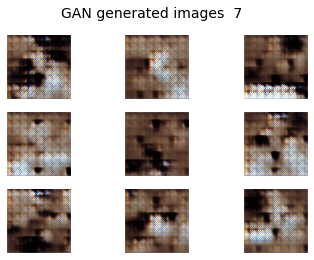

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 1/156 [00:00<00:26,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 2/156 [00:00<00:25,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/156 [00:00<00:25,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 4/156 [00:00<00:24,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 5/156 [00:00<00:23,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 6/156 [00:00<00:24,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 7/156 [00:01<00:24,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 8/156 [00:01<00:23,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 9/156 [00:01<00:23,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 10/156 [00:01<00:23,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 11/156 [00:01<00:23,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:01<00:23,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 13/156 [00:02<00:22,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 14/156 [00:02<00:22,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 15/156 [00:02<00:23,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 16/156 [00:02<00:23,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 17/156 [00:02<00:23,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 18/156 [00:02<00:22,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 19/156 [00:03<00:22,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 20/156 [00:03<00:22,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 21/156 [00:03<00:22,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 22/156 [00:03<00:22,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 23/156 [00:03<00:21,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 24/156 [00:03<00:21,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 25/156 [00:04<00:21,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 26/156 [00:04<00:20,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.83it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 28/156 [00:04<00:21,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 30/156 [00:04<00:20,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 31/156 [00:05<00:20,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 32/156 [00:05<00:20,  6.14it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 33/156 [00:05<00:20,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 34/156 [00:05<00:19,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 36/156 [00:05<00:19,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 37/156 [00:06<00:19,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 38/156 [00:06<00:19,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 40/156 [00:06<00:19,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 41/156 [00:06<00:19,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:06<00:19,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 43/156 [00:07<00:18,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 44/156 [00:07<00:18,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 45/156 [00:07<00:17,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 46/156 [00:07<00:17,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 47/156 [00:07<00:17,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 48/156 [00:07<00:17,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 49/156 [00:08<00:16,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 50/156 [00:08<00:16,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 52/156 [00:08<00:17,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 53/156 [00:08<00:16,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:09<00:16,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 56/156 [00:09<00:16,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 57/156 [00:09<00:16,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 58/156 [00:09<00:16,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 59/156 [00:09<00:15,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 60/156 [00:09<00:15,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 61/156 [00:09<00:15,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 62/156 [00:10<00:15,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 63/156 [00:10<00:15,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 64/156 [00:10<00:15,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:10<00:15,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 66/156 [00:10<00:15,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 67/156 [00:10<00:14,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 68/156 [00:11<00:14,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 69/156 [00:11<00:14,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 70/156 [00:11<00:13,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 71/156 [00:11<00:13,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 72/156 [00:11<00:13,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 73/156 [00:11<00:13,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 74/156 [00:12<00:13,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 75/156 [00:12<00:13,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 76/156 [00:12<00:13,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 77/156 [00:12<00:12,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 78/156 [00:12<00:12,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 79/156 [00:12<00:12,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 80/156 [00:13<00:12,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 82/156 [00:13<00:11,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 83/156 [00:13<00:11,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 85/156 [00:13<00:11,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 87/156 [00:14<00:13,  4.94it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 88/156 [00:14<00:13,  4.90it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 89/156 [00:14<00:13,  4.98it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 90/156 [00:14<00:13,  4.81it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 91/156 [00:15<00:14,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 92/156 [00:15<00:13,  4.59it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 93/156 [00:15<00:13,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 94/156 [00:15<00:13,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 95/156 [00:16<00:13,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 96/156 [00:16<00:12,  4.63it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 97/156 [00:16<00:12,  4.57it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 98/156 [00:16<00:13,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 99/156 [00:16<00:12,  4.60it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 100/156 [00:17<00:11,  4.73it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 101/156 [00:17<00:12,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 102/156 [00:17<00:11,  4.69it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 103/156 [00:17<00:10,  4.85it/s]

1/1 [==============================] - 0s 49ms/step


 67%|██████▋   | 104/156 [00:18<00:10,  4.80it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 105/156 [00:18<00:10,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 106/156 [00:18<00:10,  4.75it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 107/156 [00:18<00:10,  4.73it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 108/156 [00:18<00:10,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 109/156 [00:19<00:09,  4.72it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 110/156 [00:19<00:09,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 111/156 [00:19<00:09,  4.76it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 112/156 [00:19<00:09,  4.73it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 113/156 [00:19<00:09,  4.77it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 114/156 [00:20<00:08,  4.78it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 115/156 [00:20<00:08,  4.84it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 116/156 [00:20<00:08,  4.80it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▌  | 117/156 [00:20<00:08,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 118/156 [00:21<00:09,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 119/156 [00:21<00:08,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 120/156 [00:21<00:07,  4.51it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 121/156 [00:21<00:07,  4.75it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.08it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 123/156 [00:21<00:06,  5.40it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 127/156 [00:22<00:04,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 133/156 [00:23<00:03,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 139/156 [00:24<00:02,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 141/156 [00:24<00:02,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.80it/s]

1/1 [==============================] - 0s 13ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 144/156 [00:25<00:01,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 150/156 [00:26<00:00,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 152/156 [00:26<00:00,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 156/156 [00:27<00:00,  5.68it/s]


1/1 [==============================] - 0s 24ms/step


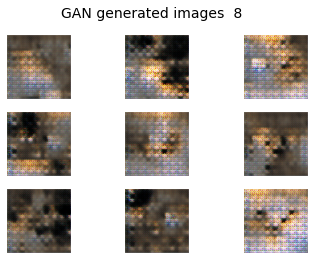

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 1/156 [00:00<00:26,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/156 [00:00<00:25,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.85it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 4/156 [00:00<00:25,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 6/156 [00:00<00:24,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 7/156 [00:01<00:24,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 8/156 [00:01<00:24,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 9/156 [00:01<00:24,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 13/156 [00:02<00:23,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 14/156 [00:02<00:23,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 15/156 [00:02<00:23,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 16/156 [00:02<00:23,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 17/156 [00:02<00:23,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 18/156 [00:03<00:22,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 19/156 [00:03<00:22,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 20/156 [00:03<00:22,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 21/156 [00:03<00:21,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 22/156 [00:03<00:22,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 23/156 [00:03<00:21,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 24/156 [00:03<00:21,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:21,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 26/156 [00:04<00:21,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 27/156 [00:04<00:21,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 28/156 [00:04<00:20,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:04<00:20,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 31/156 [00:05<00:20,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 32/156 [00:05<00:20,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 33/156 [00:05<00:20,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 34/156 [00:05<00:20,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 35/156 [00:05<00:20,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 36/156 [00:05<00:20,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 37/156 [00:06<00:19,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 38/156 [00:06<00:19,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 40/156 [00:06<00:19,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:06<00:18,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 43/156 [00:07<00:18,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 44/156 [00:07<00:18,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 45/156 [00:07<00:18,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 46/156 [00:07<00:18,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 47/156 [00:07<00:18,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 48/156 [00:07<00:18,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 49/156 [00:08<00:17,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 50/156 [00:08<00:17,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 52/156 [00:08<00:17,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 53/156 [00:08<00:17,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:08<00:17,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 57/156 [00:09<00:17,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:09<00:16,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 59/156 [00:09<00:16,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 60/156 [00:09<00:15,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:10<00:15,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 62/156 [00:10<00:15,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 63/156 [00:10<00:15,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 64/156 [00:10<00:15,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 65/156 [00:10<00:15,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 66/156 [00:10<00:15,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:11<00:14,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 68/156 [00:11<00:14,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:11<00:14,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 70/156 [00:11<00:14,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 71/156 [00:11<00:14,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 72/156 [00:11<00:14,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 73/156 [00:12<00:13,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 74/156 [00:12<00:13,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 75/156 [00:12<00:13,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 76/156 [00:12<00:13,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 77/156 [00:12<00:13,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 78/156 [00:12<00:13,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 79/156 [00:13<00:12,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 80/156 [00:13<00:12,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 82/156 [00:13<00:12,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 83/156 [00:13<00:11,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 85/156 [00:14<00:11,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 88/156 [00:14<00:11,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 89/156 [00:14<00:10,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 90/156 [00:14<00:11,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 91/156 [00:15<00:10,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 92/156 [00:15<00:10,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 93/156 [00:15<00:10,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 94/156 [00:15<00:10,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 95/156 [00:15<00:10,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 96/156 [00:15<00:09,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 97/156 [00:16<00:09,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 98/156 [00:16<00:09,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 100/156 [00:16<00:09,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 101/156 [00:16<00:09,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 102/156 [00:16<00:09,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 103/156 [00:17<00:08,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 104/156 [00:17<00:08,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 106/156 [00:17<00:08,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:17<00:08,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 108/156 [00:17<00:07,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 109/156 [00:18<00:07,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 110/156 [00:18<00:07,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 111/156 [00:18<00:07,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 112/156 [00:18<00:07,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 113/156 [00:18<00:07,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 114/156 [00:18<00:06,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 115/156 [00:19<00:06,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 116/156 [00:19<00:06,  6.08it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 117/156 [00:19<00:06,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 118/156 [00:19<00:06,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 119/156 [00:19<00:06,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 120/156 [00:19<00:06,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 121/156 [00:20<00:05,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 122/156 [00:20<00:05,  5.99it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 123/156 [00:20<00:05,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 124/156 [00:20<00:05,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 125/156 [00:20<00:05,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 126/156 [00:20<00:04,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 127/156 [00:21<00:04,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 128/156 [00:21<00:04,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 129/156 [00:21<00:04,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 130/156 [00:21<00:04,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 131/156 [00:21<00:04,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 132/156 [00:22<00:05,  4.30it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 133/156 [00:22<00:04,  4.68it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 134/156 [00:22<00:04,  5.01it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 135/156 [00:22<00:03,  5.25it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 136/156 [00:22<00:03,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 137/156 [00:23<00:03,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 138/156 [00:23<00:03,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 140/156 [00:23<00:02,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 141/156 [00:23<00:02,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 142/156 [00:23<00:02,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 143/156 [00:23<00:02,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 144/156 [00:24<00:02,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 147/156 [00:24<00:01,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 148/156 [00:24<00:01,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 149/156 [00:24<00:01,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 150/156 [00:25<00:00,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 151/156 [00:25<00:00,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 152/156 [00:25<00:00,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 153/156 [00:25<00:00,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 154/156 [00:25<00:00,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 155/156 [00:25<00:00,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 156/156 [00:26<00:00,  5.96it/s]


1/1 [==============================] - 0s 33ms/step


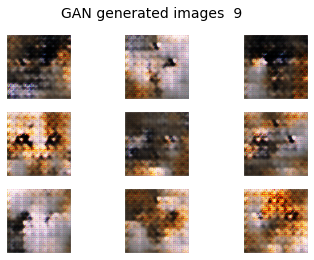

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/156 [00:00<00:23,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 2/156 [00:00<00:25,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 3/156 [00:00<00:24,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 4/156 [00:00<00:24,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 6/156 [00:00<00:25,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 7/156 [00:01<00:24,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 8/156 [00:01<00:24,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 16/156 [00:02<00:24,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 17/156 [00:02<00:23,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 18/156 [00:03<00:23,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 20/156 [00:03<00:22,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 21/156 [00:03<00:22,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 22/156 [00:03<00:22,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 23/156 [00:03<00:22,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 24/156 [00:04<00:22,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 25/156 [00:04<00:21,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:21,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 27/156 [00:04<00:21,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 28/156 [00:04<00:21,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 29/156 [00:04<00:21,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 30/156 [00:05<00:20,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 31/156 [00:05<00:20,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 32/156 [00:05<00:20,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 33/156 [00:05<00:20,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 34/156 [00:05<00:20,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 36/156 [00:06<00:19,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 37/156 [00:06<00:19,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:19,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 39/156 [00:06<00:19,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 40/156 [00:06<00:19,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 42/156 [00:07<00:18,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:18,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 44/156 [00:07<00:18,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 45/156 [00:07<00:18,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 46/156 [00:07<00:18,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 47/156 [00:07<00:17,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 48/156 [00:08<00:18,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 49/156 [00:08<00:17,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 51/156 [00:08<00:18,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 52/156 [00:08<00:18,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 53/156 [00:08<00:18,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 57/156 [00:09<00:16,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 58/156 [00:09<00:16,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 59/156 [00:09<00:16,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:16,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 61/156 [00:10<00:15,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 63/156 [00:10<00:15,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 64/156 [00:10<00:15,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 65/156 [00:10<00:15,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 68/156 [00:11<00:14,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 69/156 [00:11<00:14,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 70/156 [00:11<00:14,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 71/156 [00:11<00:14,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:12<00:13,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 73/156 [00:12<00:13,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 74/156 [00:12<00:13,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 75/156 [00:12<00:13,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 76/156 [00:12<00:13,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 77/156 [00:12<00:13,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.73it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 79/156 [00:13<00:14,  5.34it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 80/156 [00:13<00:14,  5.26it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 81/156 [00:13<00:13,  5.36it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 82/156 [00:13<00:13,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 85/156 [00:14<00:12,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 88/156 [00:14<00:11,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:15<00:10,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 92/156 [00:15<00:11,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 93/156 [00:15<00:10,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 94/156 [00:15<00:10,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:16<00:10,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 97/156 [00:16<00:09,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 98/156 [00:16<00:10,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 100/156 [00:16<00:09,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 102/156 [00:17<00:09,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 103/156 [00:17<00:08,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 104/156 [00:17<00:08,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 106/156 [00:17<00:08,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 108/156 [00:18<00:08,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 109/156 [00:18<00:07,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 110/156 [00:18<00:07,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 111/156 [00:18<00:07,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 112/156 [00:18<00:07,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 113/156 [00:19<00:07,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 114/156 [00:19<00:07,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:19<00:07,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 116/156 [00:19<00:06,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:19<00:06,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 118/156 [00:19<00:06,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 120/156 [00:20<00:06,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 121/156 [00:20<00:05,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 122/156 [00:20<00:05,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 123/156 [00:20<00:05,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 124/156 [00:20<00:05,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 125/156 [00:21<00:05,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 126/156 [00:21<00:04,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 127/156 [00:21<00:04,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 128/156 [00:21<00:04,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 129/156 [00:21<00:04,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 130/156 [00:21<00:04,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 131/156 [00:22<00:04,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 132/156 [00:22<00:04,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 133/156 [00:22<00:03,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 134/156 [00:22<00:03,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 135/156 [00:22<00:03,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 136/156 [00:22<00:03,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 137/156 [00:23<00:03,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 138/156 [00:23<00:02,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 140/156 [00:23<00:02,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 141/156 [00:23<00:02,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 142/156 [00:24<00:02,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 143/156 [00:24<00:02,  5.74it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 144/156 [00:24<00:02,  5.67it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 147/156 [00:24<00:01,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 149/156 [00:25<00:01,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 150/156 [00:25<00:01,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 151/156 [00:25<00:00,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 152/156 [00:25<00:00,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 153/156 [00:25<00:00,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 155/156 [00:26<00:00,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 156/156 [00:26<00:00,  5.90it/s]


1/1 [==============================] - 0s 28ms/step


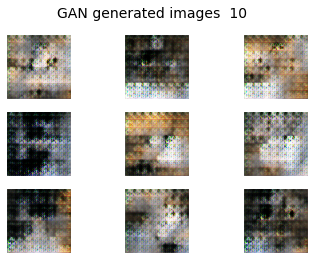

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/156 [00:00<00:24,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 2/156 [00:00<00:23,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 3/156 [00:00<00:23,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/156 [00:00<00:24,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/156 [00:00<00:25,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 7/156 [00:01<00:24,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 8/156 [00:01<00:24,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 9/156 [00:01<00:24,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:24,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 12/156 [00:01<00:24,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 14/156 [00:02<00:23,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:23,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 16/156 [00:02<00:23,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 17/156 [00:02<00:23,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 18/156 [00:03<00:23,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:03<00:22,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 22/156 [00:03<00:22,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 23/156 [00:03<00:22,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 24/156 [00:04<00:21,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 25/156 [00:04<00:21,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 26/156 [00:04<00:20,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 27/156 [00:04<00:20,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 28/156 [00:04<00:21,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 29/156 [00:04<00:21,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:04<00:20,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 31/156 [00:05<00:20,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 32/156 [00:05<00:20,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 33/156 [00:05<00:20,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:05<00:20,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 35/156 [00:05<00:20,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:05<00:20,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 39/156 [00:06<00:19,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 40/156 [00:06<00:19,  5.95it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 43/156 [00:07<00:18,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 44/156 [00:07<00:18,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 45/156 [00:07<00:18,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 46/156 [00:07<00:17,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 47/156 [00:07<00:17,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 48/156 [00:07<00:18,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 49/156 [00:08<00:17,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 50/156 [00:08<00:17,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 52/156 [00:08<00:17,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 53/156 [00:08<00:16,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 55/156 [00:09<00:16,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 56/156 [00:09<00:16,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 57/156 [00:09<00:16,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 58/156 [00:09<00:16,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 59/156 [00:09<00:16,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 60/156 [00:09<00:16,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 62/156 [00:10<00:15,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 63/156 [00:10<00:16,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 64/156 [00:10<00:15,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:10<00:15,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 68/156 [00:11<00:14,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 69/156 [00:11<00:14,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 70/156 [00:11<00:14,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:11<00:13,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 73/156 [00:12<00:13,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:12<00:13,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:12<00:13,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:12<00:13,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 77/156 [00:12<00:13,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 79/156 [00:13<00:12,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 80/156 [00:13<00:12,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 82/156 [00:13<00:12,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:13<00:11,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 85/156 [00:14<00:11,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 88/156 [00:14<00:11,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 89/156 [00:14<00:11,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 90/156 [00:14<00:10,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 91/156 [00:15<00:10,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 92/156 [00:15<00:10,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 93/156 [00:15<00:10,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 94/156 [00:15<00:10,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 95/156 [00:15<00:09,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 96/156 [00:15<00:09,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 97/156 [00:16<00:09,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 98/156 [00:16<00:09,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 100/156 [00:16<00:09,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 101/156 [00:16<00:08,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 102/156 [00:16<00:08,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 103/156 [00:17<00:08,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 104/156 [00:17<00:08,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:17<00:08,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 107/156 [00:17<00:08,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 108/156 [00:17<00:08,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 109/156 [00:18<00:07,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 110/156 [00:18<00:07,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 111/156 [00:18<00:07,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 112/156 [00:18<00:07,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 113/156 [00:18<00:07,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 114/156 [00:18<00:06,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 115/156 [00:19<00:06,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 116/156 [00:19<00:06,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 117/156 [00:19<00:06,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 118/156 [00:19<00:06,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 119/156 [00:19<00:06,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 120/156 [00:19<00:06,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 121/156 [00:20<00:06,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 122/156 [00:20<00:05,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 123/156 [00:20<00:05,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 124/156 [00:20<00:05,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 125/156 [00:20<00:05,  5.92it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 126/156 [00:20<00:05,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:21<00:04,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 128/156 [00:21<00:04,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 129/156 [00:21<00:04,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 130/156 [00:21<00:04,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 131/156 [00:21<00:04,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 132/156 [00:22<00:04,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 133/156 [00:22<00:03,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 134/156 [00:22<00:03,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 135/156 [00:22<00:03,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 136/156 [00:22<00:03,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 137/156 [00:22<00:03,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 138/156 [00:23<00:03,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 140/156 [00:23<00:02,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 141/156 [00:23<00:02,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 142/156 [00:23<00:02,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 143/156 [00:23<00:02,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:24<00:02,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 147/156 [00:24<00:01,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 148/156 [00:24<00:01,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 149/156 [00:24<00:01,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 150/156 [00:25<00:00,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 151/156 [00:25<00:00,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 152/156 [00:25<00:00,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 153/156 [00:25<00:00,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 154/156 [00:25<00:00,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 155/156 [00:25<00:00,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 156/156 [00:26<00:00,  5.99it/s]


1/1 [==============================] - 0s 28ms/step


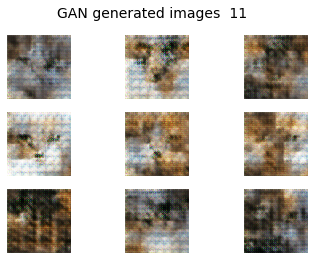

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:25,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 2/156 [00:00<00:24,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:23,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/156 [00:00<00:23,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/156 [00:00<00:24,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 7/156 [00:01<00:24,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:24,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 9/156 [00:01<00:23,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 10/156 [00:01<00:23,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:23,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 12/156 [00:01<00:23,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 13/156 [00:02<00:23,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:23,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 15/156 [00:02<00:23,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 16/156 [00:02<00:23,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 17/156 [00:02<00:23,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 18/156 [00:02<00:23,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:22,  5.95it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 23/156 [00:03<00:22,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:03<00:21,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:21,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 27/156 [00:04<00:21,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 28/156 [00:04<00:21,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 29/156 [00:04<00:21,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 30/156 [00:04<00:20,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 32/156 [00:05<00:20,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 33/156 [00:05<00:20,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:05<00:20,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 36/156 [00:05<00:19,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:19,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 39/156 [00:06<00:20,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 40/156 [00:06<00:20,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:06<00:19,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 42/156 [00:06<00:19,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:07<00:18,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 46/156 [00:07<00:18,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 47/156 [00:07<00:18,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 48/156 [00:07<00:18,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 49/156 [00:08<00:17,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 50/156 [00:08<00:17,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 52/156 [00:08<00:17,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 53/156 [00:08<00:16,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 55/156 [00:09<00:16,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 56/156 [00:09<00:16,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 57/156 [00:09<00:16,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 58/156 [00:09<00:16,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 59/156 [00:09<00:16,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 60/156 [00:09<00:16,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 62/156 [00:10<00:15,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 63/156 [00:10<00:15,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:10<00:15,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 65/156 [00:10<00:15,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 66/156 [00:10<00:15,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 67/156 [00:11<00:14,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 68/156 [00:11<00:14,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 69/156 [00:11<00:14,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 70/156 [00:11<00:13,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 71/156 [00:11<00:14,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 72/156 [00:11<00:14,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 73/156 [00:12<00:13,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 74/156 [00:12<00:13,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 75/156 [00:12<00:13,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 76/156 [00:12<00:13,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 77/156 [00:12<00:13,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 79/156 [00:13<00:12,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:13<00:13,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 82/156 [00:13<00:12,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:13<00:12,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 84/156 [00:14<00:11,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 85/156 [00:14<00:11,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 88/156 [00:14<00:11,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:14<00:11,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 90/156 [00:14<00:10,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 91/156 [00:15<00:10,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 92/156 [00:15<00:10,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 93/156 [00:15<00:10,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 94/156 [00:15<00:10,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 95/156 [00:15<00:09,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:15<00:09,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 97/156 [00:16<00:09,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 98/156 [00:16<00:09,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 100/156 [00:16<00:09,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 101/156 [00:16<00:09,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 102/156 [00:17<00:09,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 103/156 [00:17<00:09,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 104/156 [00:17<00:08,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 106/156 [00:17<00:08,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 107/156 [00:17<00:08,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 108/156 [00:18<00:08,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 109/156 [00:18<00:08,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 110/156 [00:18<00:07,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 111/156 [00:18<00:07,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 112/156 [00:18<00:07,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 113/156 [00:18<00:07,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 114/156 [00:19<00:06,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 115/156 [00:19<00:06,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 116/156 [00:19<00:06,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:19<00:06,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 118/156 [00:19<00:06,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 119/156 [00:19<00:06,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 120/156 [00:20<00:06,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 121/156 [00:20<00:05,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 122/156 [00:20<00:05,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 123/156 [00:20<00:05,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 124/156 [00:20<00:05,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:20<00:05,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 126/156 [00:21<00:04,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:21<00:04,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:21<00:04,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:21<00:04,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 130/156 [00:21<00:04,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 131/156 [00:21<00:04,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 132/156 [00:22<00:04,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 133/156 [00:22<00:03,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:22<00:03,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 135/156 [00:22<00:03,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:22<00:03,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 137/156 [00:22<00:03,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 138/156 [00:23<00:03,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 140/156 [00:23<00:02,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 141/156 [00:23<00:02,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:23<00:02,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 143/156 [00:23<00:02,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 144/156 [00:24<00:02,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:24<00:01,  5.90it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 148/156 [00:24<00:01,  5.70it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 149/156 [00:24<00:01,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 150/156 [00:25<00:01,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:25<00:00,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 152/156 [00:25<00:00,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 153/156 [00:25<00:00,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 154/156 [00:25<00:00,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 155/156 [00:25<00:00,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 156/156 [00:26<00:00,  5.96it/s]


1/1 [==============================] - 0s 22ms/step


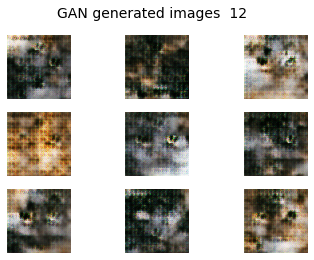

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/156 [00:00<00:25,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:25,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 3/156 [00:00<00:25,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:25,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 5/156 [00:00<00:25,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 7/156 [00:01<00:24,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 8/156 [00:01<00:24,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 9/156 [00:01<00:24,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 10/156 [00:01<00:24,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 15/156 [00:02<00:23,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 16/156 [00:02<00:23,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 17/156 [00:02<00:23,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 23/156 [00:03<00:22,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 24/156 [00:04<00:22,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 25/156 [00:04<00:21,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:21,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 27/156 [00:04<00:21,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 28/156 [00:04<00:21,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 29/156 [00:04<00:21,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 30/156 [00:05<00:21,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 32/156 [00:05<00:21,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 33/156 [00:05<00:20,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 34/156 [00:05<00:20,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:20,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 40/156 [00:06<00:20,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:06<00:20,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 44/156 [00:07<00:18,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 46/156 [00:07<00:18,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 47/156 [00:07<00:18,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 48/156 [00:08<00:18,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 50/156 [00:08<00:17,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 51/156 [00:08<00:17,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 52/156 [00:08<00:17,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 53/156 [00:08<00:17,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 54/156 [00:09<00:16,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 55/156 [00:09<00:16,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 56/156 [00:09<00:16,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 57/156 [00:09<00:16,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:09<00:16,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 59/156 [00:09<00:15,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 60/156 [00:10<00:15,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 63/156 [00:10<00:16,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 64/156 [00:10<00:15,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 68/156 [00:11<00:14,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 69/156 [00:11<00:15,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 70/156 [00:11<00:14,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 73/156 [00:12<00:14,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 74/156 [00:12<00:14,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 75/156 [00:12<00:14,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 76/156 [00:12<00:13,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 77/156 [00:13<00:13,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 78/156 [00:13<00:14,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 80/156 [00:13<00:13,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:13<00:13,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 82/156 [00:13<00:12,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:14<00:11,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:14<00:11,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 92/156 [00:15<00:10,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 93/156 [00:15<00:10,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 95/156 [00:16<00:10,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 96/156 [00:16<00:09,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 97/156 [00:16<00:09,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:16<00:09,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 100/156 [00:16<00:09,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 102/156 [00:17<00:09,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 103/156 [00:17<00:09,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 104/156 [00:17<00:08,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 108/156 [00:18<00:08,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 109/156 [00:18<00:07,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 110/156 [00:18<00:07,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:18<00:07,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 113/156 [00:19<00:07,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 114/156 [00:19<00:07,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 115/156 [00:19<00:06,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 116/156 [00:19<00:07,  5.70it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 117/156 [00:19<00:06,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:20<00:06,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:20<00:06,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 122/156 [00:20<00:05,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:20<00:05,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 125/156 [00:21<00:05,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:21<00:05,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 127/156 [00:21<00:04,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 128/156 [00:21<00:04,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 129/156 [00:21<00:04,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:22<00:04,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 132/156 [00:22<00:04,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:22<00:04,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:22<00:03,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 135/156 [00:22<00:03,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 137/156 [00:23<00:03,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 138/156 [00:23<00:02,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 140/156 [00:23<00:02,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 141/156 [00:23<00:02,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:24<00:02,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 143/156 [00:24<00:02,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 144/156 [00:24<00:01,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:24<00:01,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 149/156 [00:25<00:01,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 150/156 [00:25<00:01,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 151/156 [00:25<00:00,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 152/156 [00:25<00:00,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:25<00:00,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:26<00:00,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 156/156 [00:26<00:00,  5.89it/s]


1/1 [==============================] - 0s 22ms/step


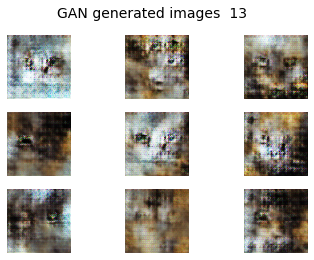

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/156 [00:00<00:24,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/156 [00:00<00:25,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 5/156 [00:00<00:25,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 8/156 [00:01<00:25,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 9/156 [00:01<00:24,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:24,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 16/156 [00:02<00:23,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 17/156 [00:02<00:23,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 18/156 [00:03<00:23,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 21/156 [00:03<00:22,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.77it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 23/156 [00:03<00:24,  5.40it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 29/156 [00:04<00:21,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 30/156 [00:05<00:21,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 32/156 [00:05<00:21,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 33/156 [00:05<00:21,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 34/156 [00:05<00:20,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 35/156 [00:06<00:20,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 37/156 [00:06<00:22,  5.23it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 39/156 [00:06<00:21,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 40/156 [00:06<00:21,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 46/156 [00:07<00:19,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 47/156 [00:08<00:19,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 48/156 [00:08<00:18,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 50/156 [00:08<00:17,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:08<00:17,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:17,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 53/156 [00:09<00:17,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 57/156 [00:09<00:17,  5.77it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 58/156 [00:10<00:16,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:16,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 60/156 [00:10<00:16,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 61/156 [00:10<00:17,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 62/156 [00:10<00:17,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:10<00:16,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:16,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 68/156 [00:11<00:14,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 69/156 [00:11<00:14,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 70/156 [00:12<00:14,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 73/156 [00:12<00:13,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 74/156 [00:12<00:13,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 75/156 [00:12<00:13,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 76/156 [00:13<00:13,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 77/156 [00:13<00:13,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 80/156 [00:13<00:13,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 81/156 [00:14<00:12,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:14<00:11,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:14<00:12,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:15<00:11,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 92/156 [00:15<00:10,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 97/156 [00:16<00:10,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 98/156 [00:16<00:10,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:17<00:09,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 103/156 [00:17<00:08,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 104/156 [00:17<00:08,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 108/156 [00:18<00:08,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 109/156 [00:18<00:08,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 110/156 [00:19<00:07,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 111/156 [00:19<00:07,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 113/156 [00:19<00:07,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 114/156 [00:19<00:07,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 115/156 [00:19<00:07,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 120/156 [00:20<00:06,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 121/156 [00:20<00:05,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:21<00:05,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 125/156 [00:21<00:05,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 126/156 [00:21<00:04,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 127/156 [00:21<00:04,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  5.95it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 131/156 [00:22<00:04,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 132/156 [00:22<00:04,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 133/156 [00:22<00:03,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  6.00it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 137/156 [00:23<00:03,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 138/156 [00:23<00:03,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 141/156 [00:24<00:02,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:24<00:02,  5.70it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 143/156 [00:24<00:02,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:24<00:02,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 149/156 [00:25<00:01,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 150/156 [00:25<00:01,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 152/156 [00:26<00:00,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:26<00:00,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


100%|██████████| 156/156 [00:26<00:00,  5.80it/s]

1/1 [==============================] - 0s 33ms/step


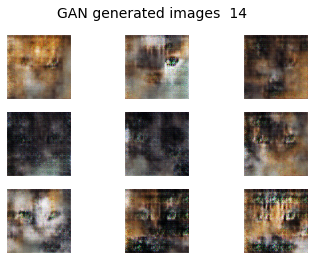

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 1/156 [00:00<00:24,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:25,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 5/156 [00:00<00:25,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:25,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:24,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 10/156 [00:01<00:24,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:23,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:23,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 16/156 [00:02<00:23,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:02<00:22,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 18/156 [00:03<00:23,  5.91it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 21/156 [00:03<00:22,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 22/156 [00:03<00:22,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 23/156 [00:03<00:22,  5.87it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 24/156 [00:04<00:21,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:04<00:22,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 32/156 [00:05<00:21,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 33/156 [00:05<00:22,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:05<00:21,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:05<00:21,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:20,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 40/156 [00:06<00:20,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:07<00:19,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 45/156 [00:07<00:18,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:07<00:18,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:18,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 48/156 [00:08<00:17,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:08<00:18,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 52/156 [00:08<00:17,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:09<00:17,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 55/156 [00:09<00:18,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:09<00:18,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 57/156 [00:09<00:17,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 58/156 [00:09<00:17,  5.60it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:10<00:15,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:10<00:15,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 67/156 [00:11<00:14,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 69/156 [00:11<00:15,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 70/156 [00:12<00:14,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 73/156 [00:12<00:13,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 74/156 [00:12<00:13,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:12<00:13,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 76/156 [00:13<00:13,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 77/156 [00:13<00:13,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 80/156 [00:13<00:13,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  5.74it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 84/156 [00:14<00:11,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 85/156 [00:14<00:11,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 92/156 [00:15<00:10,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 93/156 [00:15<00:10,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 97/156 [00:16<00:10,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 98/156 [00:16<00:10,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 102/156 [00:17<00:09,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 103/156 [00:17<00:09,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 104/156 [00:17<00:09,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.90it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 108/156 [00:18<00:08,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 109/156 [00:18<00:08,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 110/156 [00:18<00:08,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:19<00:07,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 113/156 [00:19<00:07,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 114/156 [00:19<00:07,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 115/156 [00:19<00:06,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 116/156 [00:19<00:06,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 120/156 [00:20<00:06,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 121/156 [00:20<00:05,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 122/156 [00:20<00:05,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 125/156 [00:21<00:05,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 126/156 [00:21<00:05,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 127/156 [00:21<00:04,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:21<00:04,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 131/156 [00:22<00:04,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 132/156 [00:22<00:04,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 133/156 [00:22<00:03,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 134/156 [00:22<00:03,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:23<00:03,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:23<00:03,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 140/156 [00:23<00:02,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 141/156 [00:24<00:02,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:24<00:02,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:24<00:02,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 144/156 [00:24<00:01,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 149/156 [00:25<00:01,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 150/156 [00:25<00:01,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 151/156 [00:25<00:00,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 152/156 [00:25<00:00,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:26<00:00,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 156/156 [00:26<00:00,  5.86it/s]


1/1 [==============================] - 0s 30ms/step


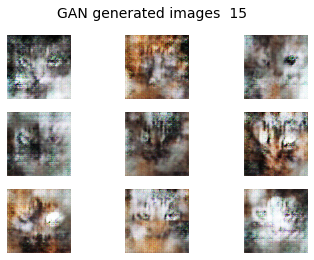

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/156 [00:00<00:26,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/156 [00:00<00:25,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 5/156 [00:00<00:25,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:24,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:24,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:23,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.87it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 15/156 [00:02<00:23,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:24,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 17/156 [00:02<00:24,  5.71it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 23/156 [00:03<00:23,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:21,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:04<00:21,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:05<00:21,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 32/156 [00:05<00:21,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:05<00:21,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 34/156 [00:05<00:21,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:19,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 40/156 [00:06<00:19,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:07<00:18,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 46/156 [00:07<00:18,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 47/156 [00:08<00:18,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 48/156 [00:08<00:18,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 51/156 [00:08<00:18,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 52/156 [00:08<00:18,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 57/156 [00:09<00:16,  5.83it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.52it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.53it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 63/156 [00:10<00:16,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:16,  5.70it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.70it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 69/156 [00:11<00:15,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:12<00:13,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 74/156 [00:12<00:14,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 75/156 [00:12<00:14,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 76/156 [00:13<00:13,  5.76it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 77/156 [00:13<00:13,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:13<00:13,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 85/156 [00:14<00:12,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:14<00:12,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.72it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 89/156 [00:15<00:12,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:15<00:12,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 92/156 [00:15<00:11,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.83it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 97/156 [00:16<00:10,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:16<00:10,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 100/156 [00:17<00:11,  4.73it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 101/156 [00:17<00:11,  4.74it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 102/156 [00:17<00:11,  4.84it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 103/156 [00:18<00:10,  4.86it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 104/156 [00:18<00:10,  4.87it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 105/156 [00:18<00:10,  4.93it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 106/156 [00:18<00:10,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 107/156 [00:18<00:10,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 108/156 [00:19<00:10,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 109/156 [00:19<00:09,  4.95it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 110/156 [00:19<00:09,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 111/156 [00:19<00:08,  5.05it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 112/156 [00:19<00:08,  4.98it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 113/156 [00:20<00:08,  4.91it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 114/156 [00:20<00:08,  4.89it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 115/156 [00:20<00:08,  4.98it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 116/156 [00:20<00:08,  4.97it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 117/156 [00:20<00:08,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 118/156 [00:21<00:08,  4.53it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▋  | 119/156 [00:21<00:07,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 120/156 [00:21<00:07,  4.67it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 121/156 [00:21<00:08,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 122/156 [00:22<00:07,  4.55it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 123/156 [00:22<00:07,  4.55it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:06,  4.70it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 125/156 [00:22<00:06,  4.81it/s]

1/1 [==============================] - 0s 54ms/step


 81%|████████  | 126/156 [00:22<00:06,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 127/156 [00:23<00:06,  4.83it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 129/156 [00:23<00:05,  4.83it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 130/156 [00:23<00:05,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 131/156 [00:23<00:05,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 132/156 [00:24<00:05,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  4.64it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 135/156 [00:24<00:04,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 136/156 [00:25<00:04,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 137/156 [00:25<00:04,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  4.56it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  4.73it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 140/156 [00:25<00:03,  4.79it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:26<00:03,  4.88it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.11it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:28<00:00,  5.43it/s]


1/1 [==============================] - 0s 24ms/step


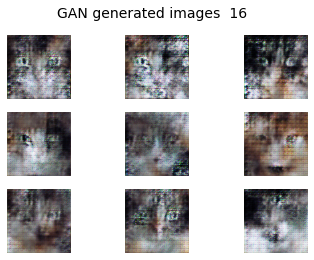

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/156 [00:00<00:25,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:25,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 5/156 [00:00<00:25,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 8/156 [00:01<00:25,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 16/156 [00:02<00:25,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:02<00:24,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 32/156 [00:05<00:21,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 33/156 [00:05<00:21,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 34/156 [00:05<00:21,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:19,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 39/156 [00:06<00:19,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:08<00:19,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 48/156 [00:08<00:18,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 50/156 [00:08<00:19,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:08<00:18,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.51it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.65it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 57/156 [00:09<00:17,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 61/156 [00:10<00:17,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 63/156 [00:11<00:16,  5.77it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 64/156 [00:11<00:16,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 69/156 [00:12<00:14,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 70/156 [00:12<00:14,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:12<00:14,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 74/156 [00:12<00:14,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 78/156 [00:13<00:14,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.46it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.47it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 83/156 [00:14<00:13,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 84/156 [00:14<00:13,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:14<00:12,  5.53it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.61it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 88/156 [00:15<00:12,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 89/156 [00:15<00:12,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.44it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.41it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 102/156 [00:17<00:09,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 108/156 [00:18<00:08,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 109/156 [00:19<00:07,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 110/156 [00:19<00:07,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 111/156 [00:19<00:07,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 113/156 [00:19<00:07,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:21<00:05,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:21<00:05,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 125/156 [00:21<00:05,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  5.71it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 131/156 [00:22<00:04,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 139/156 [00:24<00:03,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 141/156 [00:24<00:02,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:24<00:02,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 152/156 [00:26<00:00,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.86it/s]

1/1 [==============================] - 0s 32ms/step


100%|██████████| 156/156 [00:27<00:00,  5.71it/s]


1/1 [==============================] - 0s 26ms/step


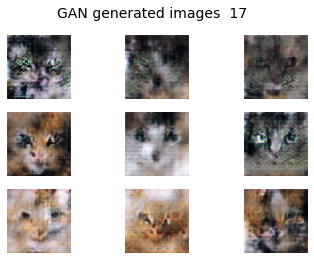

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1/156 [00:00<00:27,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.77it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.46it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 16/156 [00:02<00:24,  5.70it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 17/156 [00:02<00:23,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 18/156 [00:03<00:23,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.50it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:21,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:21,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:20,  5.97it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 32/156 [00:05<00:21,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:05<00:21,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:05<00:21,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:06<00:19,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:18,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:18,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 44/156 [00:07<00:18,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:07<00:18,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:08<00:18,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:18,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:08<00:18,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 55/156 [00:09<00:18,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:09<00:18,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:10<00:17,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 63/156 [00:11<00:16,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:11<00:16,  5.59it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:11<00:16,  5.42it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:12<00:14,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:12<00:14,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 77/156 [00:13<00:13,  5.68it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:14<00:12,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 87/156 [00:15<00:11,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 92/156 [00:16<00:10,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 97/156 [00:16<00:09,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:17<00:09,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 102/156 [00:17<00:09,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 103/156 [00:17<00:09,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 108/156 [00:18<00:08,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 109/156 [00:19<00:07,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:19<00:07,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:19<00:07,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 113/156 [00:19<00:07,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:19<00:07,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 115/156 [00:20<00:06,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 116/156 [00:20<00:06,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 120/156 [00:20<00:06,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:21<00:05,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 125/156 [00:21<00:05,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 126/156 [00:21<00:05,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  5.46it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 131/156 [00:22<00:04,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:23<00:03,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 139/156 [00:24<00:02,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:24<00:02,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 142/156 [00:24<00:02,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:24<00:02,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  5.68it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.67it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 152/156 [00:26<00:00,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:27<00:00,  5.72it/s]


1/1 [==============================] - 0s 21ms/step


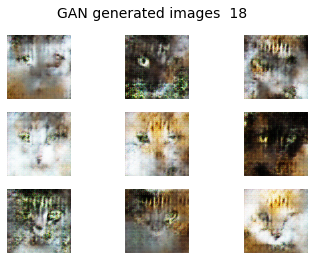

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 1/156 [00:00<00:25,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.60it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:24,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 9/156 [00:01<00:23,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 10/156 [00:01<00:23,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.73it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:25,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 17/156 [00:02<00:25,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 23/156 [00:04<00:22,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:22,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:21,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 27/156 [00:04<00:21,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 29/156 [00:05<00:21,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:21,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 33/156 [00:05<00:21,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 34/156 [00:05<00:22,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.48it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:21,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:07<00:19,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.81it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 48/156 [00:08<00:19,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:08<00:17,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:18,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:10<00:17,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.60it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 63/156 [00:11<00:16,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:15,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.70it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:14,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 70/156 [00:12<00:14,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:12<00:14,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 74/156 [00:12<00:13,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 77/156 [00:13<00:21,  3.60it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:18,  4.11it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:17,  4.44it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:15,  4.79it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 81/156 [00:14<00:14,  5.02it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 82/156 [00:14<00:14,  5.12it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 83/156 [00:14<00:14,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:13,  5.24it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.54it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 88/156 [00:15<00:12,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:16<00:11,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.81it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 97/156 [00:17<00:09,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.68it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:18<00:08,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 111/156 [00:19<00:08,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.51it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.51it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 117/156 [00:20<00:07,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.35it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.43it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:24<00:03,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.43it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:27<00:00,  5.58it/s]


1/1 [==============================] - 0s 27ms/step


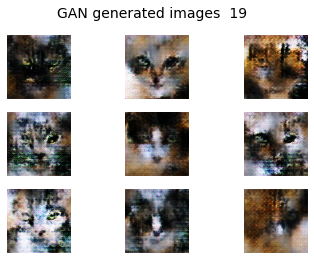

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:27,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:24,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 9/156 [00:01<00:24,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:23,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:23,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 17/156 [00:02<00:22,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 18/156 [00:03<00:22,  6.10it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 23/156 [00:03<00:23,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 29/156 [00:05<00:21,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:21,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 32/156 [00:05<00:20,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:05<00:21,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:05<00:20,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:20,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:20,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:06<00:19,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:07<00:20,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:07<00:19,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 47/156 [00:08<00:18,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 48/156 [00:08<00:18,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 49/156 [00:08<00:17,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 51/156 [00:08<00:18,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 55/156 [00:09<00:18,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 56/156 [00:09<00:18,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:09<00:17,  5.68it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:16,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:10<00:16,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:16,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:17,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 66/156 [00:11<00:17,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:12<00:15,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 73/156 [00:12<00:15,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 74/156 [00:12<00:15,  5.46it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.55it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.75it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 80/156 [00:13<00:13,  5.81it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:14<00:12,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 94/156 [00:16<00:11,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 97/156 [00:16<00:10,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:17<00:09,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:17<00:08,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 103/156 [00:17<00:09,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 108/156 [00:18<00:08,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 111/156 [00:19<00:08,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 113/156 [00:19<00:07,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:19<00:07,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:20<00:06,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 125/156 [00:21<00:05,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.08it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:22<00:05,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  5.48it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.67it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 139/156 [00:24<00:03,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 141/156 [00:24<00:02,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:24<00:02,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:26<00:00,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:27<00:00,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


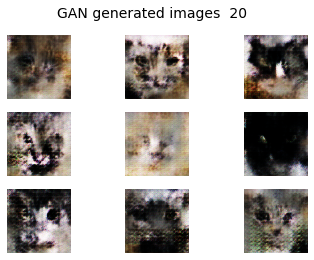

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/156 [00:00<00:28,  5.53it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.51it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:25,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.64it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.33it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 16/156 [00:02<00:25,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 17/156 [00:03<00:24,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.59it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 28/156 [00:05<00:22,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:21,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 33/156 [00:05<00:22,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:20,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:07<00:20,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:08<00:19,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:17,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 52/156 [00:09<00:17,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:17,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:09<00:16,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 55/156 [00:09<00:16,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 56/156 [00:09<00:16,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:16,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 60/156 [00:10<00:16,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 63/156 [00:11<00:15,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:11<00:16,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 66/156 [00:11<00:16,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 67/156 [00:11<00:16,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.36it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.32it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.43it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 71/156 [00:12<00:16,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 72/156 [00:12<00:15,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:13<00:13,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 83/156 [00:14<00:13,  5.55it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.54it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.71it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.57it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 105/156 [00:18<00:09,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 106/156 [00:18<00:09,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.51it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 111/156 [00:19<00:07,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:20<00:07,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 122/156 [00:21<00:05,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.51it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 130/156 [00:23<00:05,  4.94it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.05it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.34it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:23<00:04,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.45it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:24<00:02,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.57it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.51it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:27<00:00,  5.60it/s]


1/1 [==============================] - 0s 23ms/step


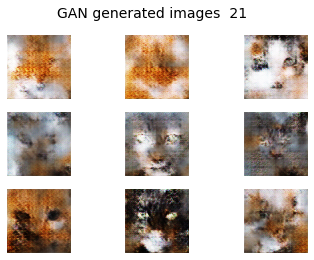

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:25,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.60it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 15/156 [00:02<00:26,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:25,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 17/156 [00:03<00:25,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:21,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:21,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:05<00:21,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:05<00:21,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:06<00:21,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.80it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:20,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 51/156 [00:09<00:18,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.67it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 55/156 [00:09<00:18,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:09<00:18,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:10<00:17,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 63/156 [00:11<00:16,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 64/156 [00:11<00:16,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.49it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 66/156 [00:11<00:16,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 70/156 [00:12<00:14,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 73/156 [00:12<00:14,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.51it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.55it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 78/156 [00:13<00:14,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.60it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 83/156 [00:14<00:13,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 84/156 [00:14<00:13,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:15<00:11,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 91/156 [00:16<00:10,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.54it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 105/156 [00:18<00:09,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 111/156 [00:19<00:07,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.67it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 116/156 [00:20<00:06,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.65it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  5.69it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.70it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:23<00:03,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 139/156 [00:24<00:03,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:24<00:02,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:26<00:00,  5.82it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  3.82it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  4.23it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  4.50it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 156/156 [00:27<00:00,  5.60it/s]


1/1 [==============================] - 0s 22ms/step


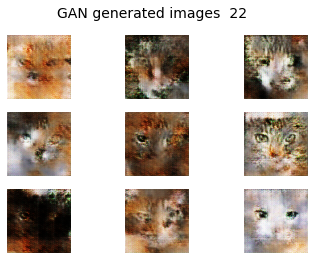

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:25,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:25,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:25,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 16/156 [00:02<00:24,  5.75it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 17/156 [00:02<00:24,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:22,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:05<00:21,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:21,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:20,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 44/156 [00:07<00:20,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:08<00:19,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 51/156 [00:09<00:18,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:09<00:18,  5.50it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:10<00:17,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 63/156 [00:11<00:16,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:16,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.85it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.71it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 78/156 [00:13<00:14,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.59it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.66it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:15<00:12,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 105/156 [00:18<00:09,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 110/156 [00:19<00:07,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 111/156 [00:19<00:07,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:19<00:08,  5.47it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 118/156 [00:21<00:07,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.38it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.26it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 123/156 [00:21<00:06,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:06,  5.24it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 127/156 [00:22<00:04,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:24<00:03,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.35it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.38it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.39it/s]

1/1 [==============================] - 0s 26ms/step


100%|██████████| 156/156 [00:27<00:00,  5.58it/s]


1/1 [==============================] - 0s 23ms/step


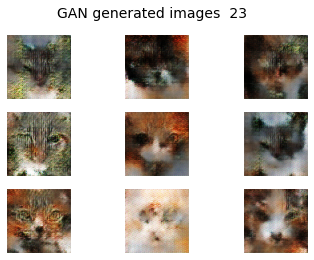

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:26,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.42it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:24,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 17/156 [00:03<00:27,  5.05it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:26,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:25,  5.37it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 22/156 [00:04<00:26,  4.97it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 23/156 [00:04<00:25,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:25,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:22,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 29/156 [00:05<00:21,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:21,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 32/156 [00:05<00:22,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 33/156 [00:06<00:22,  5.55it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:19,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:19,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:19,  5.87it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:07<00:20,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 48/156 [00:08<00:20,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.23it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 53/156 [00:09<00:19,  5.28it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.13it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 55/156 [00:10<00:19,  5.12it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 56/156 [00:10<00:20,  4.90it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 57/156 [00:10<00:20,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 58/156 [00:10<00:20,  4.90it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 59/156 [00:10<00:19,  4.96it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 60/156 [00:11<00:19,  4.86it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 61/156 [00:11<00:19,  4.92it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 62/156 [00:11<00:19,  4.84it/s]

1/1 [==============================] - 0s 45ms/step


 40%|████      | 63/156 [00:11<00:19,  4.79it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 64/156 [00:11<00:20,  4.53it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 65/156 [00:12<00:21,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 66/156 [00:12<00:20,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 67/156 [00:12<00:19,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 68/156 [00:12<00:19,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 69/156 [00:13<00:18,  4.68it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 70/156 [00:13<00:20,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 71/156 [00:13<00:20,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 72/156 [00:13<00:19,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 73/156 [00:14<00:18,  4.55it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 74/156 [00:14<00:18,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 75/156 [00:14<00:17,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 76/156 [00:14<00:17,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 77/156 [00:14<00:16,  4.76it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 78/156 [00:15<00:16,  4.86it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 79/156 [00:15<00:16,  4.75it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 80/156 [00:15<00:15,  4.85it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 81/156 [00:15<00:15,  4.74it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 82/156 [00:15<00:15,  4.78it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 83/156 [00:16<00:15,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 84/156 [00:16<00:14,  4.82it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 85/156 [00:16<00:15,  4.69it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:16<00:16,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 87/156 [00:17<00:17,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 88/156 [00:17<00:15,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 89/156 [00:17<00:17,  3.84it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 90/156 [00:17<00:17,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 91/156 [00:18<00:16,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 92/156 [00:18<00:16,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 93/156 [00:18<00:15,  4.06it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 94/156 [00:18<00:14,  4.17it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 95/156 [00:19<00:13,  4.45it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:19<00:12,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 97/156 [00:19<00:11,  5.02it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 98/156 [00:19<00:11,  5.17it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 99/156 [00:19<00:10,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 100/156 [00:19<00:10,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:20<00:10,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 102/156 [00:20<00:09,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:20<00:09,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:20<00:09,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 105/156 [00:20<00:09,  5.59it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 106/156 [00:21<00:09,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:21<00:09,  5.33it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 108/156 [00:21<00:09,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:21<00:08,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:21<00:08,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:21<00:08,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:22<00:07,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 113/156 [00:22<00:07,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:22<00:07,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:22<00:07,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 116/156 [00:22<00:06,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:22<00:06,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 118/156 [00:23<00:06,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 119/156 [00:23<00:06,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 120/156 [00:23<00:06,  5.28it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 121/156 [00:23<00:06,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:23<00:06,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 123/156 [00:24<00:06,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:24<00:06,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:24<00:05,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 126/156 [00:24<00:05,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 127/156 [00:24<00:05,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:24<00:04,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:25<00:04,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 130/156 [00:25<00:04,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 131/156 [00:25<00:04,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 132/156 [00:25<00:04,  5.36it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 133/156 [00:25<00:04,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:26<00:03,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 135/156 [00:26<00:03,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:26<00:03,  5.76it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 137/156 [00:26<00:03,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 138/156 [00:26<00:03,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 139/156 [00:26<00:03,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:27<00:02,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 141/156 [00:27<00:02,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:27<00:02,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 143/156 [00:27<00:02,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 144/156 [00:27<00:02,  5.56it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 145/156 [00:28<00:01,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:28<00:01,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 147/156 [00:28<00:01,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:28<00:01,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 149/156 [00:28<00:01,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:28<00:01,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 151/156 [00:29<00:00,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 152/156 [00:29<00:00,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:29<00:00,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:29<00:00,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 155/156 [00:29<00:00,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:29<00:00,  5.20it/s]


1/1 [==============================] - 0s 23ms/step


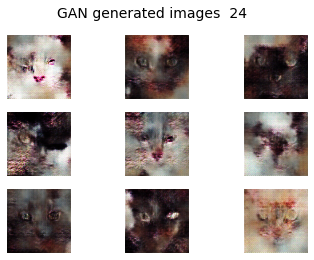

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:25,  6.12it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.59it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:24,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 17/156 [00:03<00:24,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.71it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:22,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:26,  4.97it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:25,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:25,  5.15it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:24,  5.28it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 31/156 [00:05<00:23,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 32/156 [00:05<00:23,  5.37it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 33/156 [00:06<00:23,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:19,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:08<00:18,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:18,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 49/156 [00:08<00:17,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:09<00:18,  5.85it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 51/156 [00:09<00:17,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:17,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 53/156 [00:09<00:17,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:17,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:16,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:16,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:16,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:15,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:11<00:16,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:15,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 70/156 [00:12<00:14,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.51it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 78/156 [00:13<00:14,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.60it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 86/156 [00:15<00:11,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:15<00:11,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.82it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.65it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 100/156 [00:17<00:10,  5.58it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 106/156 [00:18<00:09,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.46it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:19<00:09,  4.91it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.11it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:19<00:08,  5.07it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:20<00:07,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.64it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.42it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.57it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.51it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 139/156 [00:24<00:02,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.39it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.38it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.36it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.45it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.39it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.46it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:28<00:00,  5.57it/s]


1/1 [==============================] - 0s 22ms/step


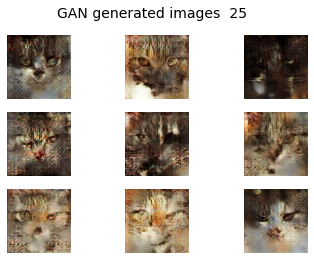

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/156 [00:00<00:28,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.43it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:00<00:28,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/156 [00:01<00:28,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:02<00:26,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:24,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:24,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:04<00:24,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.32it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:23,  5.33it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 33/156 [00:06<00:22,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.44it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.47it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 45/156 [00:08<00:19,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 47/156 [00:08<00:19,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:18,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.65it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 61/156 [00:11<00:16,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 63/156 [00:11<00:16,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 64/156 [00:11<00:16,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 66/156 [00:11<00:16,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 67/156 [00:12<00:15,  5.60it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.22it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 70/156 [00:12<00:16,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:13<00:15,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.47it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.56it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.57it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 86/156 [00:15<00:13,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.32it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 88/156 [00:15<00:12,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:12,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.55it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 94/156 [00:17<00:10,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 100/156 [00:18<00:09,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:18<00:09,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.47it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:07,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 117/156 [00:21<00:06,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:22<00:06,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.40it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:05,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.45it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.35it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.43it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 145/156 [00:26<00:01,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 156/156 [00:28<00:00,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


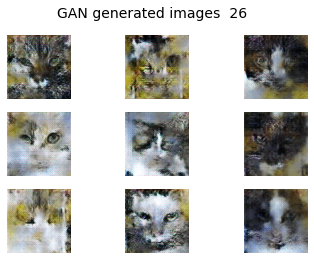

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:26,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.52it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.38it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:25,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 17/156 [00:03<00:24,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.45it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.51it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:22,  5.50it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 33/156 [00:05<00:22,  5.50it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.44it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:20,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 43/156 [00:07<00:21,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 44/156 [00:07<00:21,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.46it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 53/156 [00:09<00:19,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 55/156 [00:09<00:18,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.66it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 59/156 [00:10<00:16,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 61/156 [00:11<00:16,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:15,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 64/156 [00:11<00:15,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 67/156 [00:12<00:15,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:14,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 70/156 [00:12<00:14,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.69it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 76/156 [00:13<00:15,  5.14it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 83/156 [00:14<00:13,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.42it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.74it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 92/156 [00:16<00:10,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 100/156 [00:17<00:10,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:18<00:09,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.59it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.61it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.37it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.36it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 111/156 [00:19<00:08,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.45it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.49it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  4.98it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:21<00:07,  5.20it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.37it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.17it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.17it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:05,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.57it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.25it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.50it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.49it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.49it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.47it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.42it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 156/156 [00:28<00:00,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


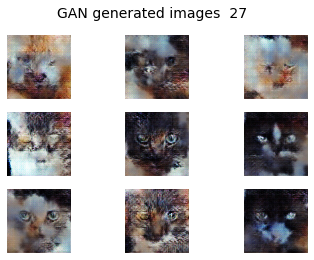

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:27,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.60it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 16/156 [00:02<00:25,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 17/156 [00:03<00:24,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 23/156 [00:04<00:25,  5.32it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.39it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:24,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.31it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.36it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.35it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 32/156 [00:05<00:22,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:06<00:23,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.28it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 36/156 [00:06<00:23,  5.08it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:22,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 38/156 [00:06<00:22,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.37it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:07<00:21,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:08<00:19,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 48/156 [00:08<00:18,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 50/156 [00:09<00:18,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 51/156 [00:09<00:18,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.59it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 56/156 [00:10<00:17,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:11<00:16,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:15,  5.89it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 64/156 [00:11<00:15,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 67/156 [00:12<00:15,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.67it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:12<00:15,  5.60it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.51it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.49it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:15<00:12,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.31it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.45it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:09,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.66it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 100/156 [00:18<00:09,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:21<00:06,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.26it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.29it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.49it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 140/156 [00:25<00:03,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.50it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.53it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.54it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.62it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.50it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


100%|██████████| 156/156 [00:28<00:00,  5.54it/s]


1/1 [==============================] - 0s 22ms/step


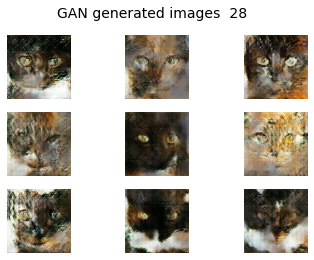

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1/156 [00:00<00:26,  5.91it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:28,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:25,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:24,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 10/156 [00:01<00:24,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.67it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:25,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 17/156 [00:03<00:24,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.55it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 21/156 [00:03<00:25,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 24/156 [00:04<00:22,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:21,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:23,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 33/156 [00:05<00:22,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 39/156 [00:06<00:20,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 44/156 [00:07<00:20,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:19,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 47/156 [00:08<00:19,  5.54it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 48/156 [00:08<00:20,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.60it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 55/156 [00:09<00:18,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:17,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 59/156 [00:10<00:16,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 63/156 [00:11<00:16,  5.76it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 64/156 [00:11<00:16,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.76it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.53it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 78/156 [00:13<00:14,  5.49it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 80/156 [00:14<00:14,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 83/156 [00:14<00:13,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 88/156 [00:15<00:12,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 100/156 [00:17<00:10,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.66it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 110/156 [00:19<00:07,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 111/156 [00:19<00:08,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.74it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  5.54it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:22<00:05,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:22<00:05,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:23<00:04,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.38it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 139/156 [00:24<00:03,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.51it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.39it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.42it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 145/156 [00:25<00:02,  5.21it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.12it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.39it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.16it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.10it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:28<00:00,  5.57it/s]


1/1 [==============================] - 0s 29ms/step


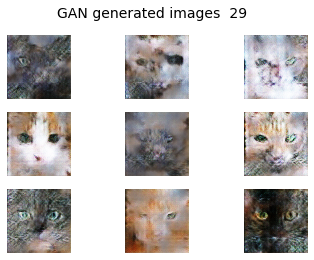

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/156 [00:00<00:40,  3.86it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 2/156 [00:00<00:32,  4.71it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:32,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 4/156 [00:00<00:30,  4.98it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:01<00:28,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:28,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:28,  5.28it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 8/156 [00:01<00:28,  5.17it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 9/156 [00:01<00:30,  4.85it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:02<00:29,  5.00it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:02<00:28,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 12/156 [00:02<00:27,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.35it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 15/156 [00:02<00:26,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 16/156 [00:03<00:26,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:26,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.33it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:04<00:24,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 22/156 [00:04<00:24,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.44it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 27/156 [00:05<00:23,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 28/156 [00:05<00:22,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.67it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 32/156 [00:05<00:21,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:06<00:22,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 38/156 [00:07<00:21,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.33it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.44it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.49it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:18,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:09<00:18,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 50/156 [00:09<00:18,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.51it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.47it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 61/156 [00:11<00:16,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 63/156 [00:11<00:16,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 64/156 [00:11<00:16,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.51it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 70/156 [00:12<00:16,  5.15it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 71/156 [00:13<00:15,  5.35it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.58it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 75/156 [00:13<00:15,  5.24it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.38it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.52it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.50it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.51it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.46it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.50it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:17<00:10,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.53it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:07,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.58it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.54it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 117/156 [00:21<00:06,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.36it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.52it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 128/156 [00:23<00:04,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.60it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:01,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.74it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.76it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 156/156 [00:28<00:00,  5.50it/s]


1/1 [==============================] - 0s 21ms/step


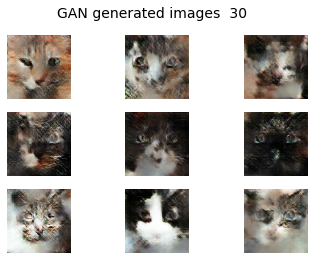

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/156 [00:00<00:25,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 2/156 [00:00<00:29,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:02<00:27,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.34it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.34it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:26,  5.28it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 17/156 [00:03<00:25,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.49it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.47it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 22/156 [00:04<00:25,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.46it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.49it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:05<00:21,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:21,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 33/156 [00:05<00:21,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:21,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 45/156 [00:08<00:19,  5.56it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 47/156 [00:08<00:19,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.55it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 51/156 [00:09<00:21,  4.80it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:20,  5.11it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:09<00:19,  5.20it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 55/156 [00:10<00:19,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:17,  5.42it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 64/156 [00:11<00:17,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.41it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.33it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 70/156 [00:12<00:16,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 71/156 [00:13<00:16,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.40it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.59it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.53it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.35it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:12,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.47it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 89/156 [00:16<00:13,  5.03it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 91/156 [00:16<00:12,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.45it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 97/156 [00:17<00:11,  5.03it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 98/156 [00:18<00:11,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.37it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.44it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 107/156 [00:19<00:09,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 108/156 [00:19<00:09,  5.22it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.71it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:21<00:07,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.38it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.32it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:04,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.35it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.30it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 142/156 [00:26<00:02,  4.84it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  4.78it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  4.54it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 146/156 [00:27<00:02,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  4.70it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  4.62it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 151/156 [00:28<00:01,  4.51it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  4.35it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  4.49it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  4.68it/s]

1/1 [==============================] - 0s 42ms/step


100%|██████████| 156/156 [00:29<00:00,  5.34it/s]

1/1 [==============================] - 0s 34ms/step


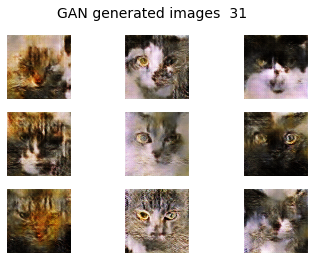

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/156 [00:00<00:32,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 2/156 [00:00<00:31,  4.82it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 3/156 [00:00<00:36,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 4/156 [00:00<00:40,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 5/156 [00:01<00:37,  4.01it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 6/156 [00:01<00:35,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 7/156 [00:01<00:35,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 8/156 [00:01<00:34,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 9/156 [00:02<00:33,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 10/156 [00:02<00:32,  4.47it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 11/156 [00:02<00:32,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 12/156 [00:02<00:31,  4.60it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 13/156 [00:03<00:34,  4.12it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 14/156 [00:03<00:32,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 15/156 [00:03<00:31,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 16/156 [00:03<00:30,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 17/156 [00:03<00:29,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 18/156 [00:04<00:28,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 19/156 [00:04<00:28,  4.87it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 20/156 [00:04<00:27,  4.90it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 21/156 [00:04<00:27,  4.86it/s]

1/1 [==============================] - 0s 42ms/step


 14%|█▍        | 22/156 [00:04<00:31,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 23/156 [00:05<00:29,  4.49it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 24/156 [00:05<00:28,  4.61it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 25/156 [00:05<00:27,  4.76it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:05<00:26,  4.93it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 27/156 [00:05<00:26,  4.95it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 28/156 [00:06<00:25,  5.04it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 29/156 [00:06<00:24,  5.24it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 30/156 [00:06<00:23,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 31/156 [00:06<00:23,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:06<00:23,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 33/156 [00:07<00:22,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 34/156 [00:07<00:22,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:07<00:22,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:07<00:21,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:07<00:21,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:07<00:21,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 39/156 [00:08<00:20,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 40/156 [00:08<00:20,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 41/156 [00:08<00:19,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:08<00:19,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 43/156 [00:08<00:19,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 45/156 [00:09<00:19,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 46/156 [00:09<00:19,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 47/156 [00:09<00:19,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 48/156 [00:09<00:19,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:09<00:19,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:10<00:19,  5.44it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 51/156 [00:10<00:19,  5.32it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 52/156 [00:10<00:18,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 53/156 [00:10<00:18,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 54/156 [00:10<00:18,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 55/156 [00:10<00:17,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 56/156 [00:11<00:18,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:11<00:18,  5.33it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 58/156 [00:11<00:17,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 59/156 [00:11<00:17,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:12<00:17,  5.37it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 62/156 [00:12<00:17,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:12<00:16,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:12<00:17,  5.35it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 65/156 [00:12<00:16,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:13<00:16,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 67/156 [00:13<00:16,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:13<00:16,  5.31it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 69/156 [00:13<00:15,  5.49it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 70/156 [00:13<00:15,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 71/156 [00:13<00:15,  5.33it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 72/156 [00:14<00:15,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 73/156 [00:14<00:15,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 74/156 [00:14<00:14,  5.60it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 75/156 [00:14<00:14,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:14<00:15,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:15<00:22,  3.55it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:15<00:19,  3.98it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:15<00:17,  4.33it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:15<00:16,  4.58it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 81/156 [00:16<00:15,  4.95it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 82/156 [00:16<00:14,  5.19it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 83/156 [00:16<00:13,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:16<00:13,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 85/156 [00:16<00:12,  5.49it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 86/156 [00:16<00:12,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:17<00:12,  5.51it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 88/156 [00:17<00:12,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 89/156 [00:17<00:12,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:17<00:12,  5.38it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 91/156 [00:17<00:11,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:18<00:11,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 93/156 [00:18<00:11,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:18<00:11,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 95/156 [00:18<00:11,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:18<00:11,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 97/156 [00:18<00:10,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 98/156 [00:19<00:10,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:19<00:10,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 100/156 [00:19<00:10,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:19<00:09,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:19<00:09,  5.48it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 103/156 [00:20<00:09,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:20<00:09,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 105/156 [00:20<00:09,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:20<00:09,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 107/156 [00:20<00:08,  5.60it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 108/156 [00:20<00:08,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:21<00:08,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:21<00:08,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:21<00:07,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:21<00:07,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 113/156 [00:21<00:07,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:22<00:07,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:22<00:07,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 116/156 [00:22<00:07,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:22<00:07,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 118/156 [00:22<00:07,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:23<00:06,  5.30it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 120/156 [00:23<00:06,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:23<00:06,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 122/156 [00:23<00:06,  5.51it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 123/156 [00:23<00:05,  5.65it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 124/156 [00:23<00:05,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 125/156 [00:24<00:05,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 126/156 [00:24<00:05,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 127/156 [00:24<00:05,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 128/156 [00:24<00:05,  5.36it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 129/156 [00:24<00:04,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.55it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 131/156 [00:25<00:04,  5.51it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 132/156 [00:25<00:04,  5.50it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 133/156 [00:25<00:04,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:25<00:03,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 135/156 [00:25<00:03,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:26<00:03,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 137/156 [00:26<00:03,  5.59it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 138/156 [00:26<00:03,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 139/156 [00:26<00:03,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 140/156 [00:26<00:02,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:26<00:02,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:27<00:02,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 143/156 [00:27<00:02,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:27<00:02,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 145/156 [00:27<00:01,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:27<00:01,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:28<00:01,  5.82it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 148/156 [00:28<00:01,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 149/156 [00:28<00:01,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 150/156 [00:28<00:01,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 151/156 [00:28<00:00,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:29<00:00,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:29<00:00,  5.77it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 155/156 [00:29<00:00,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:29<00:00,  5.26it/s]

1/1 [==============================] - 0s 24ms/step


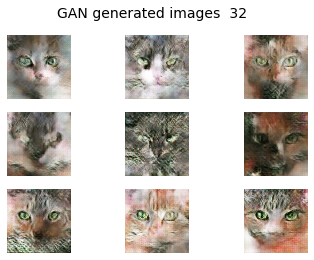

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/156 [00:00<00:28,  5.45it/s]

1/1 [==============================] - 0s 36ms/step


  1%|▏         | 2/156 [00:00<00:29,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.54it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.64it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.47it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.50it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.58it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 16/156 [00:02<00:25,  5.44it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 17/156 [00:03<00:25,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.57it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.56it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.42it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:22,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.51it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:22,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 33/156 [00:05<00:22,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:06<00:21,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 44/156 [00:07<00:20,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 47/156 [00:08<00:19,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 48/156 [00:08<00:19,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.42it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.51it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.76it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 56/156 [00:10<00:17,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:16,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 60/156 [00:10<00:16,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:16,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:16,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:11<00:17,  5.04it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:17,  5.15it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.25it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.58it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.50it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:15,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.34it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 80/156 [00:14<00:14,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.44it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 88/156 [00:15<00:12,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 91/156 [00:16<00:12,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.66it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 111/156 [00:20<00:07,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:21<00:06,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.29it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:02,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:01,  5.75it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.67it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.38it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 156/156 [00:28<00:00,  5.53it/s]


1/1 [==============================] - 0s 21ms/step


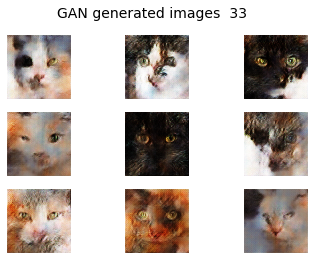

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:29,  5.25it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.59it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.52it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.32it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 16/156 [00:02<00:25,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:24,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.62it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.36it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 32/156 [00:05<00:22,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 33/156 [00:05<00:22,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 39/156 [00:07<00:20,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:07<00:20,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:19,  5.55it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:18,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:08<00:17,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 50/156 [00:09<00:18,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:09<00:18,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 55/156 [00:09<00:18,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.47it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 63/156 [00:11<00:17,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:11<00:17,  5.28it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 65/156 [00:11<00:17,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 66/156 [00:11<00:17,  5.28it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 67/156 [00:12<00:17,  5.17it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.50it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.58it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:15,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.44it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.64it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 83/156 [00:15<00:12,  5.63it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.54it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.56it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:10,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.48it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.40it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.46it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.60it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.45it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.54it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 118/156 [00:21<00:07,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.46it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.41it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:23<00:05,  5.34it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.25it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.40it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.33it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.17it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.07it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 156/156 [00:28<00:00,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


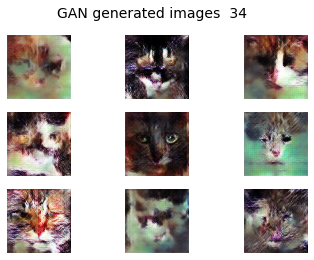

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1/156 [00:00<00:26,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.70it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:27,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 11/156 [00:02<00:27,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.52it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 16/156 [00:02<00:25,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 17/156 [00:03<00:25,  5.53it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.60it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.70it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 22/156 [00:04<00:25,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.40it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 28/156 [00:05<00:22,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:21,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:05<00:22,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:05<00:22,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:06<00:23,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.32it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.43it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 37/156 [00:06<00:23,  5.07it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 38/156 [00:06<00:22,  5.13it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:22,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:22,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:21,  5.39it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 45/156 [00:08<00:19,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 47/156 [00:08<00:19,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 48/156 [00:08<00:20,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:18,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.52it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.54it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 61/156 [00:11<00:16,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 63/156 [00:11<00:16,  5.50it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 64/156 [00:11<00:16,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.42it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 66/156 [00:12<00:17,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 67/156 [00:12<00:17,  5.14it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:17,  5.14it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.20it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 70/156 [00:12<00:16,  5.07it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:13<00:16,  5.19it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 72/156 [00:13<00:16,  5.20it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.61it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.58it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 78/156 [00:14<00:15,  5.14it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 79/156 [00:14<00:15,  5.12it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 80/156 [00:14<00:14,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.51it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.52it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.48it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.51it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.52it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:11,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.24it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.40it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.51it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:19<00:08,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.40it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.50it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 111/156 [00:20<00:07,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:06,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 117/156 [00:21<00:06,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.78it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.88it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 121/156 [00:22<00:05,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 122/156 [00:22<00:05,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.45it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.32it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.30it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.53it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 145/156 [00:26<00:01,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.58it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  3.69it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  4.48it/s]

1/1 [==============================] - 0s 24ms/step


100%|██████████| 156/156 [00:28<00:00,  5.42it/s]


1/1 [==============================] - 0s 23ms/step


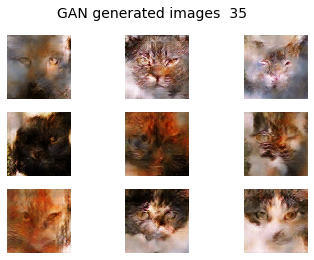

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 1/156 [00:00<00:28,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:29,  5.26it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 8/156 [00:01<00:28,  5.11it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 9/156 [00:01<00:28,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 10/156 [00:01<00:28,  5.12it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 11/156 [00:02<00:27,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:28,  5.12it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:27,  5.14it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 14/156 [00:02<00:27,  5.19it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:26,  5.37it/s]

1/1 [==============================] - 0s 37ms/step


 10%|█         | 16/156 [00:03<00:27,  5.15it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 17/156 [00:03<00:26,  5.20it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 18/156 [00:03<00:26,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:04<00:26,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:04<00:25,  5.22it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 23/156 [00:04<00:25,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.36it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 25/156 [00:04<00:25,  5.22it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:05<00:23,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:24,  5.28it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 31/156 [00:05<00:23,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:06<00:22,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:06<00:22,  5.41it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.45it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 37/156 [00:06<00:22,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 38/156 [00:07<00:21,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 41/156 [00:07<00:19,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:08<00:20,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:19,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.66it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 47/156 [00:08<00:20,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:09<00:19,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.67it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:10<00:18,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.28it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 57/156 [00:10<00:19,  5.02it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:19,  5.13it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 59/156 [00:11<00:18,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:11<00:18,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:17,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:17,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 65/156 [00:12<00:16,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:15,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.68it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 70/156 [00:13<00:15,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:13<00:15,  5.55it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:14<00:14,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 81/156 [00:15<00:13,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 83/156 [00:15<00:12,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:16<00:12,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 88/156 [00:16<00:11,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 89/156 [00:16<00:11,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.52it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:07,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:21<00:06,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:05,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.47it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.55it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.52it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.51it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.55it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 145/156 [00:26<00:01,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.55it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 156/156 [00:28<00:00,  5.47it/s]


1/1 [==============================] - 0s 27ms/step


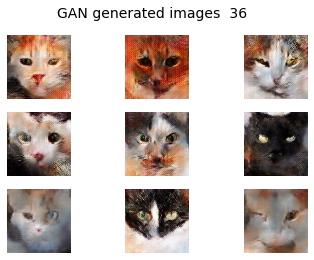

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 1/156 [00:00<00:29,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.62it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.44it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.46it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.82it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 16/156 [00:02<00:23,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:24,  5.71it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.57it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:25,  5.26it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 23/156 [00:04<00:25,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.67it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 28/156 [00:05<00:22,  5.67it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:05<00:22,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:05<00:22,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.35it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:22,  5.32it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:09<00:18,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:18,  5.81it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.34it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 55/156 [00:09<00:18,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:11<00:16,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 63/156 [00:11<00:16,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 64/156 [00:11<00:16,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 66/156 [00:11<00:16,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.48it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.49it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.19it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:13<00:15,  5.19it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.57it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.42it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.20it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 86/156 [00:15<00:13,  5.29it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 87/156 [00:15<00:13,  5.27it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.48it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:12,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.19it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.38it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:19<00:08,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.60it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.68it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 117/156 [00:21<00:06,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:04,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.50it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.43it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:02,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.55it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 156/156 [00:28<00:00,  5.52it/s]


1/1 [==============================] - 0s 33ms/step


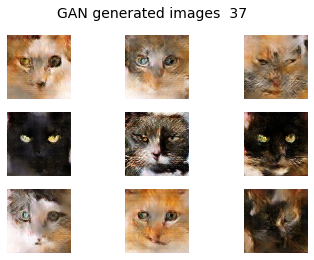

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/156 [00:00<00:24,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.42it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 5/156 [00:00<00:28,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 6/156 [00:01<00:28,  5.29it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 11/156 [00:02<00:26,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.51it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:26,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 17/156 [00:03<00:25,  5.52it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.47it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.54it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 22/156 [00:04<00:24,  5.39it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 23/156 [00:04<00:26,  5.05it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:25,  5.14it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:24,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:05<00:21,  5.71it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 33/156 [00:06<00:21,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:06<00:21,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.66it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.57it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.52it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.34it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 47/156 [00:08<00:20,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:20,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:09<00:20,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.35it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:19,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.58it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:11<00:16,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:15,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:15,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.58it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.54it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.40it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 72/156 [00:13<00:17,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 73/156 [00:13<00:17,  4.86it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 74/156 [00:13<00:16,  5.11it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:13<00:15,  5.25it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 76/156 [00:13<00:15,  5.24it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.43it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.60it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.55it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.40it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.53it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 86/156 [00:15<00:13,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 88/156 [00:16<00:11,  5.70it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.56it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.65it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.45it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.67it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.41it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 107/156 [00:19<00:09,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.38it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.55it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.14it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.25it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.38it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 118/156 [00:21<00:07,  5.32it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.49it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.70it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.44it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.42it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.42it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.31it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.39it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.31it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.53it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.36it/s]

1/1 [==============================] - 0s 32ms/step


100%|██████████| 156/156 [00:28<00:00,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


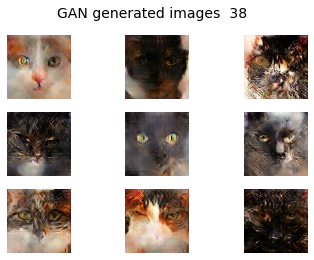

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:28,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:29,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.48it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.55it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.48it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 16/156 [00:02<00:25,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:25,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:25,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 23/156 [00:04<00:25,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 27/156 [00:04<00:24,  5.26it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.29it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:05<00:22,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 33/156 [00:06<00:22,  5.44it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.49it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:22,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.44it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 42/156 [00:07<00:21,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:22,  4.82it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:21,  5.05it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 48/156 [00:08<00:21,  5.01it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:09<00:20,  5.31it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 50/156 [00:09<00:20,  5.26it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 51/156 [00:09<00:20,  5.20it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:09<00:19,  5.22it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 55/156 [00:10<00:19,  5.20it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.41it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:17,  5.33it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 64/156 [00:11<00:17,  5.38it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 65/156 [00:12<00:17,  5.21it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 66/156 [00:12<00:18,  4.99it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 67/156 [00:12<00:18,  4.89it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 68/156 [00:12<00:18,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 69/156 [00:12<00:18,  4.74it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 70/156 [00:13<00:18,  4.65it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 71/156 [00:13<00:18,  4.66it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 72/156 [00:13<00:20,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 73/156 [00:13<00:18,  4.42it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 74/156 [00:14<00:18,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 75/156 [00:14<00:17,  4.54it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 76/156 [00:14<00:17,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 77/156 [00:14<00:18,  4.28it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 78/156 [00:14<00:18,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 79/156 [00:15<00:17,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 80/156 [00:15<00:16,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 81/156 [00:15<00:16,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 82/156 [00:15<00:15,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 83/156 [00:15<00:14,  5.07it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 84/156 [00:16<00:14,  5.08it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 85/156 [00:16<00:13,  5.25it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 86/156 [00:16<00:13,  5.19it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 87/156 [00:16<00:13,  5.12it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 88/156 [00:16<00:13,  5.04it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 89/156 [00:17<00:13,  4.91it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 90/156 [00:17<00:13,  5.02it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 91/156 [00:17<00:12,  5.01it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 92/156 [00:17<00:12,  4.93it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 93/156 [00:17<00:12,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 94/156 [00:18<00:12,  4.99it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████    | 95/156 [00:18<00:13,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 96/156 [00:18<00:13,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 97/156 [00:18<00:12,  4.76it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 98/156 [00:19<00:11,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 99/156 [00:19<00:11,  4.94it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 100/156 [00:19<00:11,  4.90it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 101/156 [00:19<00:11,  4.95it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 102/156 [00:19<00:11,  4.78it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▌   | 103/156 [00:20<00:11,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 104/156 [00:20<00:10,  4.83it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 105/156 [00:20<00:10,  4.87it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 106/156 [00:20<00:10,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 107/156 [00:20<00:10,  4.76it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 108/156 [00:21<00:09,  4.81it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:21<00:09,  4.95it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 110/156 [00:21<00:09,  4.91it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 111/156 [00:21<00:09,  4.93it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:21<00:08,  5.05it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:22<00:08,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:22<00:07,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 115/156 [00:22<00:07,  5.46it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 116/156 [00:22<00:07,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 117/156 [00:22<00:06,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:22<00:06,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:23<00:06,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:23<00:06,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 121/156 [00:23<00:06,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 122/156 [00:23<00:06,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:23<00:06,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:24<00:05,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 125/156 [00:24<00:05,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:24<00:05,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 127/156 [00:24<00:05,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:24<00:05,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:24<00:04,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 130/156 [00:25<00:04,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 131/156 [00:25<00:04,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 132/156 [00:25<00:04,  5.53it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 133/156 [00:25<00:04,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 134/156 [00:25<00:04,  5.33it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 135/156 [00:26<00:03,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 136/156 [00:26<00:03,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 137/156 [00:26<00:03,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 138/156 [00:26<00:03,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 139/156 [00:26<00:03,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 140/156 [00:26<00:02,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:27<00:02,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:27<00:02,  4.80it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 143/156 [00:27<00:02,  5.01it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 144/156 [00:27<00:02,  5.11it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 145/156 [00:27<00:02,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:28<00:01,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 147/156 [00:28<00:01,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 148/156 [00:28<00:01,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:28<00:01,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:28<00:01,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 151/156 [00:28<00:00,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:29<00:00,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:29<00:00,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:29<00:00,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 155/156 [00:29<00:00,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:29<00:00,  5.22it/s]


1/1 [==============================] - 0s 22ms/step


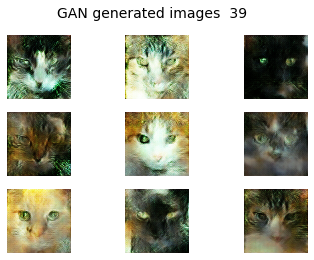

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:28,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.78it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 16/156 [00:02<00:25,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 17/156 [00:03<00:24,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.53it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.55it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.50it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.39it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.47it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 31/156 [00:05<00:23,  5.29it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 32/156 [00:05<00:24,  5.08it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 33/156 [00:06<00:24,  5.10it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 34/156 [00:06<00:23,  5.14it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 35/156 [00:06<00:23,  5.26it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 39/156 [00:07<00:20,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:07<00:20,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:08<00:19,  5.59it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 48/156 [00:08<00:19,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.44it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.35it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 53/156 [00:09<00:19,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 55/156 [00:10<00:19,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 56/156 [00:10<00:19,  5.21it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.28it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.33it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.23it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 63/156 [00:11<00:17,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 64/156 [00:11<00:17,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 67/156 [00:12<00:15,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.46it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.44it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.56it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 77/156 [00:14<00:13,  5.66it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.46it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.46it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.47it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 107/156 [00:19<00:09,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.27it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.39it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.46it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.69it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.55it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.53it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 128/156 [00:23<00:04,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.72it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.59it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:01,  5.57it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.56it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.54it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


100%|██████████| 156/156 [00:28<00:00,  5.50it/s]


1/1 [==============================] - 0s 21ms/step


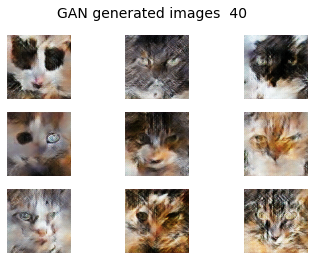

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:24,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.46it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.55it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:25,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 17/156 [00:03<00:25,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.37it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 27/156 [00:04<00:24,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:23,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 33/156 [00:06<00:23,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.35it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.49it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:20,  5.72it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:08<00:19,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:19,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 47/156 [00:08<00:19,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 48/156 [00:08<00:19,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.42it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.27it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 59/156 [00:10<00:18,  5.31it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 60/156 [00:10<00:18,  5.09it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 61/156 [00:11<00:18,  5.18it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 63/156 [00:11<00:17,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 64/156 [00:11<00:17,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:17,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 66/156 [00:12<00:17,  5.22it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 67/156 [00:12<00:17,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.19it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.16it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 70/156 [00:12<00:16,  5.19it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 71/156 [00:13<00:16,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:14<00:15,  5.25it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.31it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 80/156 [00:14<00:14,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 81/156 [00:14<00:14,  5.31it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.48it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 87/156 [00:16<00:13,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.33it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 97/156 [00:17<00:11,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.39it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:19<00:08,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 105/156 [00:19<00:08,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.39it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.41it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 113/156 [00:20<00:08,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 117/156 [00:21<00:06,  5.70it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.61it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 119/156 [00:21<00:07,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 120/156 [00:22<00:07,  5.12it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.18it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.05it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.26it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.45it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.18it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:05,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.56it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.40it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:01,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.33it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.16it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.27it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


100%|██████████| 156/156 [00:28<00:00,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


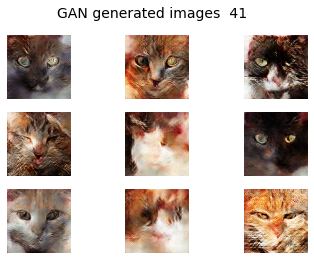

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/156 [00:00<00:25,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:29,  5.14it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/156 [00:00<00:29,  5.10it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.44it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.42it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.54it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 11/156 [00:02<00:26,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 16/156 [00:02<00:24,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:24,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.72it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.34it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 21/156 [00:03<00:25,  5.36it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 22/156 [00:04<00:26,  5.07it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.35it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.32it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.48it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:05<00:21,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 33/156 [00:06<00:22,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.66it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 38/156 [00:06<00:22,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.37it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:21,  5.35it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 43/156 [00:07<00:21,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:22,  4.85it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 48/156 [00:08<00:21,  5.07it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 49/156 [00:09<00:21,  5.07it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 50/156 [00:09<00:20,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.63it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.64it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 63/156 [00:11<00:16,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:11<00:16,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:13<00:15,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.45it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 77/156 [00:14<00:21,  3.67it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 78/156 [00:14<00:19,  3.98it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 79/156 [00:14<00:17,  4.28it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 80/156 [00:15<00:16,  4.53it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:15<00:15,  4.77it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 82/156 [00:15<00:14,  5.01it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:14,  5.07it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.18it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.36it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 86/156 [00:16<00:12,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 87/156 [00:16<00:12,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 91/156 [00:17<00:11,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:17<00:11,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:18<00:10,  5.62it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.56it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 102/156 [00:19<00:09,  5.43it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 103/156 [00:19<00:09,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.81it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 108/156 [00:20<00:08,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.42it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 113/156 [00:21<00:07,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:21<00:07,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.47it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:22<00:06,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.48it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.53it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 124/156 [00:23<00:05,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:05,  5.36it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.29it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.17it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.15it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 135/156 [00:25<00:04,  5.23it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.41it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 139/156 [00:25<00:02,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 141/156 [00:26<00:02,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.36it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 146/156 [00:27<00:01,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  5.61it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:28<00:00,  5.40it/s]


1/1 [==============================] - 0s 22ms/step


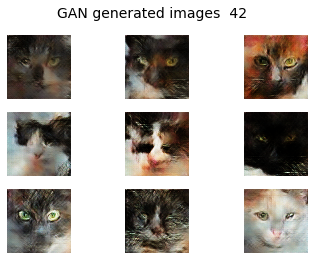

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/156 [00:00<00:28,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.62it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.66it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.64it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:25,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:25,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 20/156 [00:03<00:26,  5.14it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:25,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.45it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.59it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:05<00:21,  5.65it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 33/156 [00:05<00:22,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.45it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:20,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.43it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 44/156 [00:07<00:21,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 48/156 [00:08<00:19,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:19,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.25it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:09<00:19,  5.31it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 56/156 [00:10<00:19,  5.25it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 59/156 [00:10<00:18,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 60/156 [00:10<00:18,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 63/156 [00:11<00:16,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:16,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 66/156 [00:12<00:17,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.29it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.63it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.38it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.42it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:15<00:13,  5.28it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 87/156 [00:15<00:13,  5.23it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.32it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 92/156 [00:16<00:12,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:10,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.40it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:19<00:09,  5.39it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 108/156 [00:19<00:09,  5.18it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.32it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 113/156 [00:20<00:08,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 114/156 [00:20<00:08,  5.16it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:23<00:04,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:23<00:04,  5.73it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.40it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.08it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.10it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.14it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 139/156 [00:25<00:02,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.34it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.43it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 156/156 [00:28<00:00,  5.47it/s]


1/1 [==============================] - 0s 31ms/step


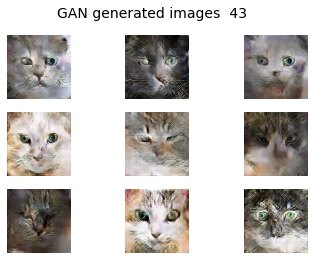

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/156 [00:00<00:28,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.77it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:25,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 17/156 [00:03<00:24,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.52it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.40it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 24/156 [00:04<00:25,  5.10it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.33it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.53it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.52it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.48it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 31/156 [00:05<00:24,  5.16it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 32/156 [00:05<00:24,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:06<00:23,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.41it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:21,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 47/156 [00:08<00:20,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:20,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 50/156 [00:09<00:20,  5.20it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.28it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.42it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 56/156 [00:10<00:17,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:18,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:11<00:16,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 63/156 [00:11<00:16,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 64/156 [00:11<00:16,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:12<00:15,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.55it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 77/156 [00:14<00:13,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:13,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.88it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.50it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 86/156 [00:15<00:13,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.37it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.55it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:11,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.36it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▌   | 102/156 [00:18<00:10,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.34it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.51it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 111/156 [00:20<00:07,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.60it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.46it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:21<00:06,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.44it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:04,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.55it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.32it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.27it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.55it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.43it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.51it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.43it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.36it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:28<00:00,  5.48it/s]


1/1 [==============================] - 0s 21ms/step


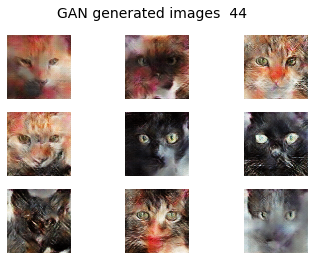

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 1/156 [00:00<00:29,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.44it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.53it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 10/156 [00:01<00:27,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:02<00:26,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.35it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.32it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 15/156 [00:02<00:26,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:26,  5.30it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 17/156 [00:03<00:26,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 22/156 [00:04<00:24,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.30it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 29/156 [00:05<00:24,  5.21it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 30/156 [00:05<00:24,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:24,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:05<00:23,  5.17it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 33/156 [00:06<00:23,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.43it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:07<00:21,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:21,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 45/156 [00:08<00:23,  4.81it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:22,  4.94it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 47/156 [00:08<00:21,  4.98it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 48/156 [00:08<00:21,  5.02it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:09<00:19,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.45it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 54/156 [00:10<00:18,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.52it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 61/156 [00:11<00:16,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:18,  5.01it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:18,  5.09it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 64/156 [00:11<00:18,  4.98it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:12<00:17,  5.18it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 66/156 [00:12<00:17,  5.23it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.24it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.31it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 70/156 [00:13<00:16,  5.28it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 71/156 [00:13<00:16,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 76/156 [00:14<00:14,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 81/156 [00:15<00:13,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 82/156 [00:15<00:12,  5.73it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 87/156 [00:16<00:13,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 88/156 [00:16<00:13,  5.19it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.20it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:13,  5.07it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 91/156 [00:16<00:12,  5.15it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 92/156 [00:17<00:12,  5.14it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 93/156 [00:17<00:12,  5.07it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:12,  5.07it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.22it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 97/156 [00:18<00:10,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:19<00:09,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 105/156 [00:19<00:08,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.48it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 108/156 [00:20<00:08,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 111/156 [00:20<00:07,  5.75it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:21<00:07,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:21<00:06,  5.70it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 119/156 [00:22<00:06,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 128/156 [00:23<00:04,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 131/156 [00:24<00:05,  4.96it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.22it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.29it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 141/156 [00:26<00:02,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.35it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.46it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.21it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 146/156 [00:27<00:01,  5.23it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  5.55it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  3.75it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  4.12it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


100%|██████████| 156/156 [00:29<00:00,  5.36it/s]


1/1 [==============================] - 0s 23ms/step


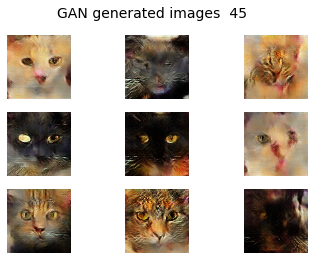

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:28,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.50it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.48it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.43it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:02<00:26,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.60it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:24,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 17/156 [00:03<00:24,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 28/156 [00:04<00:21,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:22,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 33/156 [00:05<00:21,  5.66it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 34/156 [00:06<00:21,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.53it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 39/156 [00:06<00:21,  5.54it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.61it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:07<00:20,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.48it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:08<00:19,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 48/156 [00:08<00:19,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:09<00:18,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.41it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 55/156 [00:09<00:18,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:17,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:11<00:18,  5.22it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 62/156 [00:11<00:18,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:17,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 64/156 [00:11<00:17,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:17,  5.26it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 66/156 [00:11<00:16,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 67/156 [00:12<00:15,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.62it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 88/156 [00:15<00:12,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 91/156 [00:16<00:12,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.70it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:18<00:09,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.36it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:19<00:08,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.44it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.22it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.13it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.03it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 118/156 [00:21<00:07,  5.13it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:21<00:07,  5.18it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.29it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.30it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  4.93it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 124/156 [00:22<00:06,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 125/156 [00:22<00:06,  4.87it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 126/156 [00:23<00:06,  4.90it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  4.86it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  4.84it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 129/156 [00:23<00:05,  4.94it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 130/156 [00:23<00:05,  4.87it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 131/156 [00:24<00:05,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  4.94it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 135/156 [00:24<00:04,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 136/156 [00:25<00:04,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  4.91it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  4.89it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 140/156 [00:25<00:03,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 141/156 [00:26<00:03,  4.88it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 142/156 [00:26<00:02,  4.80it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  4.80it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  4.91it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  4.88it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 146/156 [00:27<00:02,  4.92it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.06it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  4.94it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  4.95it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 151/156 [00:28<00:01,  4.90it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  4.83it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  4.83it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 155/156 [00:29<00:00,  4.78it/s]

1/1 [==============================] - 0s 30ms/step


100%|██████████| 156/156 [00:29<00:00,  5.33it/s]

1/1 [==============================] - 0s 30ms/step


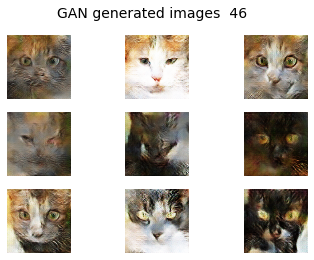

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 1/156 [00:00<00:29,  5.28it/s]

1/1 [==============================] - 0s 30ms/step


  1%|▏         | 2/156 [00:00<00:30,  5.04it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 3/156 [00:00<00:29,  5.26it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 4/156 [00:00<00:30,  5.04it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 5/156 [00:00<00:30,  4.95it/s]

1/1 [==============================] - 0s 43ms/step


  4%|▍         | 6/156 [00:01<00:31,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 7/156 [00:01<00:30,  4.91it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 8/156 [00:01<00:30,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 9/156 [00:01<00:30,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 10/156 [00:02<00:30,  4.78it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 11/156 [00:02<00:30,  4.73it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:29,  4.88it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:28,  4.96it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 14/156 [00:02<00:28,  4.99it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 15/156 [00:03<00:27,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:03<00:26,  5.20it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:26,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 18/156 [00:03<00:26,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.32it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:04<00:24,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 22/156 [00:04<00:25,  5.21it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 23/156 [00:04<00:25,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:25,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.35it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 26/156 [00:05<00:24,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 27/156 [00:05<00:23,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.60it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.53it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 32/156 [00:06<00:23,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 33/156 [00:06<00:23,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 37/156 [00:07<00:21,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:07<00:21,  5.52it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 42/156 [00:08<00:21,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 43/156 [00:08<00:21,  5.29it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 44/156 [00:08<00:21,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:21,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.38it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 47/156 [00:08<00:20,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 48/156 [00:09<00:20,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:09<00:20,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 50/156 [00:09<00:20,  5.20it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:10<00:18,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:10<00:18,  5.53it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 55/156 [00:10<00:17,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 59/156 [00:11<00:17,  5.43it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 63/156 [00:11<00:16,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 64/156 [00:12<00:16,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:12<00:16,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:12<00:15,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.55it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 70/156 [00:13<00:15,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:13<00:14,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 72/156 [00:13<00:14,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:14<00:14,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 76/156 [00:14<00:14,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:13,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.65it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:15<00:13,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.56it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 83/156 [00:15<00:12,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.59it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 87/156 [00:16<00:12,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.59it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.36it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:17<00:11,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.58it/s]

1/1 [==============================] - 0s 50ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.20it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 102/156 [00:18<00:10,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:19<00:09,  5.31it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 105/156 [00:19<00:10,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 106/156 [00:19<00:10,  4.88it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:19<00:09,  5.04it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 108/156 [00:20<00:09,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.37it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.41it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:21<00:07,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:21<00:07,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.57it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.57it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 119/156 [00:22<00:06,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:23<00:05,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.52it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.47it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.51it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 135/156 [00:25<00:03,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.47it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 141/156 [00:26<00:02,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 146/156 [00:27<00:01,  5.59it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.55it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.56it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:28<00:00,  5.42it/s]


1/1 [==============================] - 0s 21ms/step


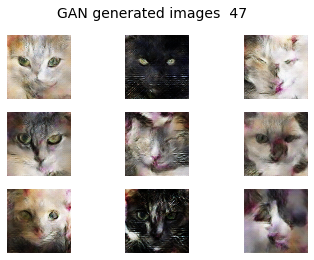

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 1/156 [00:00<00:25,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.72it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.41it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.50it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 10/156 [00:01<00:27,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:02<00:27,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:26,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 16/156 [00:02<00:26,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 17/156 [00:03<00:25,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.40it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 22/156 [00:04<00:26,  5.15it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 23/156 [00:04<00:25,  5.20it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.39it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:24,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.45it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 31/156 [00:05<00:23,  5.30it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 32/156 [00:05<00:24,  5.07it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 33/156 [00:06<00:24,  5.12it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:22,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 38/156 [00:07<00:21,  5.42it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.39it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:21,  5.37it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 44/156 [00:08<00:21,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.54it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.46it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 48/156 [00:08<00:19,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:09<00:19,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 56/156 [00:10<00:17,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.55it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:17,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:11<00:16,  5.48it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 65/156 [00:12<00:16,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 67/156 [00:12<00:15,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:13<00:14,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 72/156 [00:13<00:14,  5.70it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.41it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.19it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.44it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:10,  5.84it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.69it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:18<00:09,  5.72it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 100/156 [00:18<00:09,  5.66it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:19<00:08,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.60it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 108/156 [00:19<00:09,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.18it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.13it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:08,  5.15it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:20<00:08,  5.10it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.26it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.35it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.31it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.52it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.39it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 131/156 [00:24<00:05,  4.98it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.12it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.53it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.33it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.56it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.50it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 156/156 [00:28<00:00,  5.45it/s]


1/1 [==============================] - 0s 22ms/step


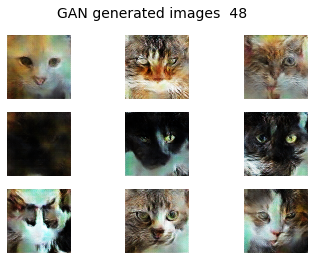

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/156 [00:00<00:27,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.47it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 6/156 [00:01<00:28,  5.32it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 7/156 [00:01<00:28,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:27,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:02<00:27,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.33it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:23,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:23,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 23/156 [00:04<00:22,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 24/156 [00:04<00:22,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.84it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 28/156 [00:05<00:22,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:23,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 33/156 [00:05<00:22,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.49it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.38it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.50it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 43/156 [00:07<00:21,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 44/156 [00:07<00:21,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.37it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 48/156 [00:08<00:19,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 51/156 [00:09<00:18,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 55/156 [00:09<00:18,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:17,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.76it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 60/156 [00:10<00:17,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 61/156 [00:10<00:17,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:17,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:17,  5.29it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 66/156 [00:11<00:16,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 70/156 [00:12<00:16,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:15,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.39it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.38it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 75/156 [00:13<00:15,  5.21it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 76/156 [00:13<00:15,  5.15it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 77/156 [00:14<00:15,  5.25it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 78/156 [00:14<00:15,  5.19it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:14,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.45it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.62it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:15<00:13,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.56it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 99/156 [00:18<00:09,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:09,  5.62it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:10,  5.07it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:10,  5.11it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.24it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.32it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.55it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.48it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.52it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.31it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:06,  5.14it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:23<00:06,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:02,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 145/156 [00:26<00:01,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.60it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.58it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.66it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:28<00:00,  5.48it/s]


1/1 [==============================] - 0s 23ms/step


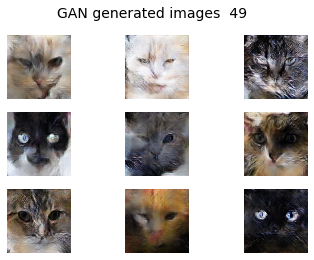

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 1/156 [00:00<00:31,  4.86it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:29,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.33it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.41it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 6/156 [00:01<00:28,  5.25it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.26it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 10/156 [00:01<00:27,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:02<00:25,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 16/156 [00:02<00:25,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:25,  5.35it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 18/156 [00:03<00:26,  5.25it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 19/156 [00:03<00:26,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:26,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:25,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:04<00:25,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 27/156 [00:05<00:23,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.26it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.53it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 32/156 [00:05<00:22,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:06<00:23,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.57it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 37/156 [00:06<00:22,  5.37it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 38/156 [00:07<00:22,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.66it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 42/156 [00:07<00:21,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.47it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 44/156 [00:08<00:22,  5.03it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 45/156 [00:08<00:21,  5.25it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 47/156 [00:08<00:19,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 48/156 [00:08<00:20,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 49/156 [00:09<00:19,  5.37it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:10<00:18,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:18,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:11<00:18,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 61/156 [00:11<00:18,  5.25it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.28it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 63/156 [00:11<00:17,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 64/156 [00:11<00:16,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:12<00:16,  5.39it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.26it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.35it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:13<00:16,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:13<00:15,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 76/156 [00:14<00:14,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.65it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 85/156 [00:15<00:12,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 87/156 [00:16<00:12,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:11,  5.66it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.52it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.60it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.34it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:10,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:19<00:09,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.39it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.51it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:07,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.60it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.37it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:06,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.24it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.02it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.24it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:05,  5.34it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 130/156 [00:24<00:05,  5.09it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.36it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.27it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.39it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 141/156 [00:26<00:02,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.28it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:27<00:01,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.27it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.42it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:28<00:00,  5.40it/s]


1/1 [==============================] - 0s 40ms/step


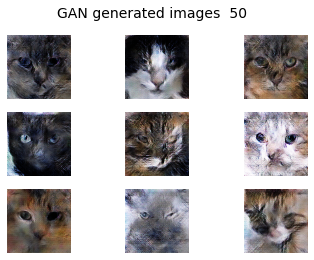

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/156 [00:00<00:27,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.47it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.40it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.40it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 5/156 [00:00<00:28,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/156 [00:01<00:28,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:27,  5.33it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 11/156 [00:02<00:28,  5.15it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.49it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 16/156 [00:02<00:25,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 17/156 [00:03<00:24,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 22/156 [00:04<00:25,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.32it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 24/156 [00:04<00:25,  5.16it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:25,  5.19it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:05<00:23,  5.47it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:05<00:22,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:06<00:22,  5.56it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 39/156 [00:07<00:20,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.43it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.60it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:18,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:19,  5.15it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 59/156 [00:10<00:18,  5.36it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 60/156 [00:11<00:18,  5.29it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:17,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 64/156 [00:11<00:17,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:11<00:17,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 66/156 [00:12<00:17,  5.20it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.28it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:16,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:13<00:16,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 76/156 [00:14<00:14,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.50it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 80/156 [00:14<00:14,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:16<00:12,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.47it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.60it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.56it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.35it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:10,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:18<00:10,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.44it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.29it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.34it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.43it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.39it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.45it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.37it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.55it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:04,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.48it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.67it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.61it/s]

1/1 [==============================] - 0s 55ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.55it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.49it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.49it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.29it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.64it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.09it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.20it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 156/156 [00:28<00:00,  5.44it/s]


1/1 [==============================] - 0s 21ms/step


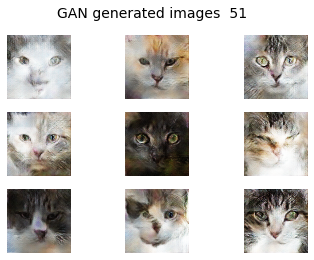

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:25,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.62it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:25,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.46it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 8/156 [00:01<00:28,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.51it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 16/156 [00:02<00:26,  5.36it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 17/156 [00:03<00:25,  5.46it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.66it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.53it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.39it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:22,  5.83it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 28/156 [00:05<00:22,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.64it/s]

1/1 [==============================] - 0s 50ms/step


 21%|██        | 32/156 [00:05<00:22,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 33/156 [00:05<00:22,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.52it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.47it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 42/156 [00:07<00:21,  5.40it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 43/156 [00:07<00:23,  4.77it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 44/156 [00:08<00:22,  4.87it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 45/156 [00:08<00:21,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:08<00:19,  5.53it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 48/156 [00:08<00:20,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:20,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 50/156 [00:09<00:20,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 57/156 [00:10<00:16,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:16,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 60/156 [00:10<00:16,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:11<00:16,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:17,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 64/156 [00:11<00:17,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.31it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 77/156 [00:14<00:21,  3.66it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:19,  4.07it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 79/156 [00:14<00:17,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 80/156 [00:14<00:16,  4.54it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 81/156 [00:15<00:15,  4.91it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 82/156 [00:15<00:15,  4.88it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:14,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:16<00:13,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:16<00:13,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.28it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 89/156 [00:16<00:13,  5.11it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 92/156 [00:17<00:11,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:17<00:12,  4.91it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:12,  5.12it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 95/156 [00:17<00:12,  4.92it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.00it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 97/156 [00:18<00:11,  4.99it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:18<00:11,  5.04it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 99/156 [00:18<00:11,  5.11it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:11,  5.00it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.11it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:19<00:10,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:19<00:10,  5.24it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.46it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.52it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 108/156 [00:20<00:08,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:21<00:08,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:21<00:07,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.12it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 118/156 [00:22<00:06,  5.43it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 119/156 [00:22<00:06,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:23<00:05,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.75it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:24<00:04,  5.45it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.41it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:25<00:03,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.51it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:26<00:02,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 141/156 [00:26<00:02,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  4.89it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 145/156 [00:27<00:02,  5.22it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 146/156 [00:27<00:01,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.24it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 151/156 [00:28<00:00,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.45it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 156/156 [00:29<00:00,  5.36it/s]


1/1 [==============================] - 0s 21ms/step


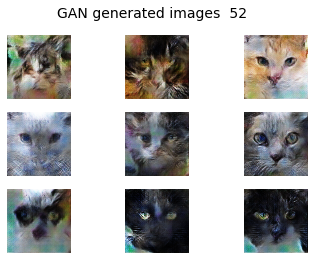

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/156 [00:00<00:26,  5.87it/s]

1/1 [==============================] - 0s 36ms/step


  1%|▏         | 2/156 [00:00<00:29,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/156 [00:00<00:29,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 10/156 [00:01<00:24,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.67it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 16/156 [00:02<00:25,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:25,  5.50it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 18/156 [00:03<00:26,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.34it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:28,  4.81it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:04<00:27,  4.92it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:26,  5.05it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 24/156 [00:04<00:25,  5.17it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 25/156 [00:04<00:25,  5.19it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.32it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 27/156 [00:05<00:24,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.22it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.33it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 31/156 [00:05<00:23,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:22,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 33/156 [00:06<00:22,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:21,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 39/156 [00:07<00:19,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 40/156 [00:07<00:19,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 41/156 [00:07<00:19,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:19,  5.58it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 48/156 [00:08<00:20,  5.32it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 49/156 [00:08<00:20,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.29it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.42it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.34it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.38it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 59/156 [00:10<00:18,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 63/156 [00:11<00:16,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:11<00:16,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.38it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 66/156 [00:12<00:17,  5.22it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:13<00:15,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:13<00:14,  5.60it/s]

1/1 [==============================] - 0s 52ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 75/156 [00:13<00:15,  5.36it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 76/156 [00:13<00:15,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 77/156 [00:14<00:15,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:14,  5.39it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 81/156 [00:14<00:14,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.33it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:12,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:12,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.40it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.48it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.38it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.43it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▌   | 102/156 [00:18<00:10,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 103/156 [00:18<00:10,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:19<00:09,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 108/156 [00:19<00:09,  5.30it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.30it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:20<00:07,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 114/156 [00:21<00:07,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.43it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.22it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:21<00:07,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.51it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.68it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.46it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.47it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.34it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.48it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.56it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.66it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.63it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 156/156 [00:28<00:00,  5.44it/s]


1/1 [==============================] - 0s 24ms/step


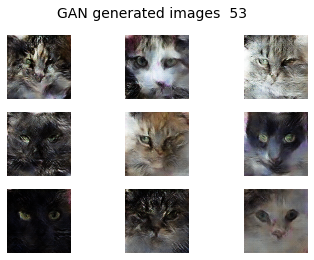

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 1/156 [00:00<00:26,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:28,  5.27it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 6/156 [00:01<00:28,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:28,  5.23it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 8/156 [00:01<00:28,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:28,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:27,  5.38it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 11/156 [00:02<00:28,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.45it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:25,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:26,  5.31it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 18/156 [00:03<00:26,  5.14it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 19/156 [00:03<00:28,  4.89it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 20/156 [00:03<00:28,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 21/156 [00:04<00:27,  4.96it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 22/156 [00:04<00:27,  4.94it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▍        | 23/156 [00:04<00:28,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 24/156 [00:04<00:27,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 25/156 [00:04<00:27,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 26/156 [00:05<00:27,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 27/156 [00:05<00:27,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 28/156 [00:05<00:26,  4.77it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▊        | 29/156 [00:05<00:27,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 30/156 [00:05<00:27,  4.59it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 31/156 [00:06<00:27,  4.53it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:06<00:28,  4.29it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 33/156 [00:06<00:28,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 34/156 [00:06<00:27,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 35/156 [00:07<00:26,  4.54it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 36/156 [00:07<00:25,  4.66it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 37/156 [00:07<00:26,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 38/156 [00:07<00:24,  4.74it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▌       | 39/156 [00:08<00:27,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 40/156 [00:08<00:26,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 41/156 [00:08<00:26,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 42/156 [00:08<00:25,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 43/156 [00:08<00:25,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 44/156 [00:09<00:24,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 45/156 [00:09<00:24,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 46/156 [00:09<00:23,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 47/156 [00:09<00:22,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 48/156 [00:09<00:21,  4.92it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 49/156 [00:10<00:21,  4.92it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 50/156 [00:10<00:21,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 51/156 [00:10<00:21,  4.96it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 52/156 [00:10<00:20,  4.98it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 53/156 [00:10<00:21,  4.85it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 54/156 [00:11<00:20,  4.96it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 55/156 [00:11<00:20,  4.95it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 56/156 [00:11<00:19,  5.02it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 57/156 [00:11<00:19,  4.98it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 58/156 [00:11<00:19,  4.94it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 59/156 [00:12<00:19,  4.85it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 60/156 [00:12<00:19,  4.93it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 61/156 [00:12<00:19,  4.89it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 62/156 [00:12<00:18,  4.95it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 63/156 [00:12<00:18,  4.99it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:13<00:17,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:13<00:17,  5.33it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 66/156 [00:13<00:16,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 67/156 [00:13<00:16,  5.29it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 68/156 [00:13<00:15,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 69/156 [00:14<00:16,  5.38it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 70/156 [00:14<00:16,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 71/156 [00:14<00:15,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:14<00:15,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 73/156 [00:14<00:14,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 74/156 [00:14<00:14,  5.61it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 75/156 [00:15<00:14,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 76/156 [00:15<00:14,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 77/156 [00:15<00:14,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 78/156 [00:15<00:13,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 79/156 [00:15<00:13,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 80/156 [00:15<00:13,  5.51it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 81/156 [00:16<00:13,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 82/156 [00:16<00:13,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 83/156 [00:16<00:13,  5.48it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 84/156 [00:16<00:13,  5.44it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 85/156 [00:16<00:12,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:17<00:12,  5.62it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 87/156 [00:17<00:13,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 88/156 [00:17<00:12,  5.42it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 89/156 [00:17<00:12,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:17<00:12,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:18<00:12,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:18<00:11,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:18<00:11,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:18<00:11,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 95/156 [00:18<00:10,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 96/156 [00:18<00:10,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:19<00:10,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:19<00:10,  5.73it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 99/156 [00:19<00:10,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 100/156 [00:19<00:09,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 101/156 [00:19<00:10,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:19<00:09,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 103/156 [00:20<00:09,  5.55it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 104/156 [00:20<00:09,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 105/156 [00:20<00:09,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:20<00:08,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:20<00:08,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 108/156 [00:21<00:08,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 109/156 [00:21<00:08,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 110/156 [00:21<00:08,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 111/156 [00:21<00:08,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 112/156 [00:21<00:07,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:21<00:07,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:22<00:07,  5.63it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 115/156 [00:22<00:07,  5.49it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 116/156 [00:22<00:07,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:22<00:06,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 118/156 [00:22<00:06,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 119/156 [00:22<00:06,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 120/156 [00:23<00:06,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 121/156 [00:23<00:06,  5.42it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 122/156 [00:23<00:06,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 123/156 [00:23<00:06,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 124/156 [00:23<00:05,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:24<00:05,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:24<00:05,  5.89it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 127/156 [00:24<00:05,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:24<00:04,  5.63it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 129/156 [00:24<00:05,  5.39it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 131/156 [00:25<00:04,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 132/156 [00:25<00:04,  5.33it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 133/156 [00:25<00:04,  5.12it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:25<00:04,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 135/156 [00:25<00:03,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:26<00:03,  5.40it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 137/156 [00:26<00:03,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:26<00:03,  5.49it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 139/156 [00:26<00:03,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 140/156 [00:26<00:02,  5.66it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 141/156 [00:27<00:02,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:27<00:02,  5.49it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 143/156 [00:27<00:02,  5.15it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 144/156 [00:27<00:02,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:27<00:02,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:27<00:01,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 147/156 [00:28<00:01,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:28<00:01,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 149/156 [00:28<00:01,  5.47it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 150/156 [00:28<00:01,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 151/156 [00:28<00:00,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:29<00:00,  5.63it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 153/156 [00:29<00:00,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 154/156 [00:29<00:00,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:29<00:00,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:29<00:00,  5.24it/s]


1/1 [==============================] - 0s 21ms/step


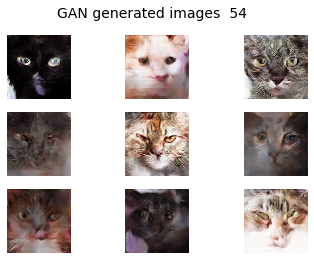

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/156 [00:00<00:29,  5.19it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.34it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/156 [00:00<00:28,  5.31it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 5/156 [00:00<00:28,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/156 [00:01<00:28,  5.21it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 7/156 [00:01<00:29,  5.14it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:27,  5.33it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 10/156 [00:01<00:28,  5.17it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 11/156 [00:02<00:27,  5.28it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:25,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 17/156 [00:03<00:25,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.53it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 22/156 [00:04<00:24,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.56it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.51it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.48it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 31/156 [00:05<00:24,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:23,  5.25it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 33/156 [00:06<00:23,  5.15it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 34/156 [00:06<00:23,  5.19it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 35/156 [00:06<00:23,  5.09it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:23,  5.21it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 37/156 [00:06<00:23,  5.13it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 38/156 [00:07<00:21,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 39/156 [00:07<00:22,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:08<00:20,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:19,  5.59it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 47/156 [00:08<00:20,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:09<00:19,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.68it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:19,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.41it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 59/156 [00:10<00:18,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.63it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 63/156 [00:11<00:17,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:11<00:16,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 65/156 [00:12<00:16,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:15,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 68/156 [00:12<00:15,  5.64it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:13<00:15,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:13<00:15,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:14<00:15,  5.22it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 77/156 [00:14<00:15,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.27it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 80/156 [00:14<00:14,  5.25it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 81/156 [00:14<00:14,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.38it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.25it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.47it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 87/156 [00:16<00:12,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.39it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:12,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:17<00:11,  5.55it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.66it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.57it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 100/156 [00:18<00:09,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.53it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 103/156 [00:19<00:09,  5.36it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.48it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 108/156 [00:19<00:09,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.40it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 113/156 [00:20<00:08,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:21<00:07,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.55it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 120/156 [00:22<00:09,  3.72it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 121/156 [00:22<00:08,  4.13it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:07,  4.49it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 123/156 [00:22<00:07,  4.66it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:23<00:06,  4.94it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 125/156 [00:23<00:06,  5.15it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.06it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.34it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 129/156 [00:24<00:05,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:25<00:04,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:25<00:04,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:02,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 140/156 [00:26<00:02,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:26<00:02,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.46it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 145/156 [00:27<00:02,  5.13it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 146/156 [00:27<00:01,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 151/156 [00:28<00:00,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


100%|██████████| 156/156 [00:29<00:00,  5.37it/s]


1/1 [==============================] - 0s 21ms/step


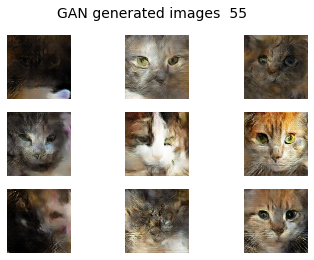

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 1/156 [00:00<00:29,  5.18it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.54it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 6/156 [00:01<00:28,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 13/156 [00:02<00:26,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.39it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 15/156 [00:02<00:26,  5.31it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█         | 16/156 [00:02<00:26,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:25,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 18/156 [00:03<00:24,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.53it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:28,  4.71it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 22/156 [00:04<00:26,  5.03it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 23/156 [00:04<00:25,  5.12it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.35it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 26/156 [00:04<00:26,  4.94it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 27/156 [00:05<00:24,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 31/156 [00:05<00:23,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:23,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:06<00:23,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:23,  5.12it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:07<00:22,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:22,  5.26it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:08<00:20,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.60it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.58it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 47/156 [00:08<00:19,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 48/156 [00:08<00:19,  5.68it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 49/156 [00:09<00:19,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.51it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 51/156 [00:09<00:19,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:19,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:10<00:18,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.51it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 63/156 [00:11<00:17,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:17,  5.28it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 65/156 [00:12<00:16,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.37it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:13<00:15,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.58it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:14<00:14,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.31it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 80/156 [00:14<00:14,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 81/156 [00:15<00:14,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.38it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.29it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:13,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:16<00:13,  5.24it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 88/156 [00:16<00:13,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.25it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 91/156 [00:16<00:12,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 92/156 [00:17<00:12,  5.32it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.38it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 97/156 [00:18<00:10,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.34it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.37it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.22it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:19<00:09,  5.63it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.26it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.30it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 107/156 [00:19<00:09,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 108/156 [00:20<00:09,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.25it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:21<00:08,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:21<00:07,  5.53it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 118/156 [00:21<00:07,  5.42it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▋  | 119/156 [00:22<00:06,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.30it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:23<00:05,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.36it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.11it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.16it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.14it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 135/156 [00:25<00:03,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 141/156 [00:26<00:02,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.38it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:27<00:01,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:28<00:00,  5.40it/s]


1/1 [==============================] - 0s 35ms/step


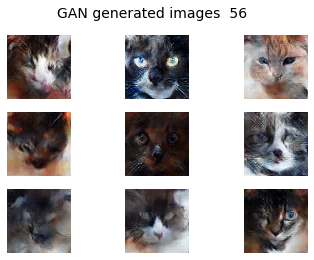

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1/156 [00:00<00:27,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/156 [00:00<00:25,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 8/156 [00:01<00:26,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.41it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 13/156 [00:02<00:27,  5.11it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 15/156 [00:02<00:26,  5.35it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 16/156 [00:02<00:27,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:26,  5.18it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 18/156 [00:03<00:26,  5.30it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.36it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 21/156 [00:03<00:25,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/156 [00:04<00:24,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.43it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 25/156 [00:04<00:24,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 27/156 [00:04<00:23,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 28/156 [00:05<00:23,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:21,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 33/156 [00:06<00:22,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.48it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 39/156 [00:07<00:21,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 40/156 [00:07<00:21,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.27it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 44/156 [00:08<00:21,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.33it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 46/156 [00:08<00:21,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:20,  5.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 48/156 [00:08<00:19,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:09<00:19,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:18,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:18,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 53/156 [00:09<00:18,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.53it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.35it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 59/156 [00:10<00:18,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:16,  5.59it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 63/156 [00:11<00:17,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 64/156 [00:11<00:16,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.58it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 66/156 [00:12<00:15,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.42it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.39it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 70/156 [00:12<00:15,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:13<00:15,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.43it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.29it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.54it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:13,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 84/156 [00:15<00:12,  5.56it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.38it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 89/156 [00:16<00:13,  5.15it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 90/156 [00:16<00:12,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 91/156 [00:16<00:12,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.47it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 93/156 [00:17<00:12,  5.20it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 94/156 [00:17<00:12,  5.10it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.45it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:18<00:11,  4.93it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 102/156 [00:18<00:10,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.73it/s]

1/1 [==============================] - 0s 49ms/step


 70%|██████▉   | 109/156 [00:20<00:09,  5.09it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.37it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 113/156 [00:20<00:08,  5.26it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 114/156 [00:21<00:07,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.30it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 118/156 [00:21<00:07,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.55it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.38it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.07it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.26it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.23it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.41it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.47it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:01,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.70it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.47it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.45it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.60it/s]

1/1 [==============================] - 0s 43ms/step


100%|██████████| 156/156 [00:28<00:00,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


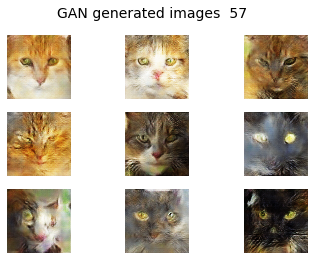

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:29,  5.28it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.57it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:28,  5.24it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.69it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.55it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 14/156 [00:02<00:25,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 15/156 [00:02<00:26,  5.31it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 16/156 [00:02<00:25,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 17/156 [00:03<00:25,  5.38it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 18/156 [00:03<00:26,  5.26it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.57it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.52it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 22/156 [00:04<00:24,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.38it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 25/156 [00:04<00:25,  5.20it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:23,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 27/156 [00:04<00:24,  5.32it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.47it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 30/156 [00:05<00:23,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 31/156 [00:05<00:23,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:23,  5.25it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 33/156 [00:06<00:23,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.33it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:07<00:20,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 44/156 [00:08<00:19,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:19,  5.57it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 46/156 [00:08<00:20,  5.44it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 47/156 [00:08<00:20,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:19,  5.60it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███▏      | 49/156 [00:08<00:19,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:21,  4.85it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:20,  5.07it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 53/156 [00:09<00:20,  5.00it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.33it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 55/156 [00:10<00:19,  5.24it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 56/156 [00:10<00:19,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 57/156 [00:10<00:19,  5.19it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 59/156 [00:10<00:17,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:11<00:17,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:11<00:17,  5.34it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 63/156 [00:11<00:17,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:17,  5.36it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 65/156 [00:12<00:17,  5.35it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 66/156 [00:12<00:16,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.24it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 69/156 [00:12<00:16,  5.21it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 70/156 [00:12<00:16,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:13<00:16,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:13<00:14,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 74/156 [00:13<00:14,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:13<00:15,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 76/156 [00:14<00:14,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 77/156 [00:14<00:15,  5.14it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:14,  5.26it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 79/156 [00:14<00:14,  5.14it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 80/156 [00:14<00:14,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 81/156 [00:15<00:14,  5.20it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:15<00:14,  5.24it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 83/156 [00:15<00:14,  5.03it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 86/156 [00:15<00:13,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 87/156 [00:16<00:13,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 88/156 [00:16<00:12,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:16<00:12,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 92/156 [00:17<00:11,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 93/156 [00:17<00:11,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 94/156 [00:17<00:10,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.32it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 102/156 [00:18<00:10,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:19<00:09,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 106/156 [00:19<00:08,  5.62it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 107/156 [00:19<00:08,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:20<00:09,  4.94it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.16it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.20it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 114/156 [00:21<00:07,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.65it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.46it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 119/156 [00:22<00:06,  5.53it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.46it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.32it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.31it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:02,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:26<00:02,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.36it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.10it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.38it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  4.93it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  4.94it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.22it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 156/156 [00:28<00:00,  5.40it/s]


1/1 [==============================] - 0s 23ms/step


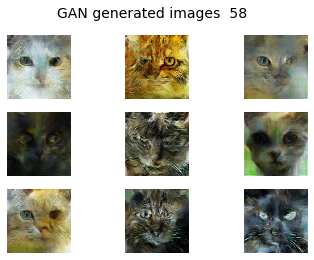

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:28,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7/156 [00:01<00:26,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 8/156 [00:01<00:24,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.66it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 11/156 [00:01<00:27,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:27,  5.26it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 13/156 [00:02<00:28,  5.07it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:26,  5.37it/s]

1/1 [==============================] - 0s 40ms/step


 10%|▉         | 15/156 [00:02<00:27,  5.20it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 16/156 [00:02<00:27,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 17/156 [00:03<00:26,  5.17it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 20/156 [00:03<00:26,  5.15it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 21/156 [00:03<00:26,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 22/156 [00:04<00:26,  5.14it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 23/156 [00:04<00:25,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:24,  5.31it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 25/156 [00:04<00:25,  5.08it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.27it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 27/156 [00:05<00:24,  5.24it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.20it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:24,  5.28it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 30/156 [00:05<00:24,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 31/156 [00:05<00:23,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:06<00:24,  5.09it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 33/156 [00:06<00:22,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:23,  5.30it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 35/156 [00:06<00:22,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:06<00:22,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:22,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 38/156 [00:07<00:20,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 39/156 [00:07<00:20,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 40/156 [00:07<00:20,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.51it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 43/156 [00:08<00:21,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 44/156 [00:08<00:20,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:08<00:20,  5.41it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 46/156 [00:08<00:19,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 47/156 [00:08<00:19,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 48/156 [00:08<00:19,  5.65it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 49/156 [00:09<00:21,  4.98it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 50/156 [00:09<00:19,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:09<00:20,  5.15it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:19,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 53/156 [00:09<00:19,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 54/156 [00:10<00:18,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 55/156 [00:10<00:18,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:10<00:18,  5.51it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 57/156 [00:10<00:18,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:10<00:18,  5.42it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 59/156 [00:10<00:18,  5.21it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 60/156 [00:11<00:18,  5.25it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 61/156 [00:11<00:18,  5.14it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:11<00:17,  5.25it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 63/156 [00:11<00:18,  5.02it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:11<00:18,  5.10it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 65/156 [00:12<00:18,  4.81it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 66/156 [00:12<00:17,  5.10it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 67/156 [00:12<00:16,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 68/156 [00:12<00:16,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:13<00:16,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:13<00:15,  5.54it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 72/156 [00:13<00:15,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 73/156 [00:13<00:15,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.46it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 75/156 [00:14<00:15,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:14<00:14,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:14<00:14,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:14<00:13,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 81/156 [00:15<00:13,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 82/156 [00:15<00:13,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:15<00:14,  5.20it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 84/156 [00:15<00:13,  5.32it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 85/156 [00:15<00:13,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:16<00:12,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:16<00:12,  5.71it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 88/156 [00:16<00:11,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 89/156 [00:16<00:11,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:16<00:11,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 91/156 [00:16<00:11,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 92/156 [00:17<00:10,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:17<00:10,  5.80it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 94/156 [00:17<00:11,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 95/156 [00:17<00:11,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 96/156 [00:17<00:11,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 98/156 [00:18<00:10,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 99/156 [00:18<00:10,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 100/156 [00:18<00:10,  5.42it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 101/156 [00:18<00:10,  5.37it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:19<00:09,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:19<00:09,  5.65it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 105/156 [00:19<00:09,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:19<00:09,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 107/156 [00:19<00:09,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 108/156 [00:20<00:08,  5.36it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 109/156 [00:20<00:08,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 110/156 [00:20<00:08,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:20<00:08,  5.43it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 113/156 [00:20<00:08,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:21<00:07,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:21<00:07,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:21<00:07,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:21<00:07,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.64it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 120/156 [00:22<00:06,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 121/156 [00:22<00:06,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:22<00:06,  5.35it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  4.99it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:06,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:23<00:05,  5.20it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 126/156 [00:23<00:05,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:23<00:05,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 130/156 [00:24<00:04,  5.55it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 131/156 [00:24<00:04,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 132/156 [00:24<00:04,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:24<00:04,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 136/156 [00:25<00:03,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 137/156 [00:25<00:03,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:25<00:03,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 139/156 [00:25<00:03,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:26<00:02,  5.32it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 142/156 [00:26<00:02,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 143/156 [00:26<00:02,  5.23it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 144/156 [00:26<00:02,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:26<00:02,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 146/156 [00:27<00:01,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:27<00:01,  5.41it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 148/156 [00:27<00:01,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:27<00:01,  5.37it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 150/156 [00:27<00:01,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:28<00:00,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 153/156 [00:28<00:00,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:28<00:00,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:28<00:00,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 156/156 [00:28<00:00,  5.40it/s]


1/1 [==============================] - 0s 21ms/step


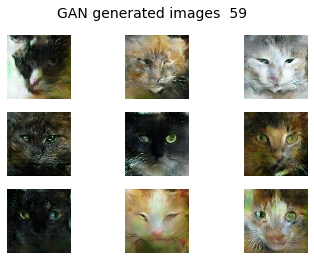

In [ ]:
## Build and train the model (need around 10 epochs to start seeing some results)

latent_dim = 256
discriminator, generator, gan = build_gan(dataset.shape[1:], latent_dim, filters=128)
dataset_scaled = load_real_samples(scale=True)

train_gan(generator, discriminator, gan, dataset_scaled, latent_dim, n_epochs=60) #20 epochs = default

*Note: the samples generated by small GANs are more diverse, when compared to VAEs, however some samples might look strange and do not resemble the data the model was trained on. 

In [ ]:
# Your code 

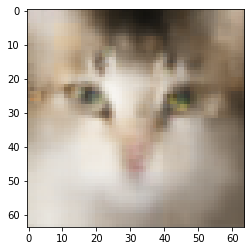

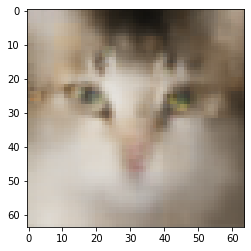

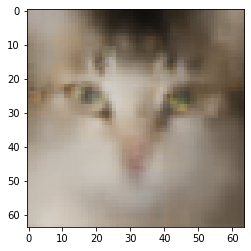

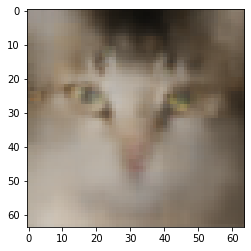

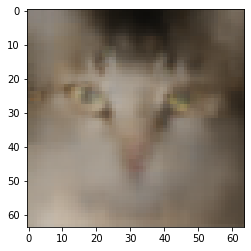

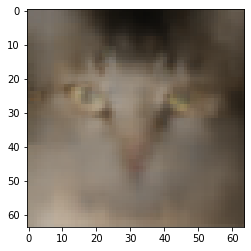

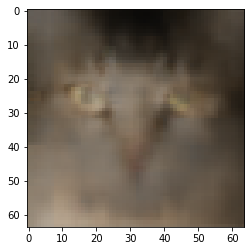

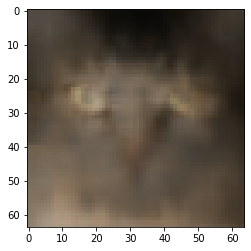

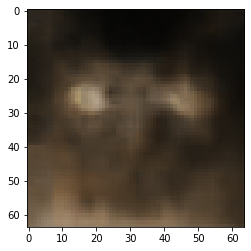

In [ ]:
#VAE
def NPtoImage(data,save=False, nr=0): #From NMPY format to image
    plt.imshow(data, cmap='gray')
    if save:
        filename = '/content/drive/MyDrive/DL2_results/generated_plot_e%03d_f.png' % (nr+1)
        plt.savefig(filename)
        plt.close()
    plt.show()

#*******************************************************************************
#GET THE MODEL
#encoder = Lencoder
#decoder = Ldecoder
#vae = Lmodel
latent_dim = 50
images = decoder(np.random.randn(2, latent_dim))

#*******************************************************************************
Steps = 9
VecStep = (images[1]-images[0])/Steps
VECS = [None]*Steps
VECS[0] = images[0]
VECS[Steps-1] = images[1]
for i in range(1,Steps-1):
    VECS[i] = VECS[i-1]+VecStep

#
for i in range(Steps):
    NPtoImage(VECS[i], save=False, nr=i)

1/1 [==============================] - 0s 15ms/step


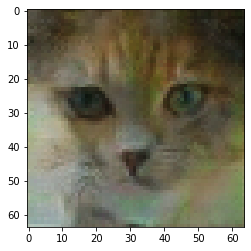

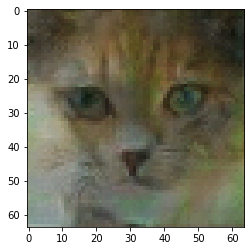

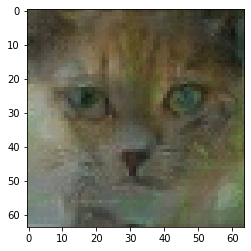

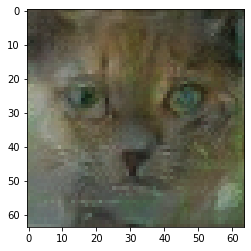

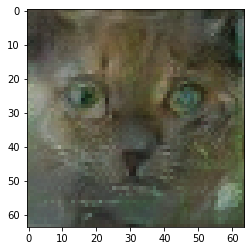

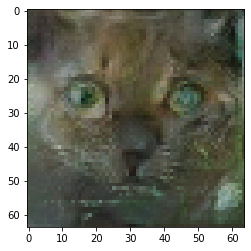

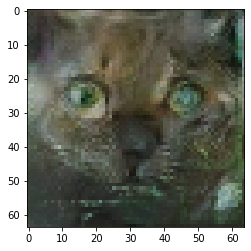

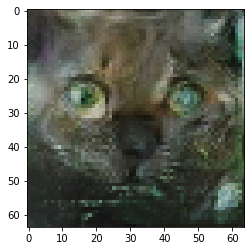

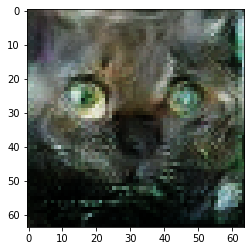

In [96]:
#VAE
def NPtoImage(data,save=False, nr=0): #From NMPY format to image
    plt.imshow(data, cmap='gray')
    if save:
        filename = '/content/drive/MyDrive/DL2_results/GAN_plot_e%03d_f.png' % (nr+1)
        plt.savefig(filename)
        plt.close()
    plt.show()

#*******************************************************************************
latent_dim = 256
noise = np.random.randn(2, latent_dim) #Use this for generating random vectors
images = generator.predict(noise)
images = (images + 1) / 2.0

#*******************************************************************************
Steps = 9
VecStep = (images[1]-images[0])/Steps
VECS = [None]*Steps
VECS[0] = images[0]
VECS[Steps-1] = images[1]
for i in range(1,Steps-1):
    VECS[i] = VECS[i-1]+VecStep

for i in range(Steps):
    NPtoImage(VECS[i], save=False, nr=i)